In [1]:
import numpy as np
import random as rd
import tensorflow as tf

from keras.layers import Dense, Embedding, Flatten, Input, concatenate, Dropout
from keras.models import Model
from keras.optimizers import Adagrad

#Import another jupyter notebook
import import_ipynb
from Productive_CrossValidation_inclTest import *
from Productive_Data_GetTrainTest import samEval

C:\Users\twitter\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


importing Jupyter notebook from Productive_CrossValidation_inclTest.ipynb
importing Jupyter notebook from Productive_TimeHistory.ipynb
importing Jupyter notebook from AttentionLayer.ipynb
importing Jupyter notebook from Productive_Data_GetTrainTest.ipynb


In [2]:
#for reproducability of the results
seed = 7
np.random.seed(seed)
tf.set_random_seed(seed)
rd.seed(seed)

In [3]:
path = 'data/'
outputpath ='outputs/04_dropout_samEval2018/'

In [4]:
#Load necessary data
train_data, train_labels, test_data, test_labels, word_index, MAX_SEQUENCE_LENGTH = samEval()

In [5]:
#Load pretrained embeddings
import gensim
from gensim.models import KeyedVectors

#Pretrained Google News Embeddings, Dimension 300
GOOGLEEMB = path + 'GoogleNews-vectors-negative300.bin'

embedding= KeyedVectors.load_word2vec_format(GOOGLEEMB, binary=True)

word_vectors = embedding.wv

C:\Users\twitter\Anaconda3\lib\site-packages\smart_open\smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
C:\Users\twitter\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  # Remove the CWD from sys.path while we load stuff.


In [6]:
#Create embedding-matrix, serves the Keras Embedding Layer as weigths
EMBEDDING_DIM=300

embedding_matrix = np.zeros((len(word_index)+1, EMBEDDING_DIM))

for word, i in word_index.items():
    try:
        embedding_vector = word_vectors[word]
        embedding_matrix[i] = embedding_vector   
    except:
        # words not found in embeddings will be zero
        pass

In [7]:
#Load POS data
def get_pos(file):
    pos =[]
    with open(file, 'r') as f:
        for line in f:
            pos.append([int(i) for i in line.split(',')])
    pos= np.asarray(pos)
    return pos

train_pos =get_pos('output_trainTestData/SamEval_train_pos.csv')
test_pos = get_pos('output_trainTestData/SamEval_test_pos.csv')

In [8]:
#Load Sentiment data
def get_sentiment(file):
    senti =[]
    with open(file, 'r') as f:
        for line in f:
            senti.append([float(i) for i in line.split(',')])
    senti= np.asarray(senti)
    return senti

train_senti_blob =get_sentiment('output_trainTestData/SamEval_train_data_sentiment_blob.csv')
test_senti_blob = get_sentiment('output_trainTestData/SamEval_test_data_sentiment_blob.csv')

### Hyperparameter for all models

In [9]:
BATCH_SIZE = 64
NUM_EPOCHS = 30
softmax = True
lossfunction ='binary_crossentropy'
optimizer = Adagrad(lr=0.001)

Instructions for updating:
Colocations handled automatically by placer.


# Dropout on input layer

### dropout rate = 0.2

In [12]:
#Word Embeddings
wv_layer = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences = wv_layer(input_embedding)
drop_embedding = Dropout(0.2)(embedded_sequences)
x_embedding = Dense(600, activation='relu')(drop_embedding)
x_embedding = Flatten()(x_embedding)

#Sentiment Features
input_sentiment = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment = Dropout(0.2)(input_sentiment)
x_sentiment = Dense(600, activation='relu')(drop_sentiment)

#POS Features
input_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos = Dropout(0.2)(input_pos)
x_pos = Dense(600, activation='relu')(drop_pos)

#Concatination
concat = concatenate([x_embedding, x_sentiment, x_pos])
preds = Dense(2, activation='softmax')(concat)

model = Model(inputs=[input_embedding, input_sentiment, input_pos], outputs=preds)

Instructions for updating:
Use tf.cast instead.

-----Fold 1--------


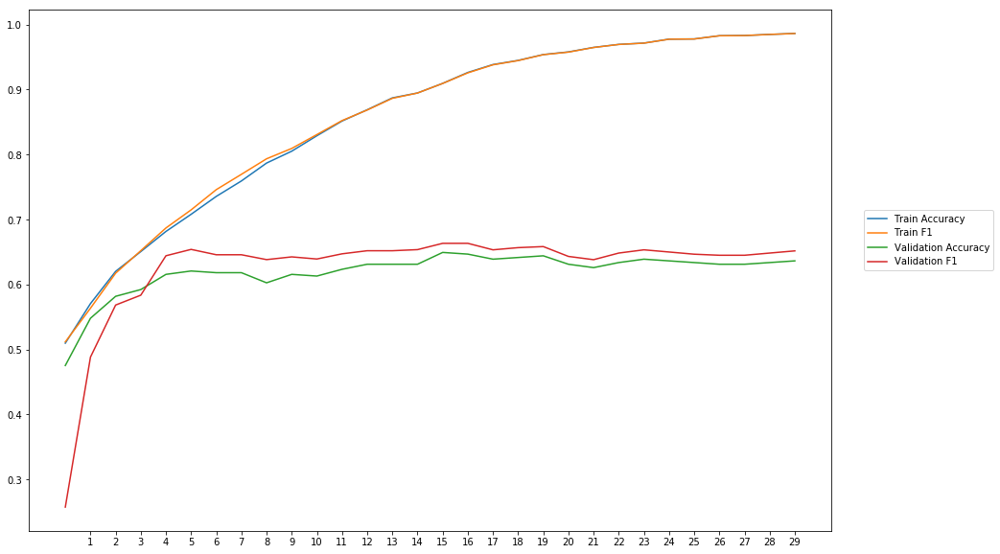

Average Accuracy: 61.90%
Average Precision: 60.63%
Average Recall: 65.33%
Average F1: 62.59%

-----Fold 2--------


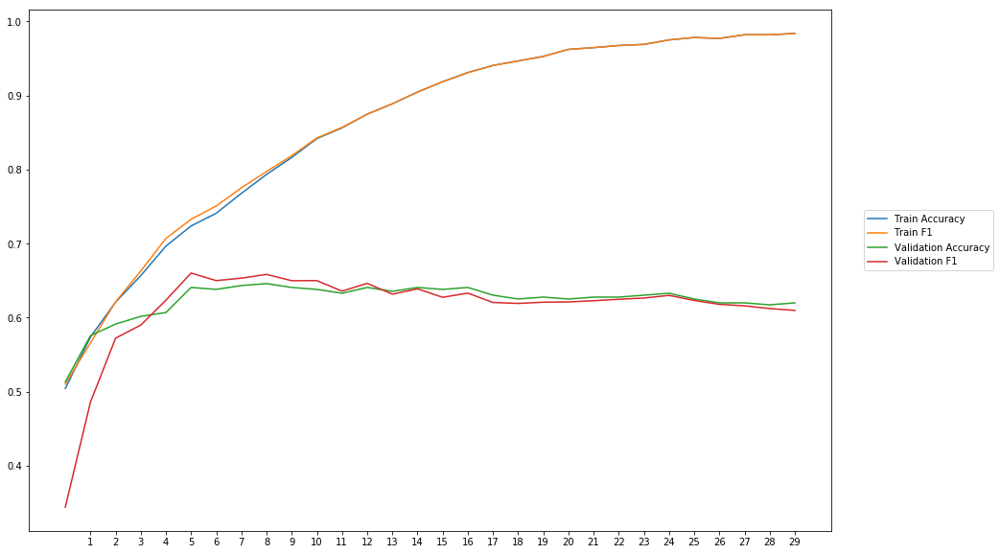

Average Accuracy: 62.30%
Average Precision: 62.16%
Average Recall: 61.10%
Average F1: 61.37%

-----Fold 3--------


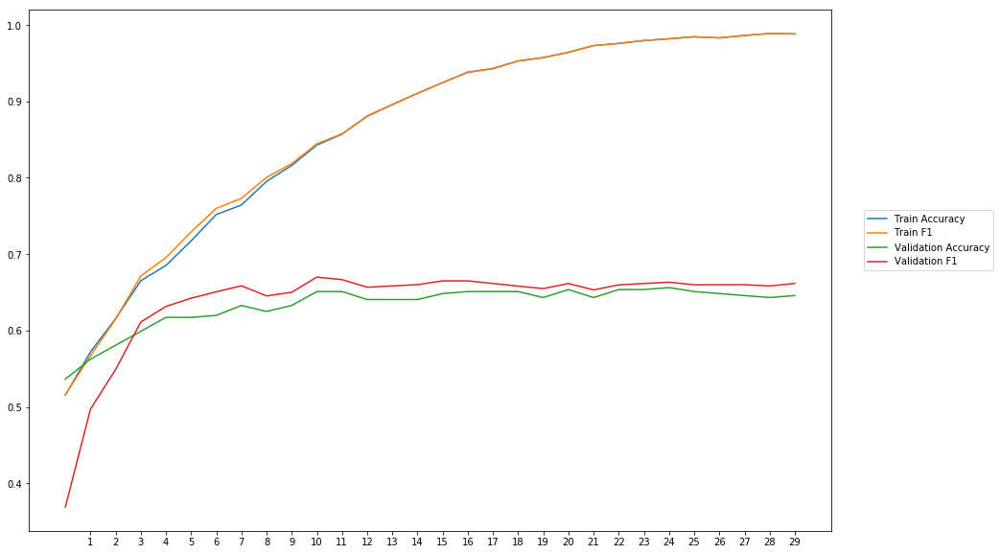

Average Accuracy: 63.29%
Average Precision: 62.25%
Average Recall: 65.93%
Average F1: 63.73%

-----Fold 4--------


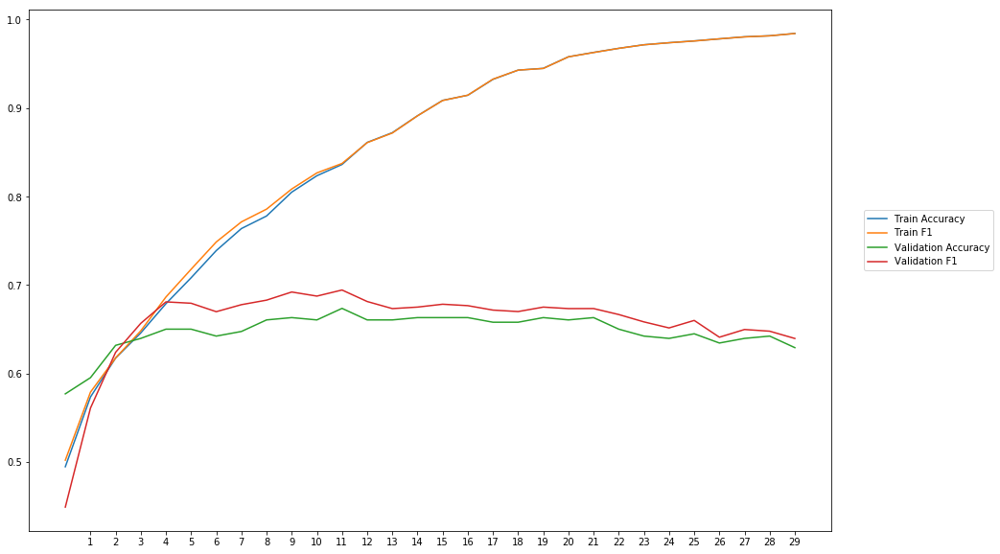

Average Accuracy: 64.76%
Average Precision: 63.61%
Average Recall: 68.55%
Average F1: 65.73%

-----Fold 5--------


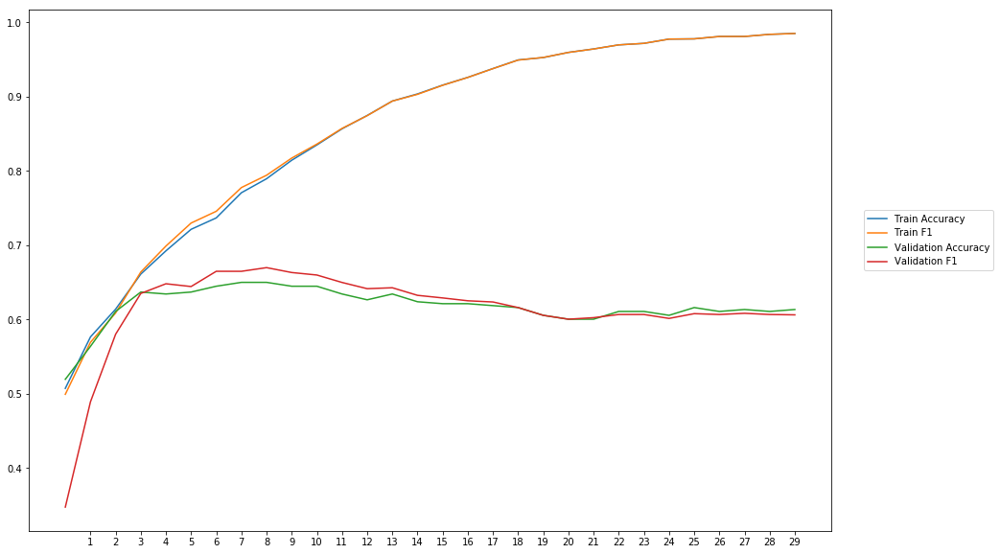

Average Accuracy: 61.78%
Average Precision: 61.50%
Average Recall: 61.66%
Average F1: 61.30%

-----Fold 6--------


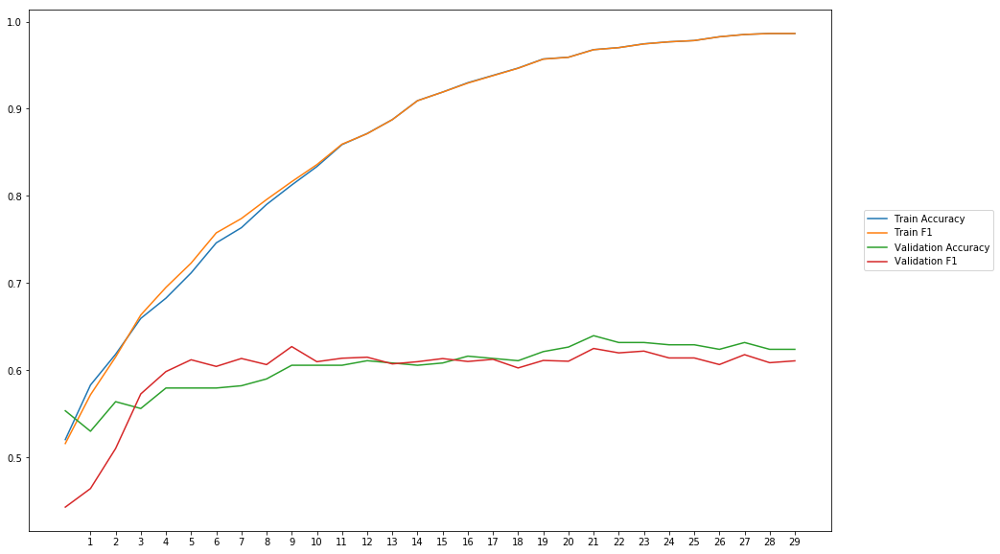

Average Accuracy: 60.40%
Average Precision: 60.60%
Average Recall: 59.25%
Average F1: 59.69%

-----Fold 7--------


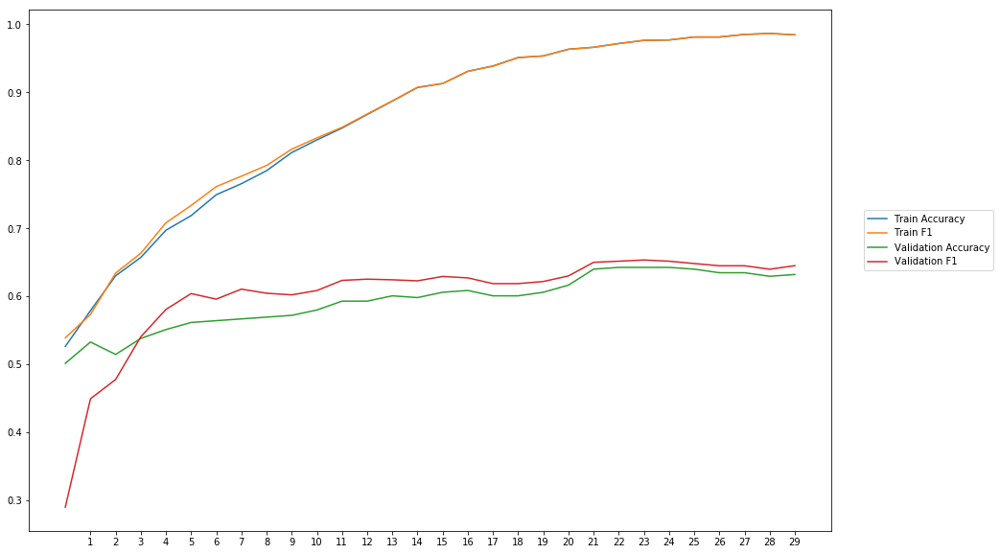

Average Accuracy: 59.36%
Average Precision: 58.47%
Average Recall: 62.62%
Average F1: 60.09%

-----Fold 8--------


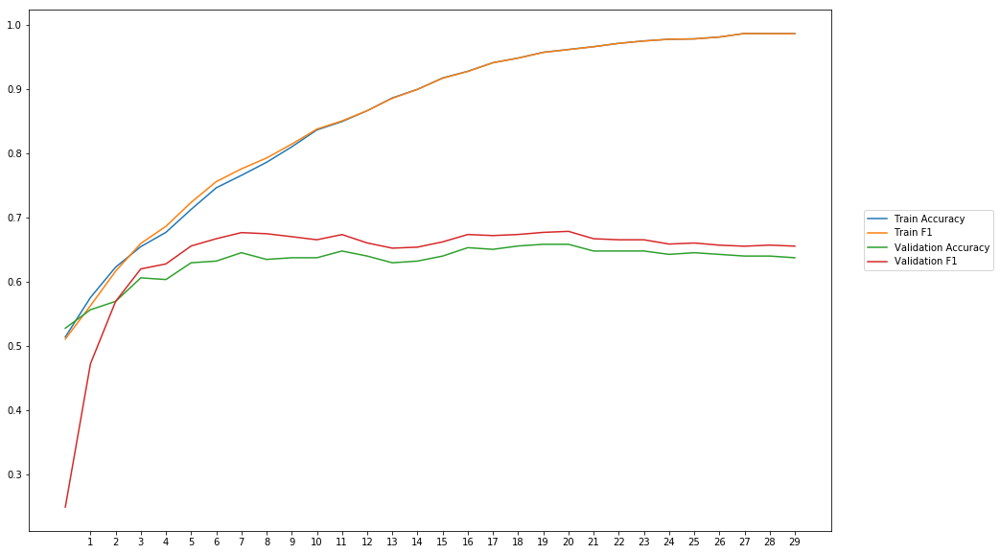

Average Accuracy: 63.09%
Average Precision: 61.84%
Average Recall: 67.36%
Average F1: 63.86%

-----Fold 9--------


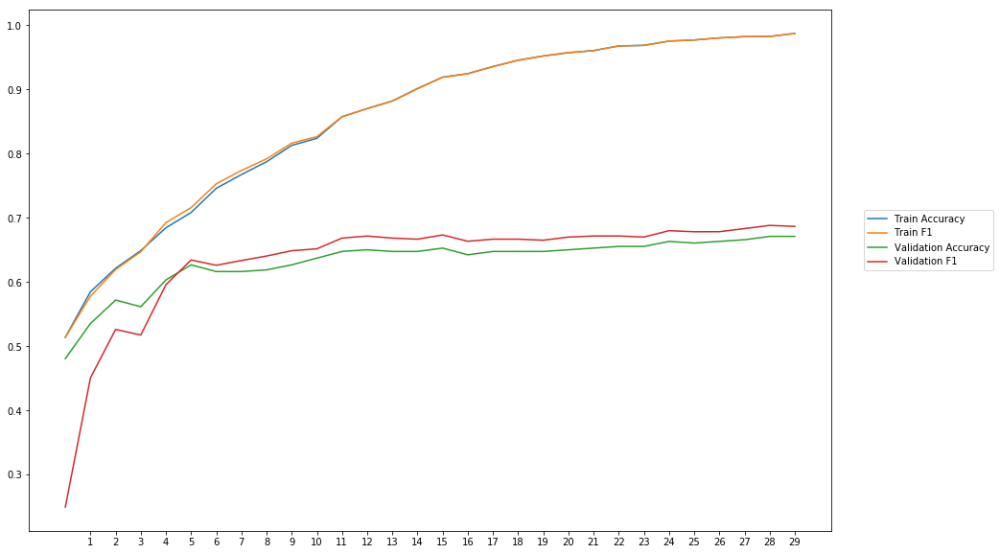

Average Accuracy: 63.11%
Average Precision: 61.83%
Average Recall: 65.46%
Average F1: 63.20%

-----Fold 10--------


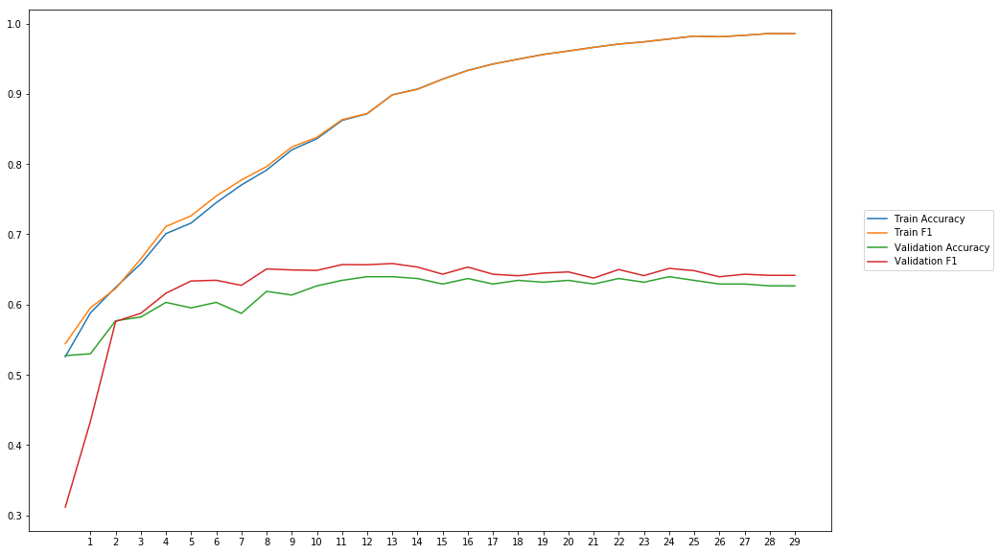

Average Accuracy: 61.65%
Average Precision: 60.74%
Average Recall: 64.68%
Average F1: 62.21%

-------Overallresults-------


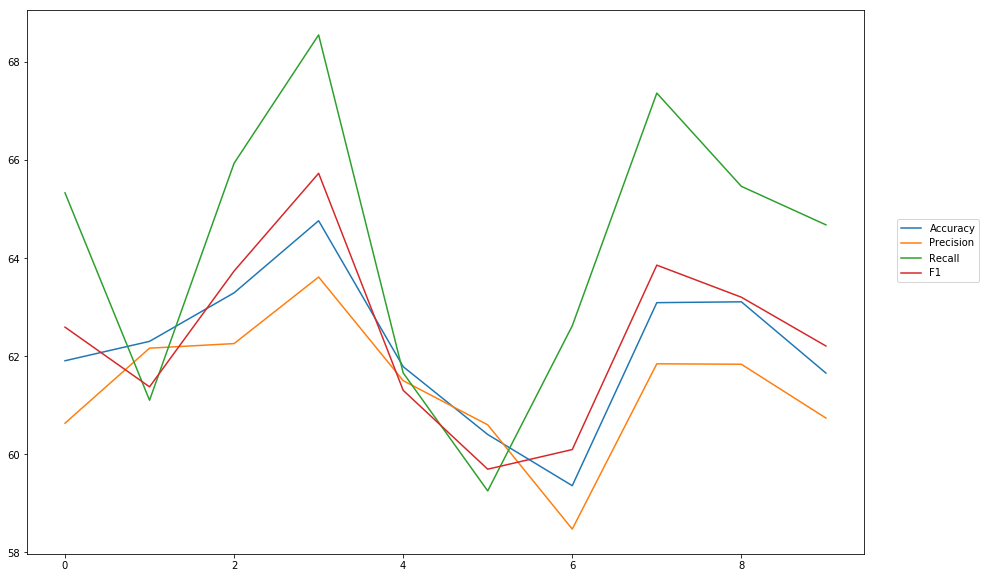

Accuracy: Mean = 62.16% (+/- 1.46%), Max = 64.76%, Min =  59.36%
Precision: Mean = 61.36% (+/- 1.30%), Max = 63.61%, Min =  58.47%
Recall: Mean = 64.19% (+/- 2.80%), Max = 68.55%, Min =  59.25%
F1: Mean = 62.38% (+/- 1.75%), Max = 65.73%, Min =  59.69%


In [11]:
cross_val_three_inputs(model, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInput0_2')

### dropout rate = 0.3

In [12]:
#Word Embeddings
wv_layer_2 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_2 = wv_layer_2(input_embedding_2)
drop_embedding_2 = Dropout(0.3)(embedded_sequences_2)
x_embedding_2 = Dense(600, activation='relu')(drop_embedding_2)
x_embedding_2 = Flatten()(x_embedding_2)

#Sentiment Features
input_sentiment_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_2 = Dropout(0.3)(input_sentiment_2)
x_sentiment_2 = Dense(600, activation='relu')(drop_sentiment_2)

#POS Features
input_pos_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_2 = Dropout(0.3)(input_pos_2)
x_pos_2 = Dense(600, activation='relu')(drop_pos_2)

#Concatination
concat_2 = concatenate([x_embedding_2, x_sentiment_2, x_pos_2])
preds_2 = Dense(2, activation='softmax')(concat_2)

model_2 = Model(inputs=[input_embedding_2, input_sentiment_2, input_pos_2], outputs=preds_2)


-----Fold 1--------


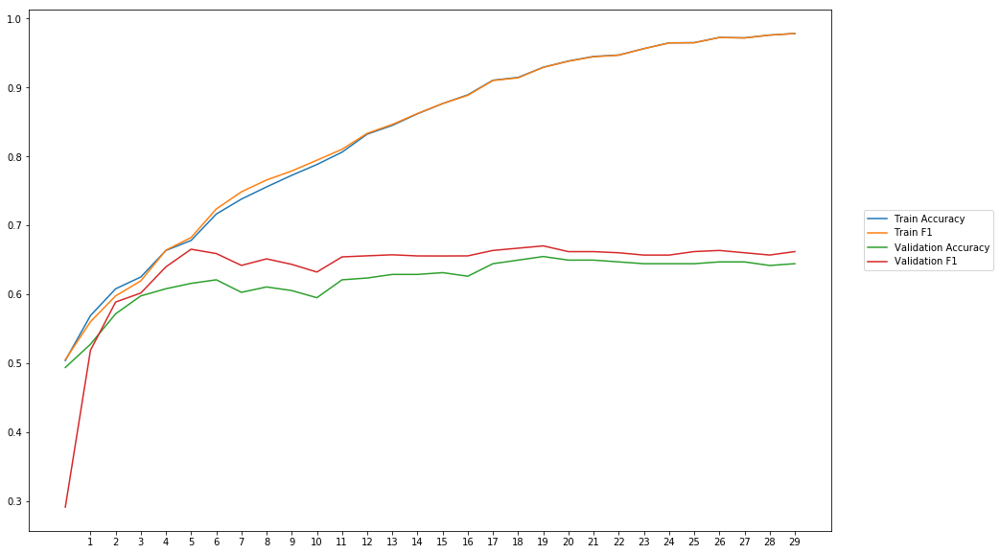

Average Accuracy: 62.03%
Average Precision: 60.50%
Average Recall: 67.59%
Average F1: 63.55%

-----Fold 2--------


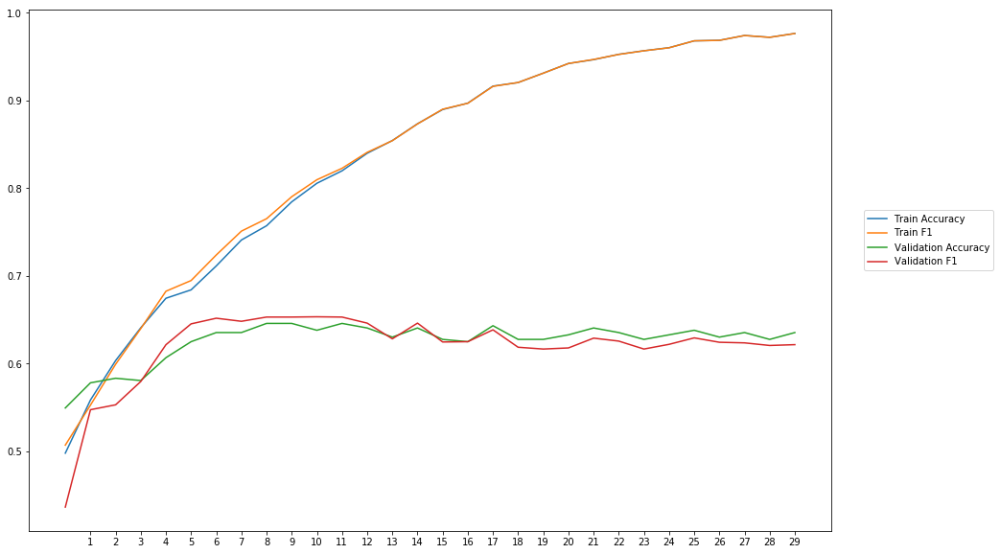

Average Accuracy: 62.56%
Average Precision: 62.49%
Average Recall: 61.62%
Average F1: 61.90%

-----Fold 3--------


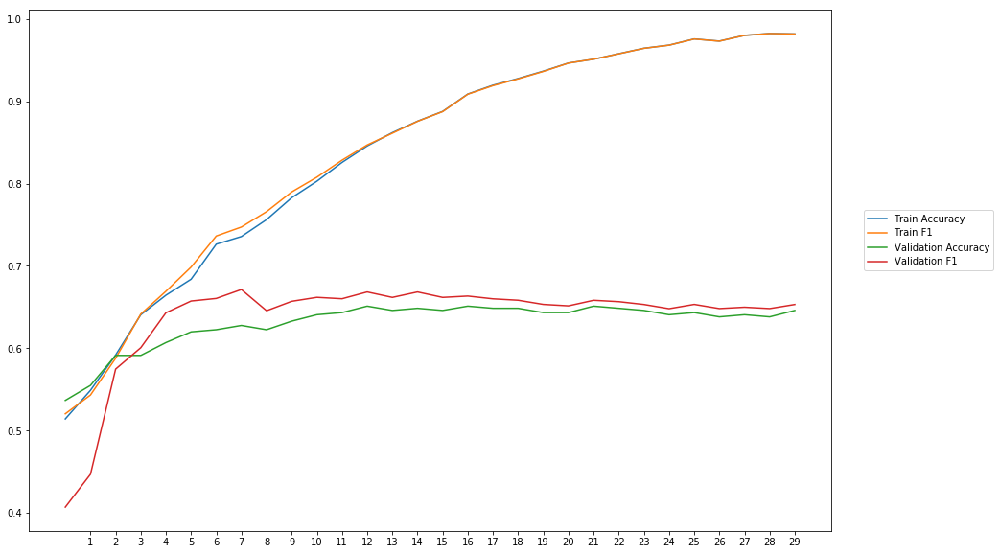

Average Accuracy: 63.02%
Average Precision: 61.92%
Average Recall: 66.20%
Average F1: 63.66%

-----Fold 4--------


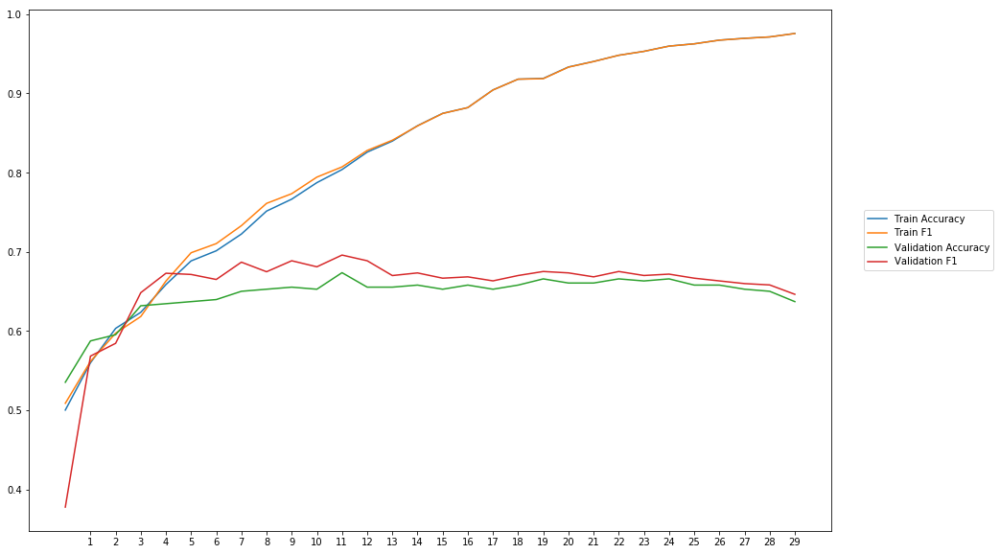

Average Accuracy: 64.58%
Average Precision: 63.34%
Average Recall: 68.38%
Average F1: 65.48%

-----Fold 5--------


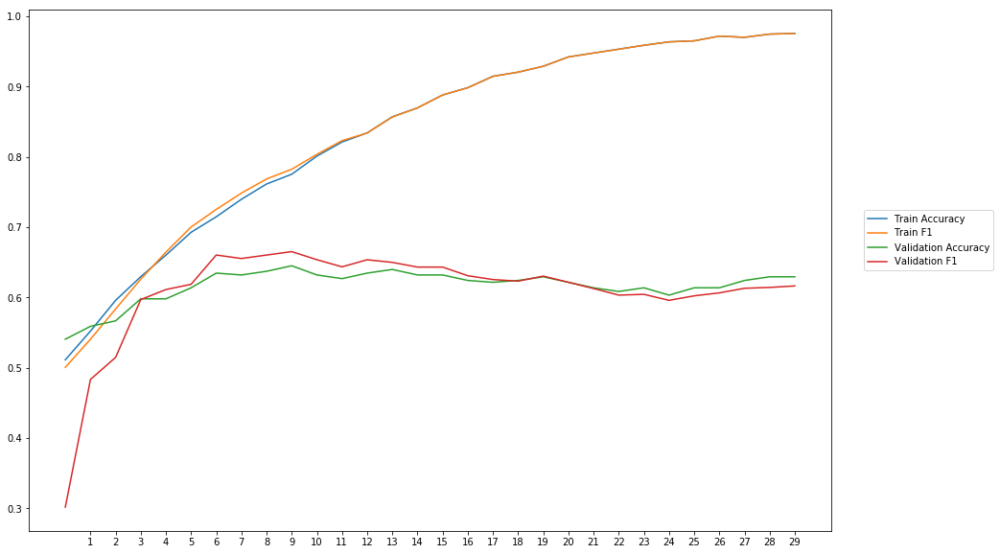

Average Accuracy: 61.63%
Average Precision: 61.59%
Average Recall: 61.12%
Average F1: 60.84%

-----Fold 6--------


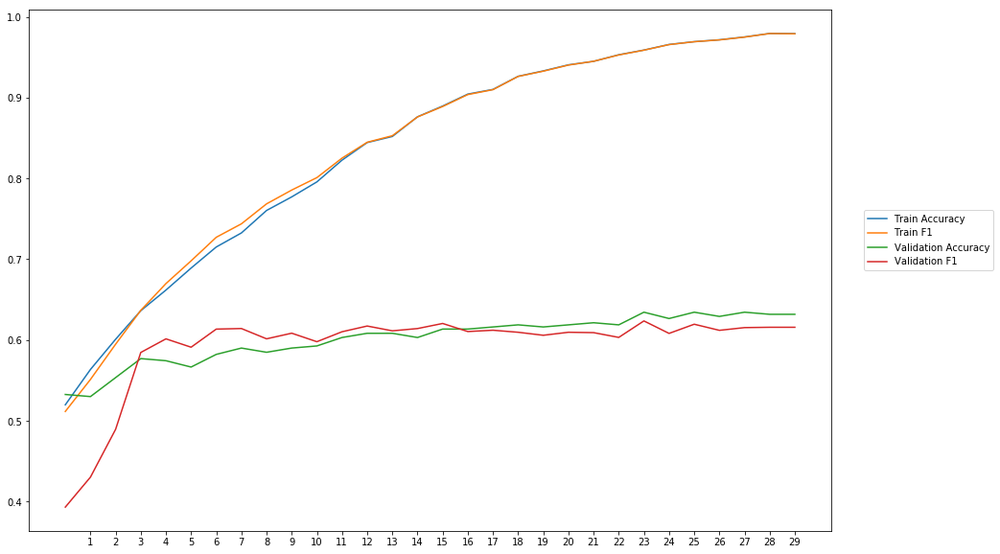

Average Accuracy: 60.19%
Average Precision: 60.39%
Average Recall: 58.69%
Average F1: 59.23%

-----Fold 7--------


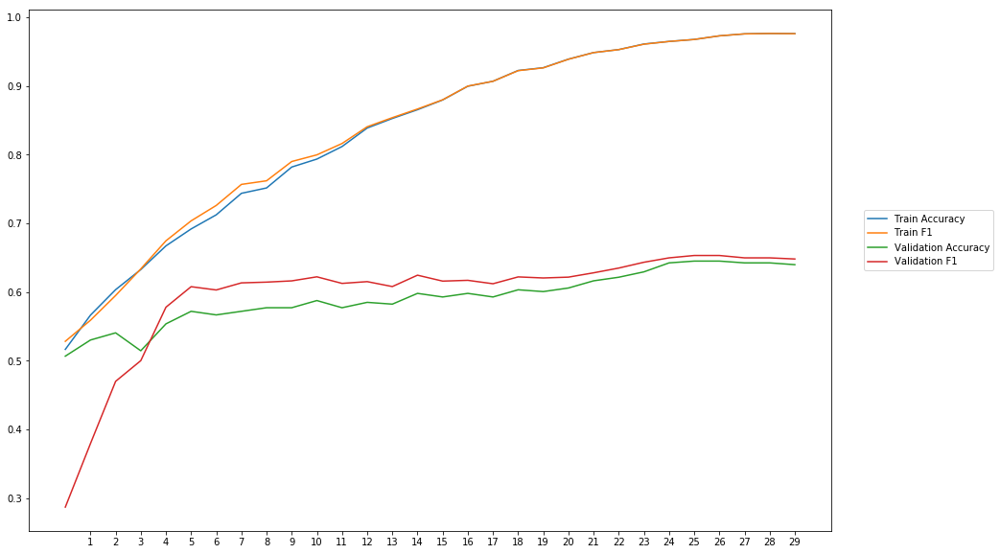

Average Accuracy: 59.18%
Average Precision: 58.41%
Average Recall: 61.92%
Average F1: 59.56%

-----Fold 8--------


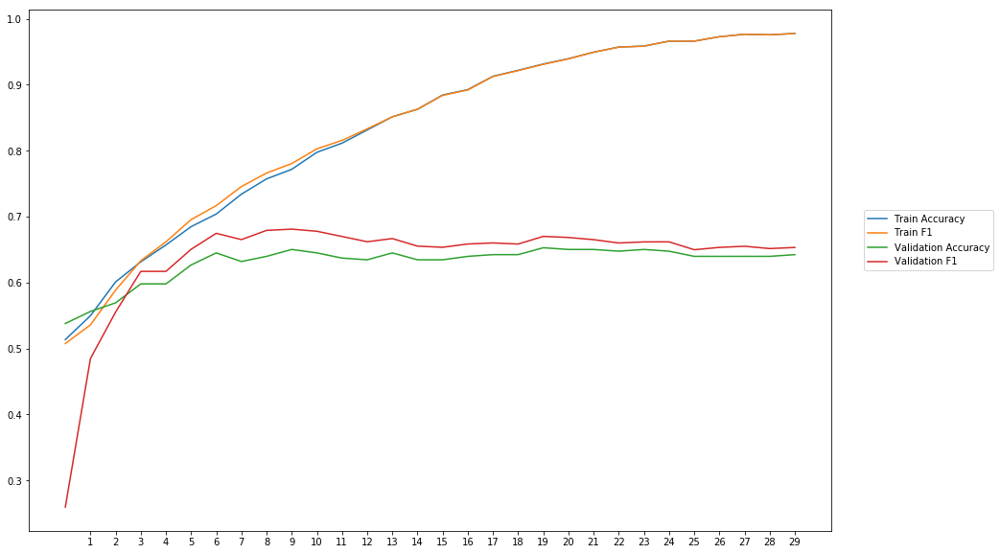

Average Accuracy: 63.02%
Average Precision: 62.00%
Average Recall: 66.82%
Average F1: 63.65%

-----Fold 9--------


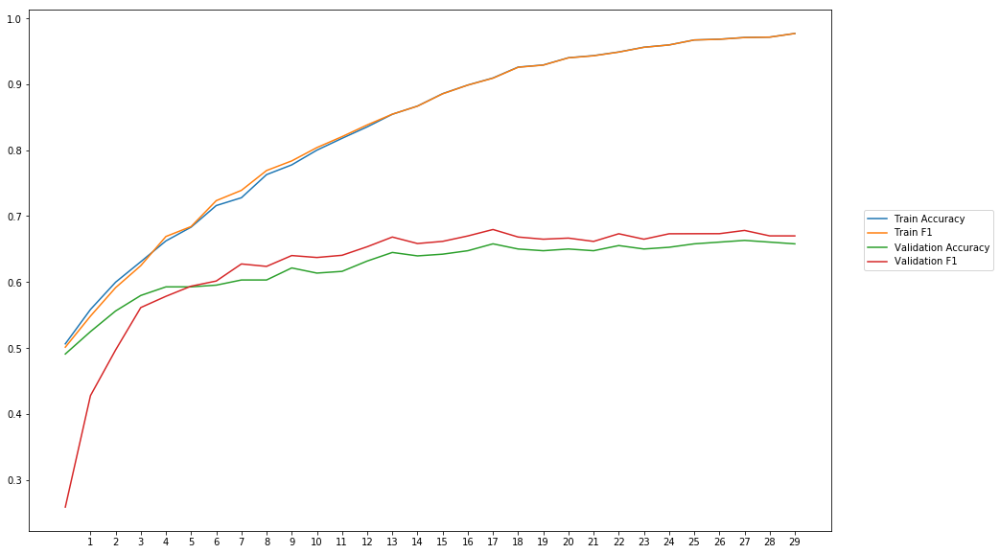

Average Accuracy: 62.36%
Average Precision: 61.23%
Average Recall: 64.49%
Average F1: 62.39%

-----Fold 10--------


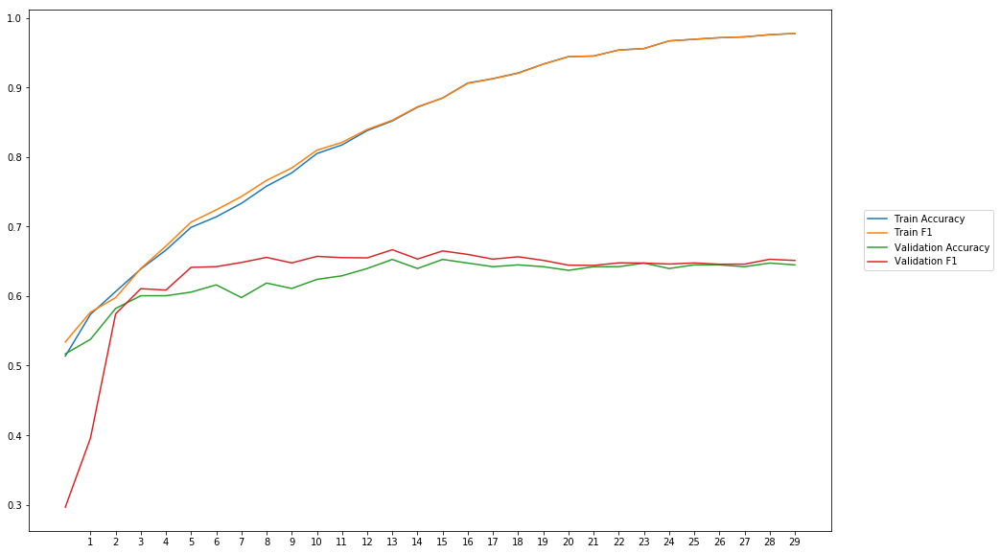

Average Accuracy: 62.45%
Average Precision: 61.67%
Average Recall: 64.57%
Average F1: 62.56%

-------Overallresults-------


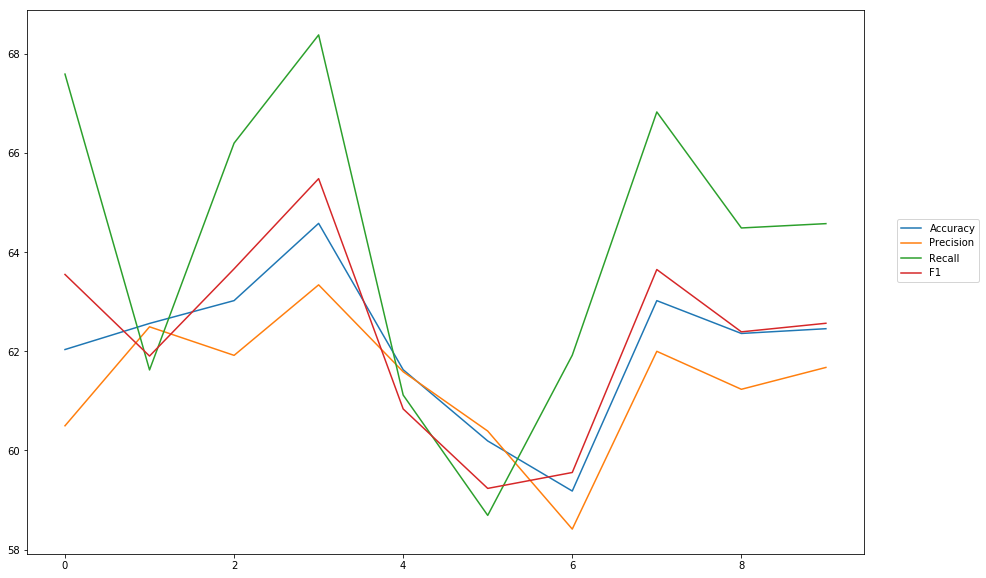

Accuracy: Mean = 62.10% (+/- 1.44%), Max = 64.58%, Min =  59.18%
Precision: Mean = 61.35% (+/- 1.28%), Max = 63.34%, Min =  58.41%
Recall: Mean = 64.14% (+/- 3.03%), Max = 68.38%, Min =  58.69%
F1: Mean = 62.28% (+/- 1.86%), Max = 65.48%, Min =  59.23%


In [13]:
cross_val_three_inputs(model_2, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInput0_3')

### dropout rate = 0.4

In [14]:
#Word Embeddings
wv_layer_3 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_3 = wv_layer_3(input_embedding_3)
drop_embedding_3 = Dropout(0.4)(embedded_sequences_3)
x_embedding_3 = Dense(600, activation='relu')(drop_embedding_3)
x_embedding_3 = Flatten()(x_embedding_3)

#Sentiment Features
input_sentiment_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_3 = Dropout(0.4)(input_sentiment_3)
x_sentiment_3 = Dense(600, activation='relu')(drop_sentiment_3)

#POS Features
input_pos_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_3 = Dropout(0.4)(input_pos_3)
x_pos_3 = Dense(600, activation='relu')(drop_pos_3)

#Concatination
concat_3 = concatenate([x_embedding_3, x_sentiment_3, x_pos_3])
preds_3 = Dense(2, activation='softmax')(concat_3)

model_3 = Model(inputs=[input_embedding_3, input_sentiment_3, input_pos_3], outputs=preds_3)


-----Fold 1--------


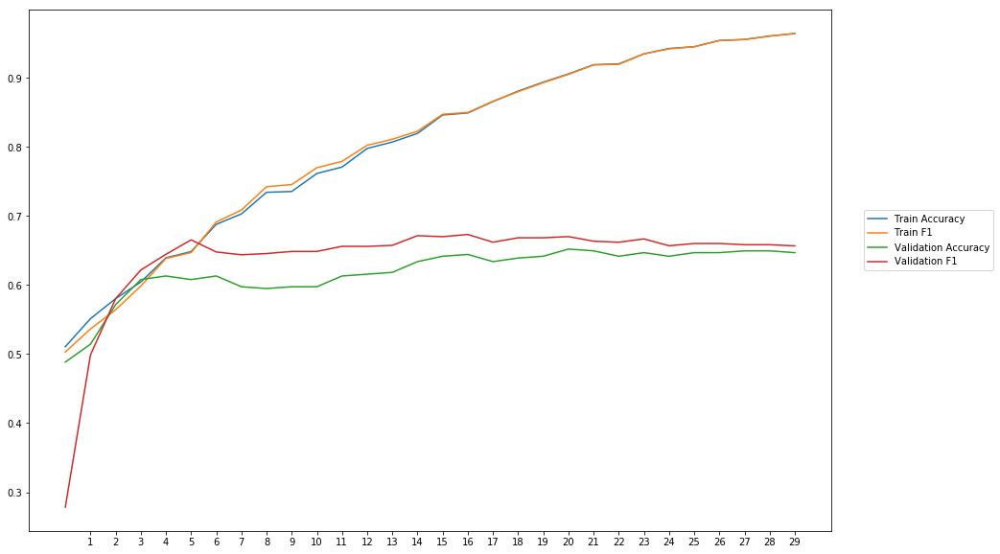

Average Accuracy: 61.84%
Average Precision: 60.10%
Average Recall: 68.59%
Average F1: 63.72%

-----Fold 2--------


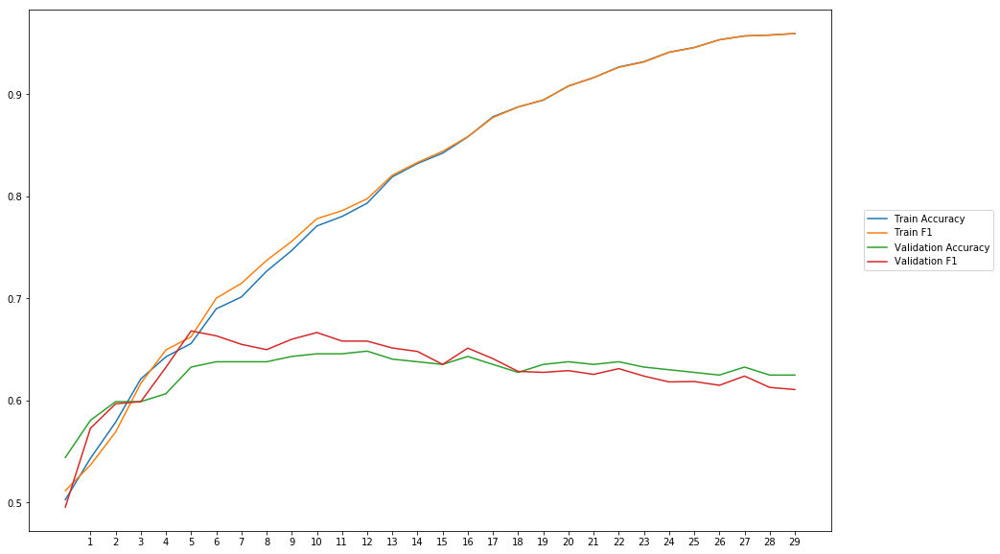

Average Accuracy: 62.75%
Average Precision: 62.24%
Average Recall: 63.79%
Average F1: 62.90%

-----Fold 3--------


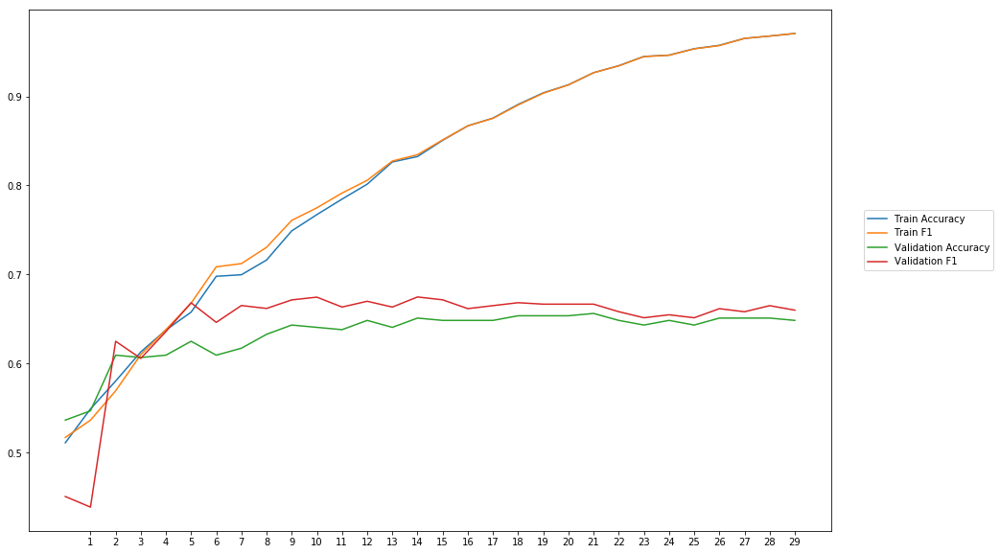

Average Accuracy: 63.34%
Average Precision: 61.94%
Average Recall: 67.80%
Average F1: 64.47%

-----Fold 4--------


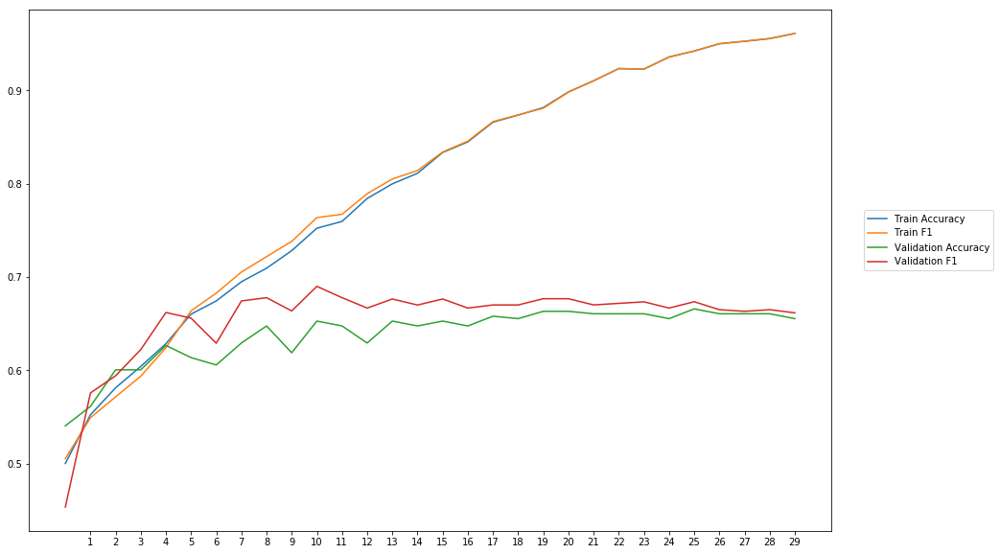

Average Accuracy: 63.85%
Average Precision: 62.41%
Average Recall: 69.18%
Average F1: 65.45%

-----Fold 5--------


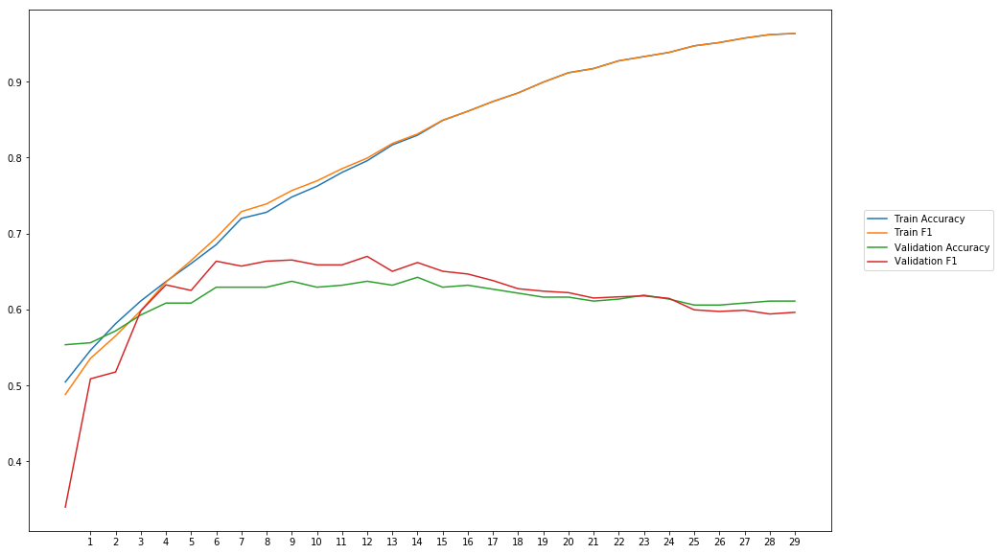

Average Accuracy: 61.43%
Average Precision: 61.02%
Average Recall: 62.91%
Average F1: 61.43%

-----Fold 6--------


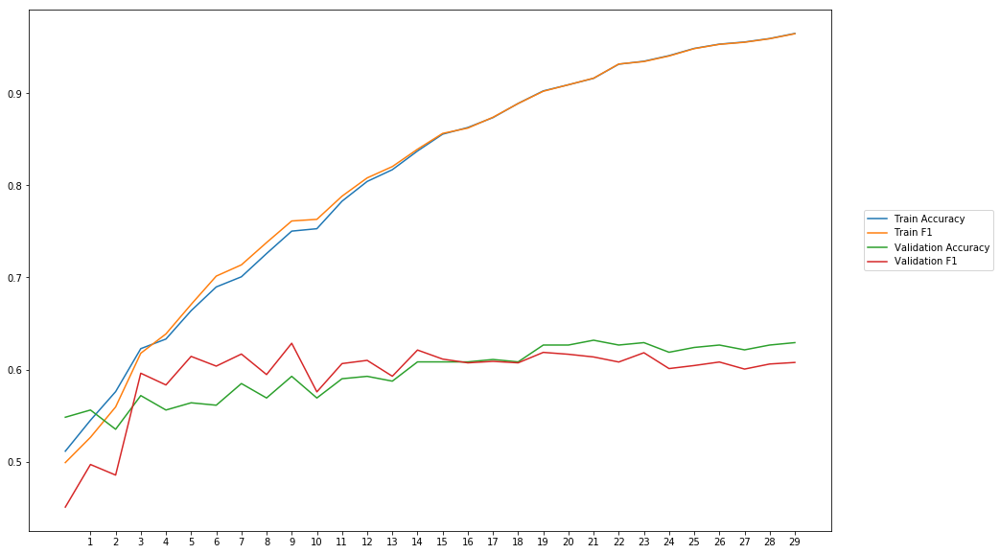

Average Accuracy: 59.70%
Average Precision: 59.82%
Average Recall: 59.49%
Average F1: 59.39%

-----Fold 7--------


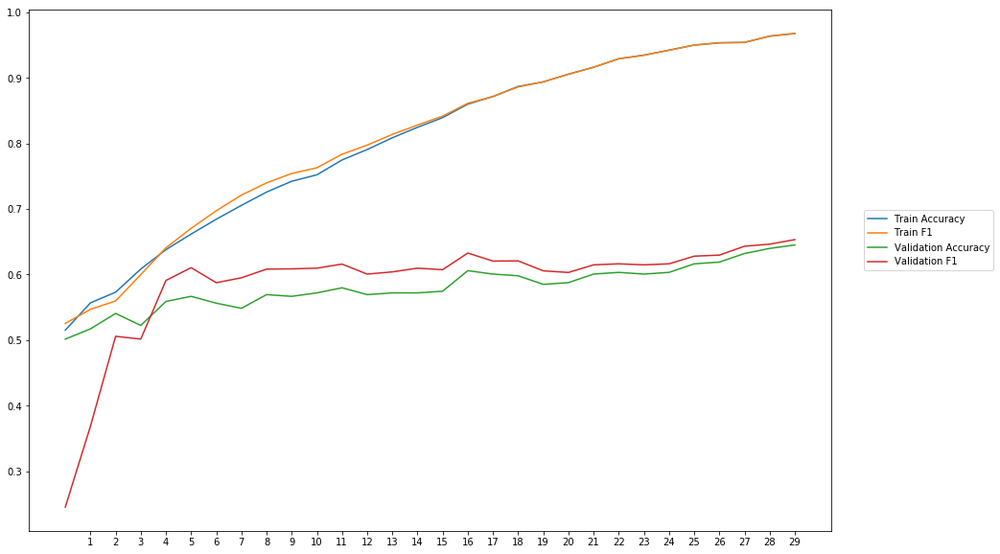

Average Accuracy: 58.07%
Average Precision: 57.23%
Average Recall: 61.50%
Average F1: 58.70%

-----Fold 8--------


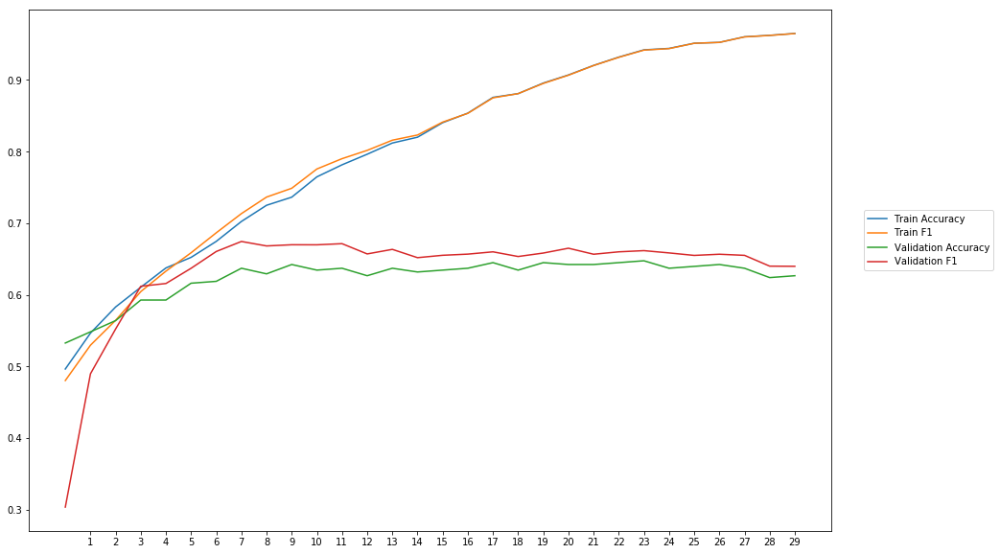

Average Accuracy: 62.40%
Average Precision: 61.16%
Average Recall: 66.93%
Average F1: 63.43%

-----Fold 9--------


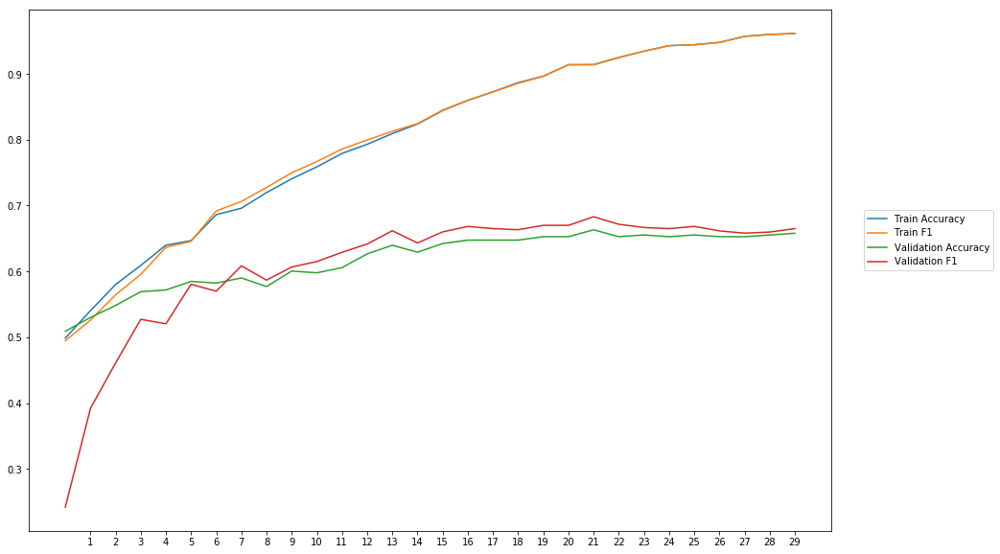

Average Accuracy: 61.84%
Average Precision: 61.23%
Average Recall: 61.95%
Average F1: 60.94%

-----Fold 10--------


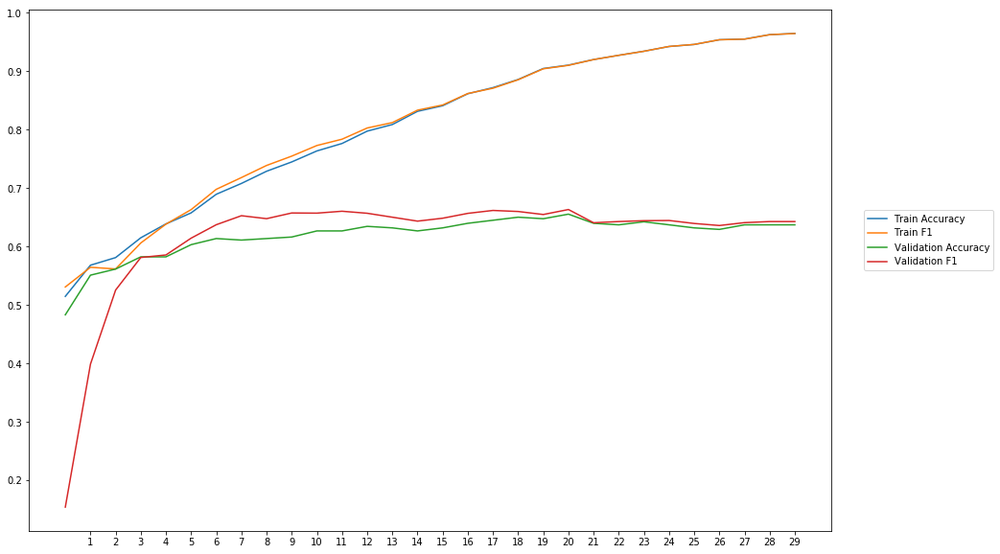

Average Accuracy: 61.87%
Average Precision: 60.88%
Average Recall: 63.42%
Average F1: 61.47%

-------Overallresults-------


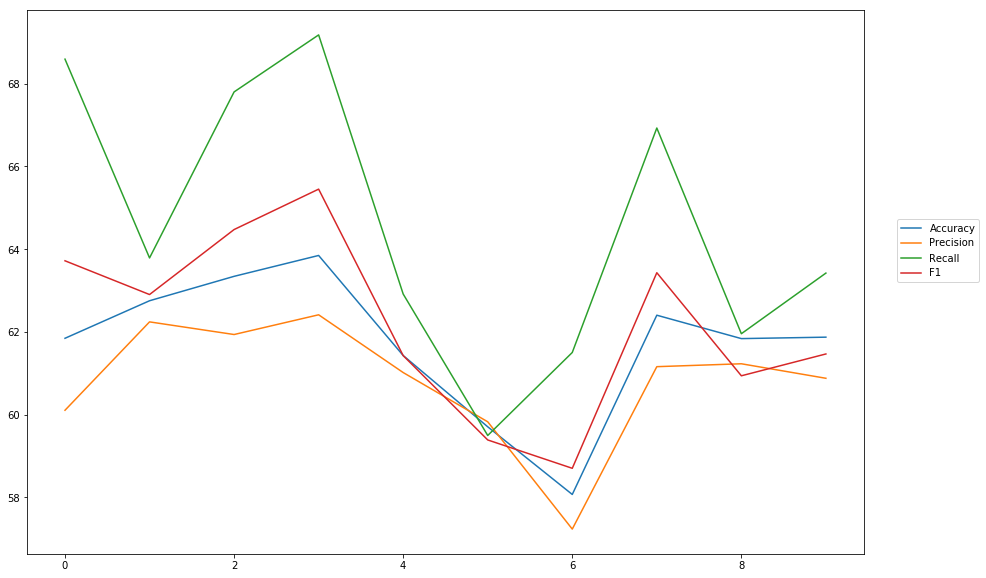

Accuracy: Mean = 61.71% (+/- 1.62%), Max = 63.85%, Min =  58.07%
Precision: Mean = 60.80% (+/- 1.43%), Max = 62.41%, Min =  57.23%
Recall: Mean = 64.56% (+/- 3.16%), Max = 69.18%, Min =  59.49%
F1: Mean = 62.19% (+/- 2.07%), Max = 65.45%, Min =  58.70%


In [15]:
cross_val_three_inputs(model_3, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInput0_4')

### dropout rate = 0.5

In [16]:
#Word Embeddings
wv_layer_4 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_4 = wv_layer_4(input_embedding_4)
drop_embedding_4 = Dropout(0.5)(embedded_sequences_4)
x_embedding_4 = Dense(600, activation='relu')(drop_embedding_4)
x_embedding_4 = Flatten()(x_embedding_4)

#Sentiment Features
input_sentiment_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_4 = Dropout(0.5)(input_sentiment_4)
x_sentiment_4 = Dense(600, activation='relu')(drop_sentiment_4)

#POS Features
input_pos_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_4 = Dropout(0.5)(input_pos_4)
x_pos_4 = Dense(600, activation='relu')(drop_pos_4)

#Concatination
concat_4 = concatenate([x_embedding_4, x_sentiment_4, x_pos_4])
preds_4 = Dense(2, activation='softmax')(concat_4)

model_4 = Model(inputs=[input_embedding_4, input_sentiment_4, input_pos_4], outputs=preds_4)


-----Fold 1--------


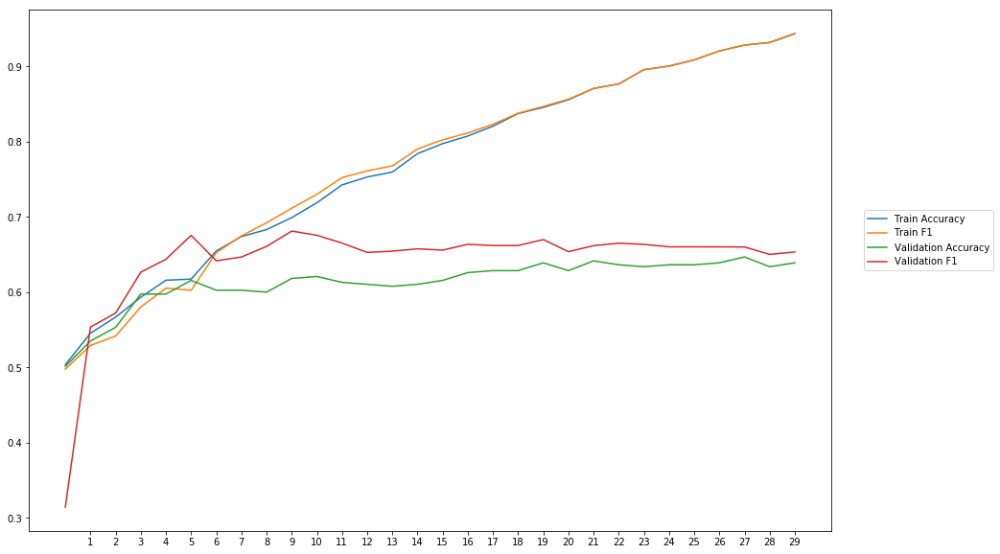

Average Accuracy: 61.32%
Average Precision: 59.33%
Average Recall: 70.47%
Average F1: 64.08%

-----Fold 2--------


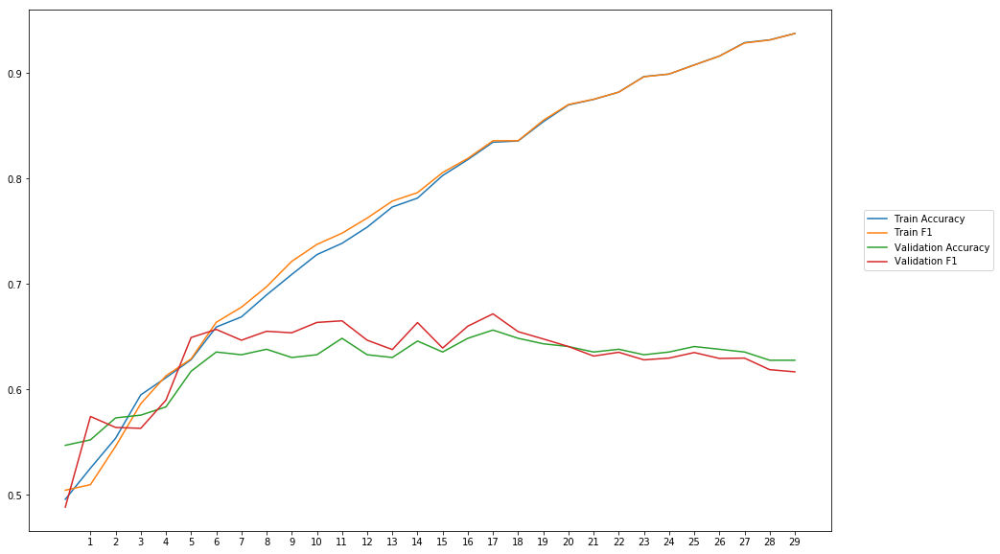

Average Accuracy: 62.53%
Average Precision: 61.84%
Average Recall: 64.31%
Average F1: 62.95%

-----Fold 3--------


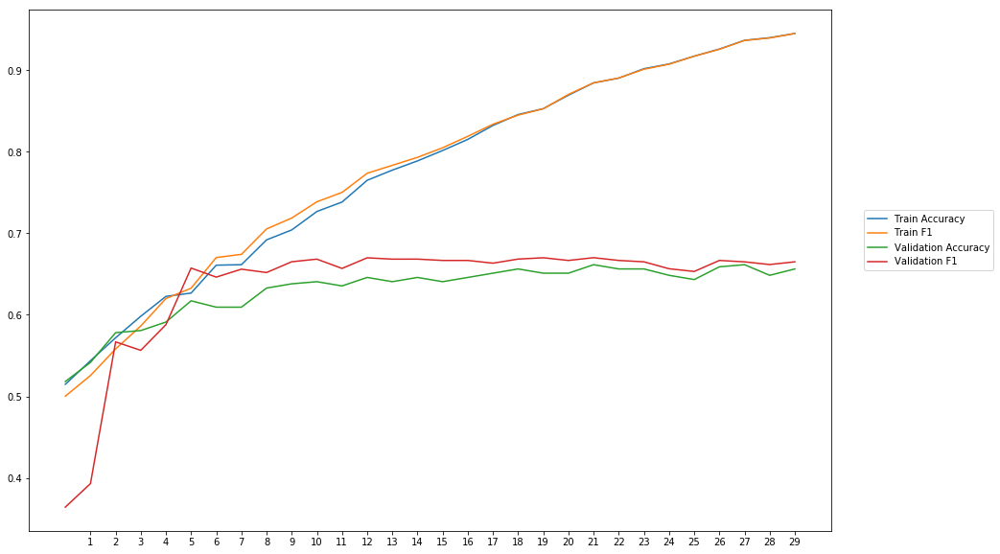

Average Accuracy: 63.04%
Average Precision: 61.83%
Average Recall: 66.18%
Average F1: 63.49%

-----Fold 4--------


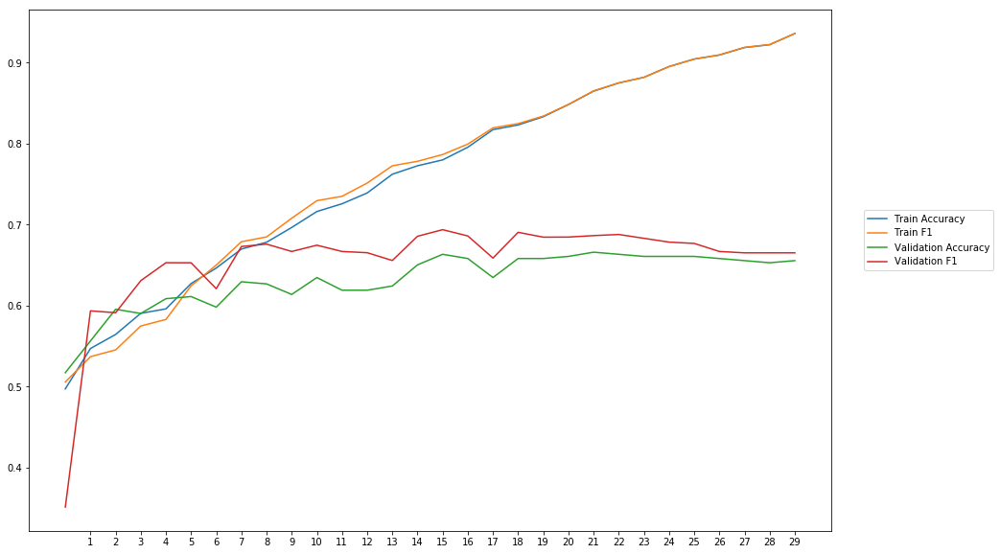

Average Accuracy: 63.19%
Average Precision: 61.26%
Average Recall: 70.89%
Average F1: 65.42%

-----Fold 5--------


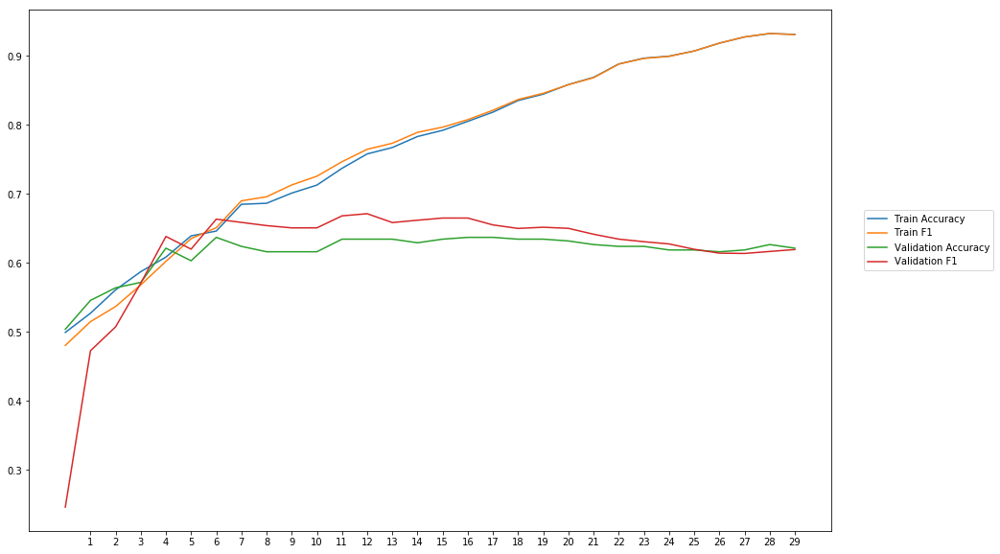

Average Accuracy: 61.52%
Average Precision: 60.50%
Average Recall: 64.36%
Average F1: 61.83%

-----Fold 6--------


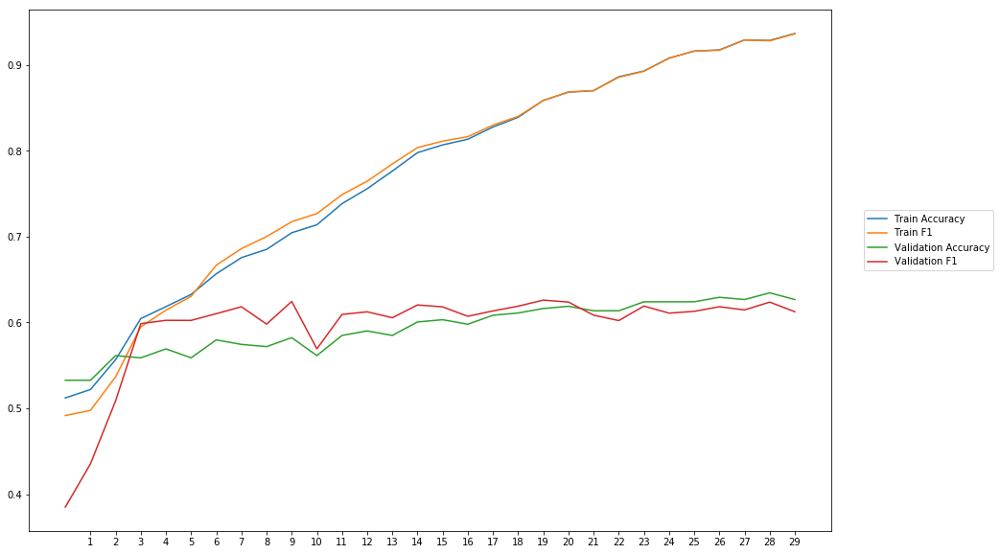

Average Accuracy: 59.38%
Average Precision: 59.17%
Average Recall: 60.47%
Average F1: 59.43%

-----Fold 7--------


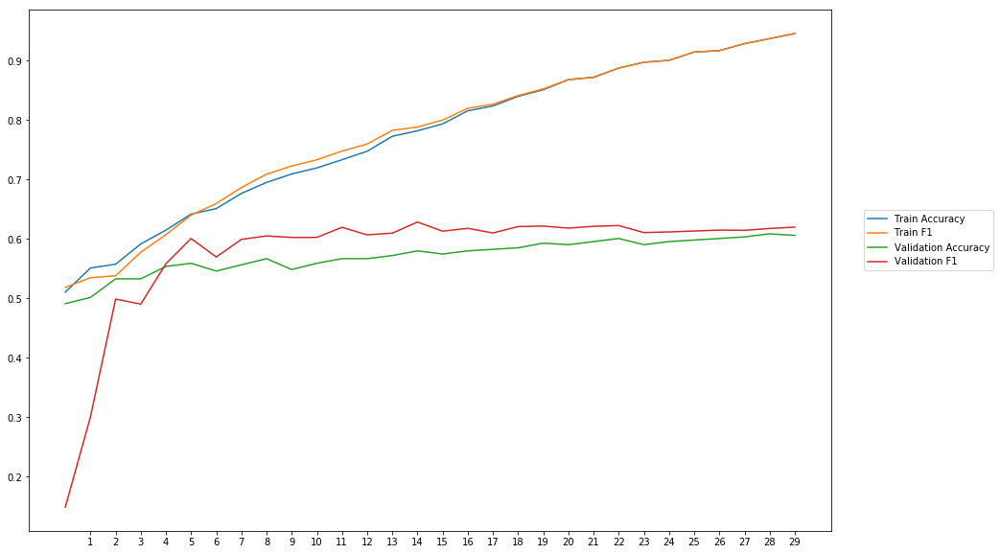

Average Accuracy: 57.10%
Average Precision: 56.02%
Average Recall: 61.06%
Average F1: 57.61%

-----Fold 8--------


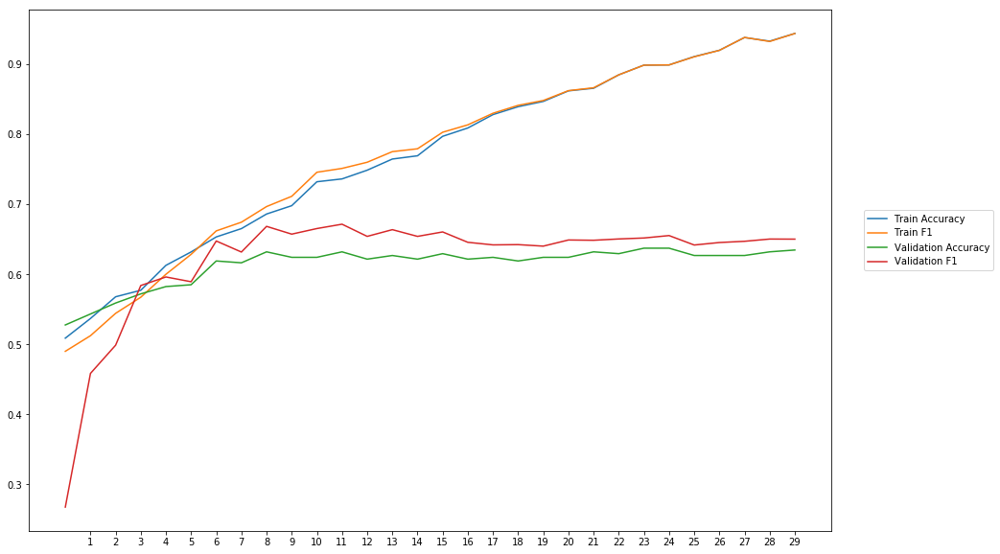

Average Accuracy: 61.36%
Average Precision: 60.27%
Average Recall: 65.36%
Average F1: 62.08%

-----Fold 9--------


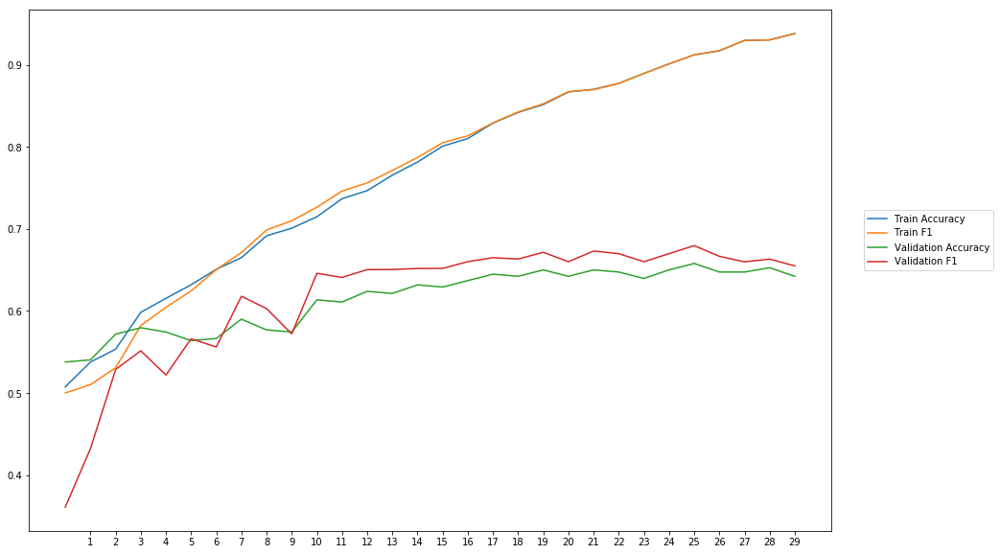

Average Accuracy: 61.53%
Average Precision: 60.70%
Average Recall: 63.82%
Average F1: 61.74%

-----Fold 10--------


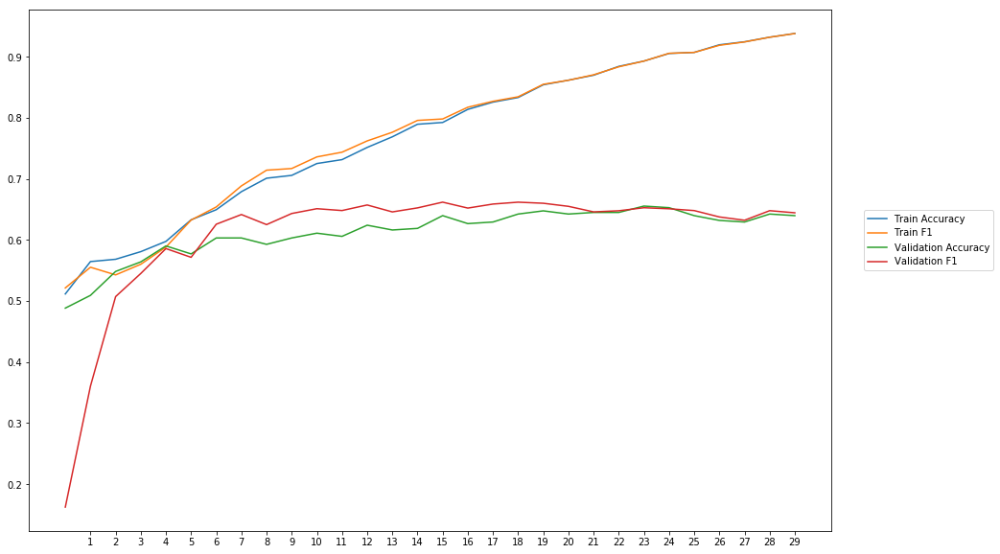

Average Accuracy: 61.21%
Average Precision: 60.12%
Average Recall: 63.16%
Average F1: 60.93%

-------Overallresults-------


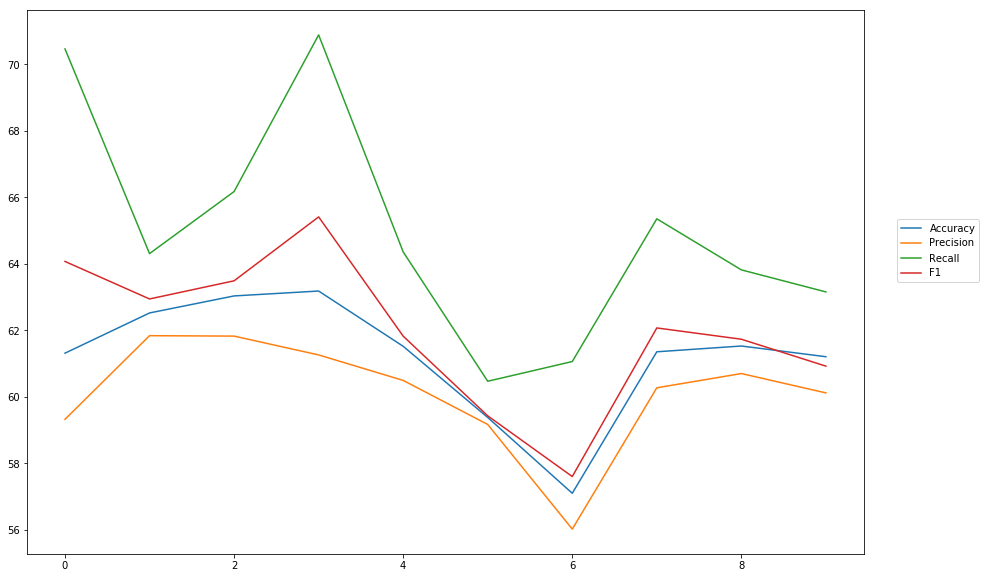

Accuracy: Mean = 61.22% (+/- 1.72%), Max = 63.19%, Min =  57.10%
Precision: Mean = 60.11% (+/- 1.61%), Max = 61.84%, Min =  56.02%
Recall: Mean = 65.01% (+/- 3.28%), Max = 70.89%, Min =  60.47%
F1: Mean = 61.95% (+/- 2.15%), Max = 65.42%, Min =  57.61%


In [17]:
cross_val_three_inputs(model_4, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInput0_5')

## Droput on hidden layer

### dropout rate = 0.2

In [14]:
#Word Embeddings
wv_layer_5 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_5 = wv_layer_5(input_embedding_5)
x_embedding_5 = Dense(600, activation='relu')(embedded_sequences_5)
x_embedding_5 = Dropout(0.2)(x_embedding_5)
x_embedding_5 = Flatten()(x_embedding_5)

#Sentiment Features
input_sentiment_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_5 = Dense(600, activation='relu')(input_sentiment_5)
x_sentiment_5 = Dropout(0.2)(x_sentiment_5)

#POS Features
input_pos_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_5 = Dense(600, activation='relu')(input_pos_5)
x_pos_5 = Dropout(0.2)(x_pos_5)

#Concatination
concat_5 = concatenate([x_embedding_5, x_sentiment_5, x_pos_5])
preds_5 = Dense(2, activation='softmax')(concat_5)

model_5 = Model(inputs=[input_embedding_5, input_sentiment_5, input_pos_5], outputs=preds_5)


-----Fold 1--------


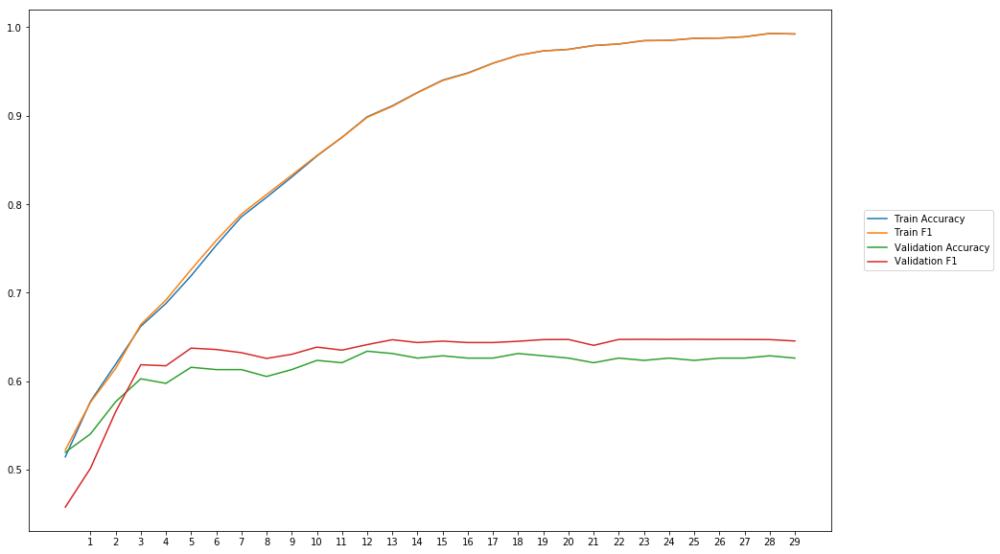

Average Accuracy: 61.41%
Average Precision: 60.30%
Average Recall: 65.50%
Average F1: 62.71%

-----Fold 2--------


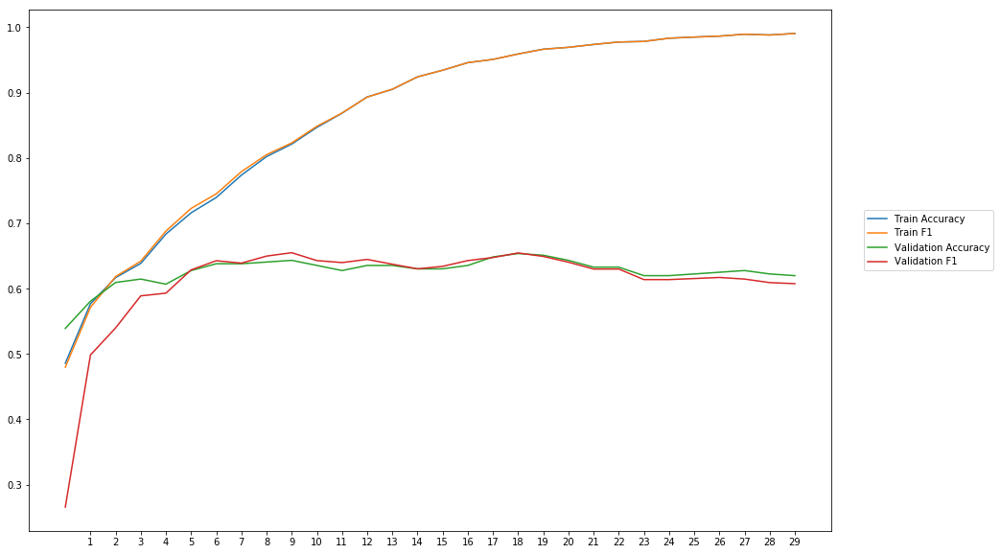

Average Accuracy: 62.62%
Average Precision: 63.00%
Average Recall: 60.31%
Average F1: 61.05%

-----Fold 3--------


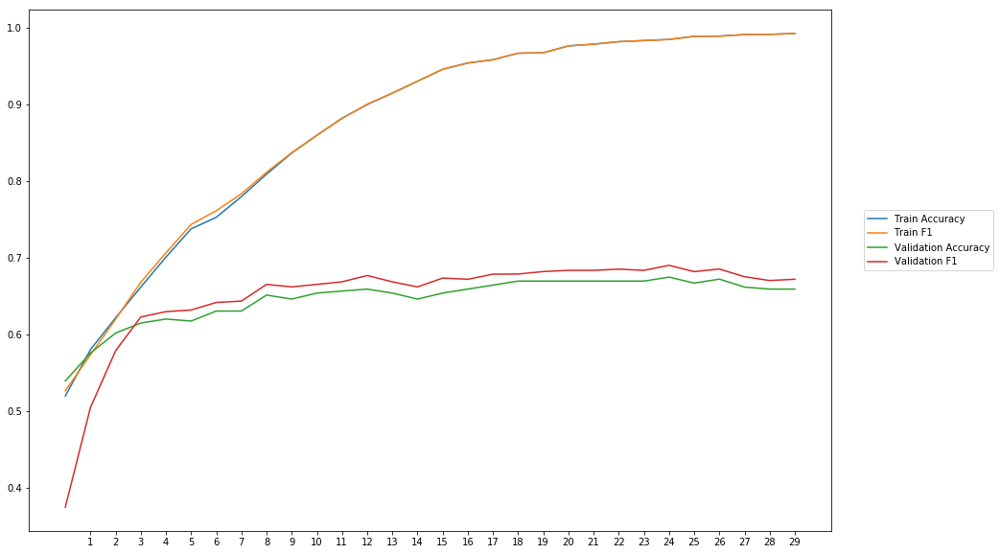

Average Accuracy: 64.59%
Average Precision: 63.50%
Average Recall: 67.09%
Average F1: 64.95%

-----Fold 4--------


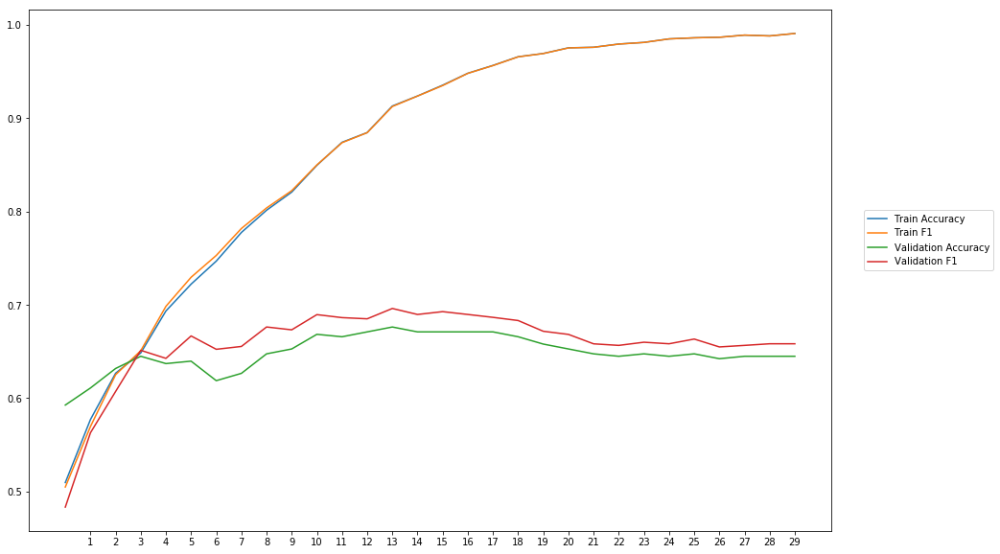

Average Accuracy: 64.85%
Average Precision: 63.80%
Average Recall: 68.45%
Average F1: 65.78%

-----Fold 5--------


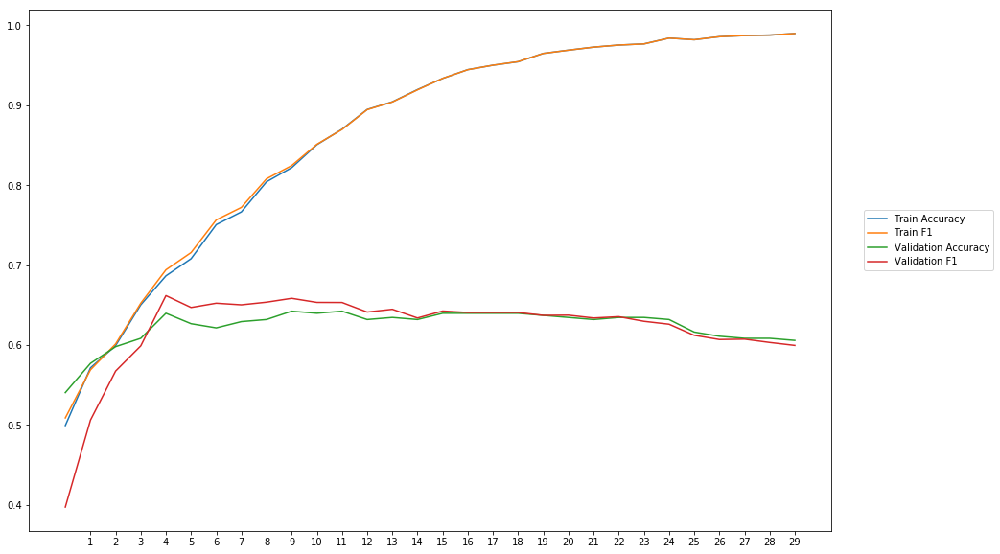

Average Accuracy: 62.36%
Average Precision: 62.12%
Average Recall: 62.48%
Average F1: 62.04%

-----Fold 6--------


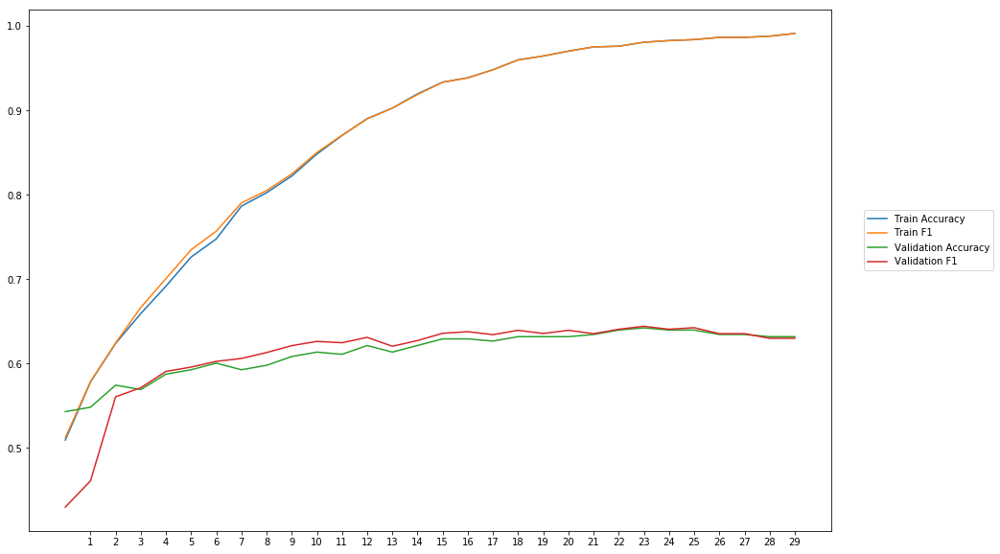

Average Accuracy: 61.35%
Average Precision: 61.09%
Average Recall: 61.52%
Average F1: 61.13%

-----Fold 7--------


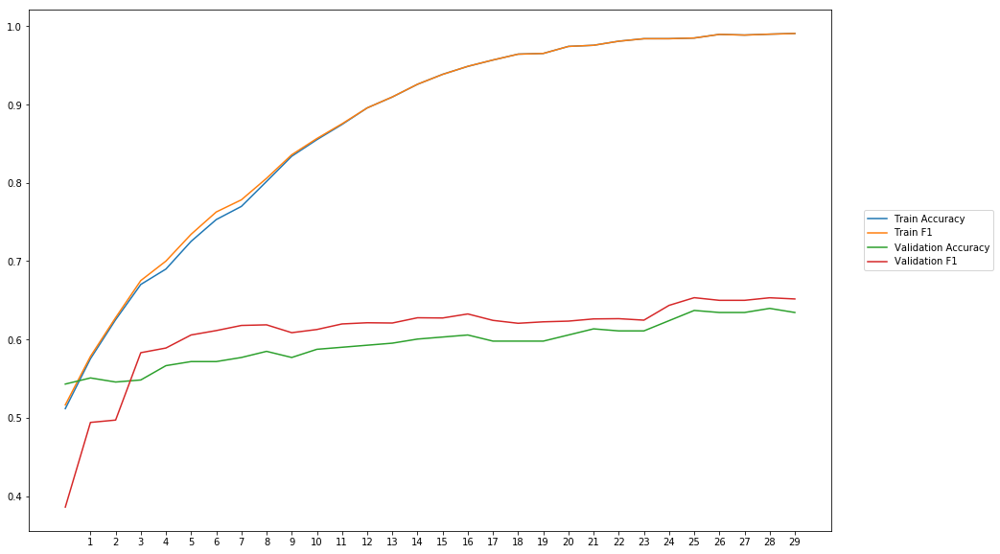

Average Accuracy: 59.50%
Average Precision: 58.62%
Average Recall: 63.91%
Average F1: 60.82%

-----Fold 8--------


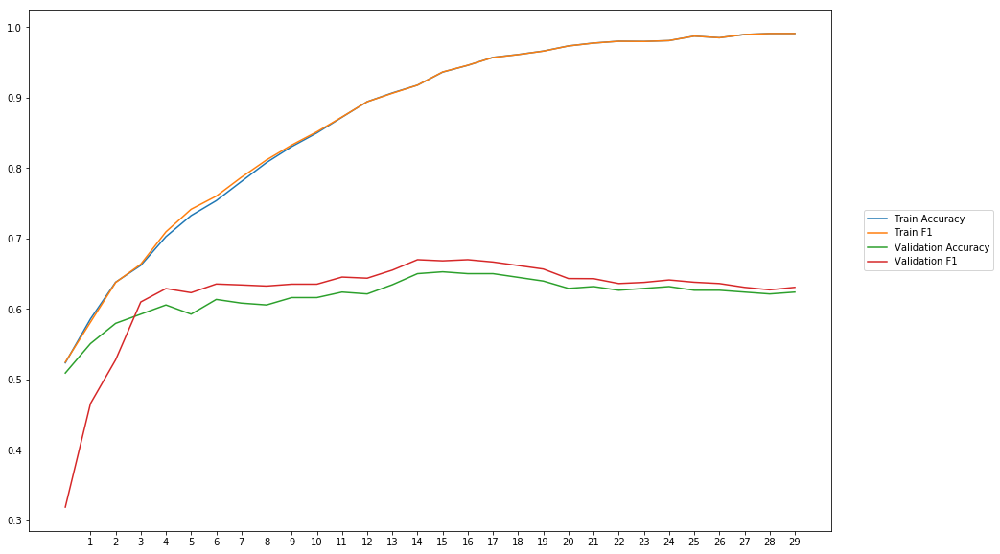

Average Accuracy: 61.77%
Average Precision: 60.87%
Average Recall: 64.28%
Average F1: 62.16%

-----Fold 9--------


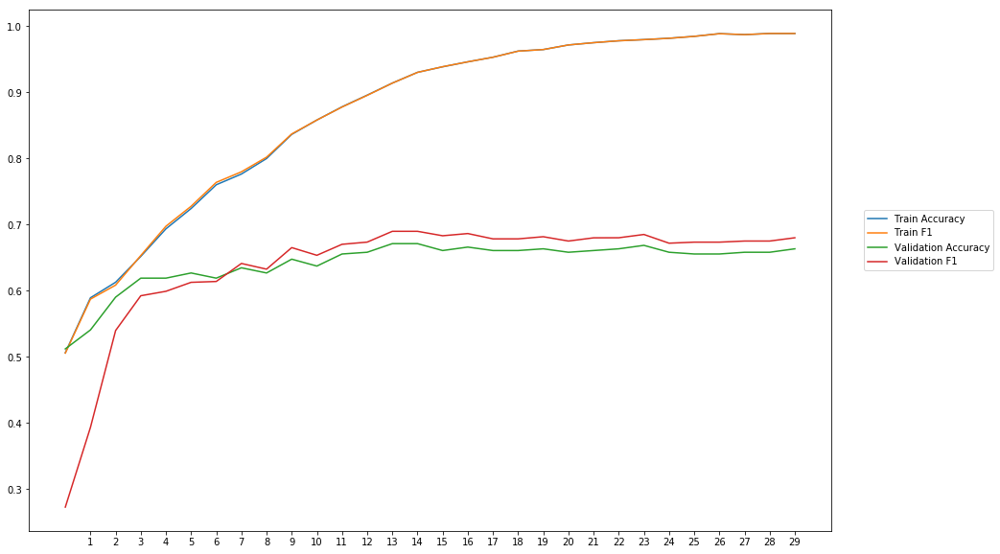

Average Accuracy: 64.12%
Average Precision: 63.26%
Average Recall: 65.38%
Average F1: 63.70%

-----Fold 10--------


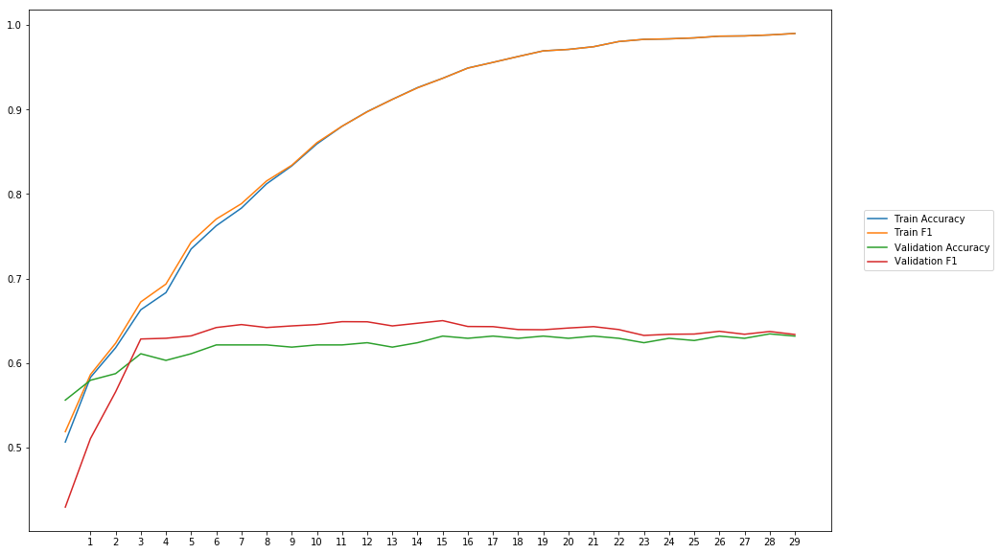

Average Accuracy: 61.98%
Average Precision: 61.26%
Average Recall: 64.59%
Average F1: 62.62%

-------Overallresults-------


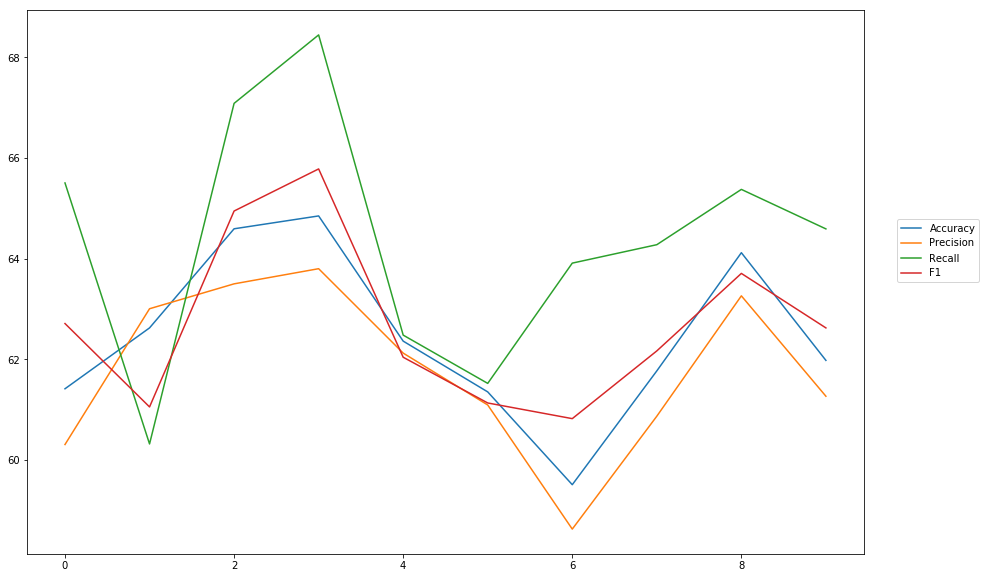

Accuracy: Mean = 62.45% (+/- 1.58%), Max = 64.85%, Min =  59.50%
Precision: Mean = 61.78% (+/- 1.57%), Max = 63.80%, Min =  58.62%
Recall: Mean = 64.35% (+/- 2.34%), Max = 68.45%, Min =  60.31%
F1: Mean = 62.70% (+/- 1.58%), Max = 65.78%, Min =  60.82%


In [19]:
cross_val_three_inputs(model_5, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropHidden0_2')

### dropout rate = 0.3

In [23]:
#Word Embeddings
wv_layer_6 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_6 = wv_layer_6(input_embedding_6)
x_embedding_6 = Dense(600, activation='relu')(embedded_sequences_6)
x_embedding_6 = Dropout(0.3)(x_embedding_6)
x_embedding_6 = Flatten()(x_embedding_6)

#Sentiment Features
input_sentiment_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_6 = Dense(600, activation='relu')(input_sentiment_6)
x_sentiment_6 = Dropout(0.3)(x_sentiment_6)

#POS Features
input_pos_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_6 = Dense(600, activation='relu')(input_pos_6)
x_pos_6 = Dropout(0.3)(x_pos_6)

#Concatination
concat_6 = concatenate([x_embedding_6, x_sentiment_6, x_pos_6])
preds_6 = Dense(2, activation='softmax')(concat_6)

model_6 = Model(inputs=[input_embedding_6, input_sentiment_6, input_pos_6], outputs=preds_6)


-----Fold 1--------


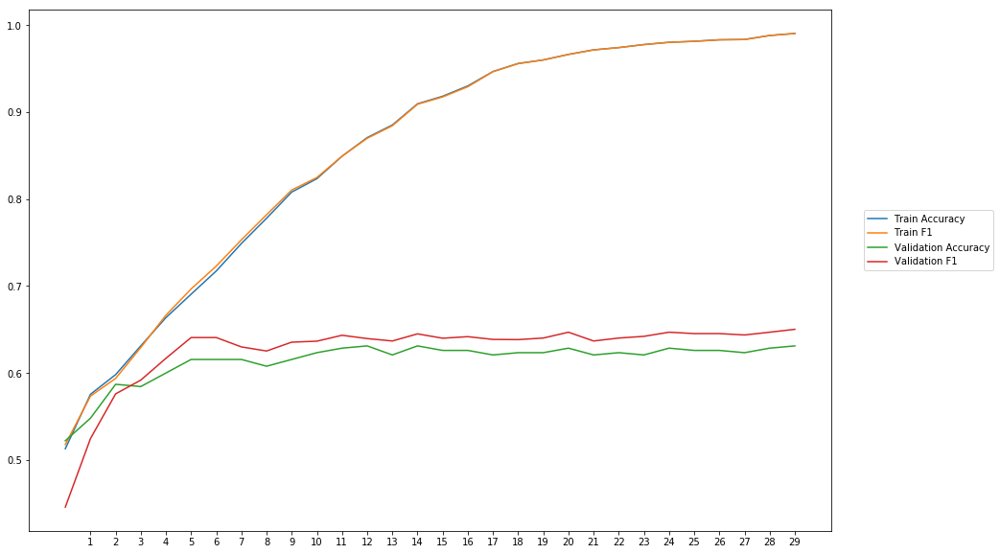

Average Accuracy: 61.41%
Average Precision: 60.39%
Average Recall: 65.12%
Average F1: 62.57%

-----Fold 2--------


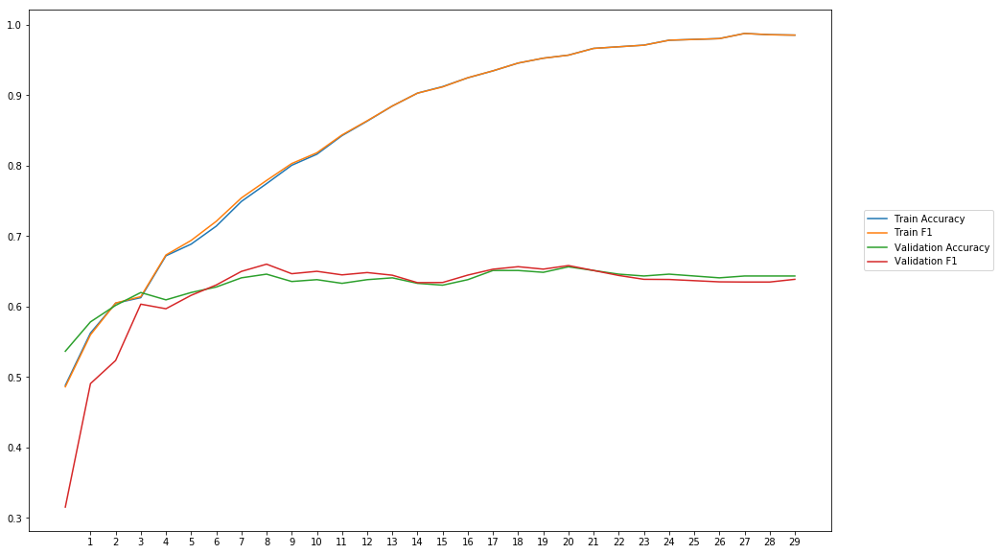

Average Accuracy: 63.24%
Average Precision: 63.35%
Average Recall: 61.59%
Average F1: 62.01%

-----Fold 3--------


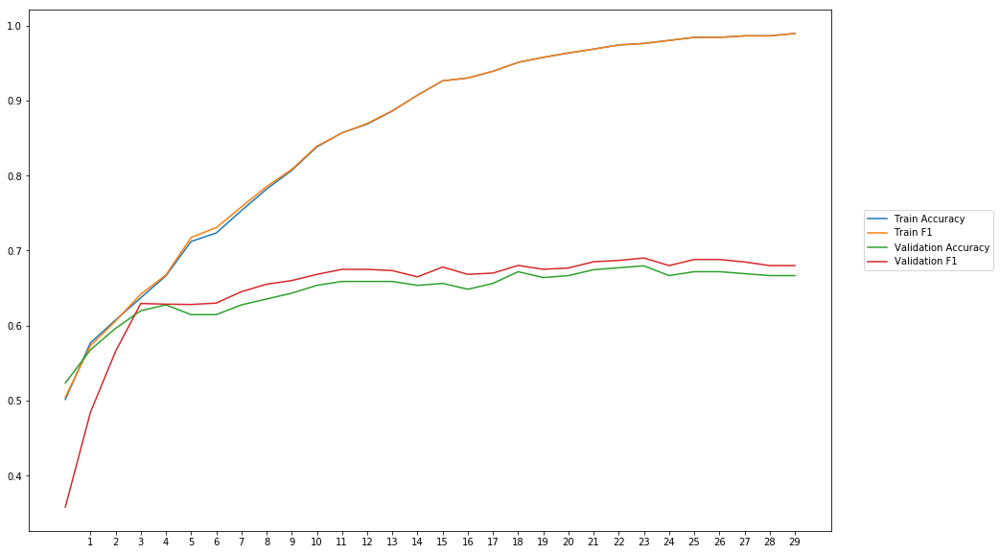

Average Accuracy: 64.54%
Average Precision: 63.39%
Average Recall: 67.00%
Average F1: 64.84%

-----Fold 4--------


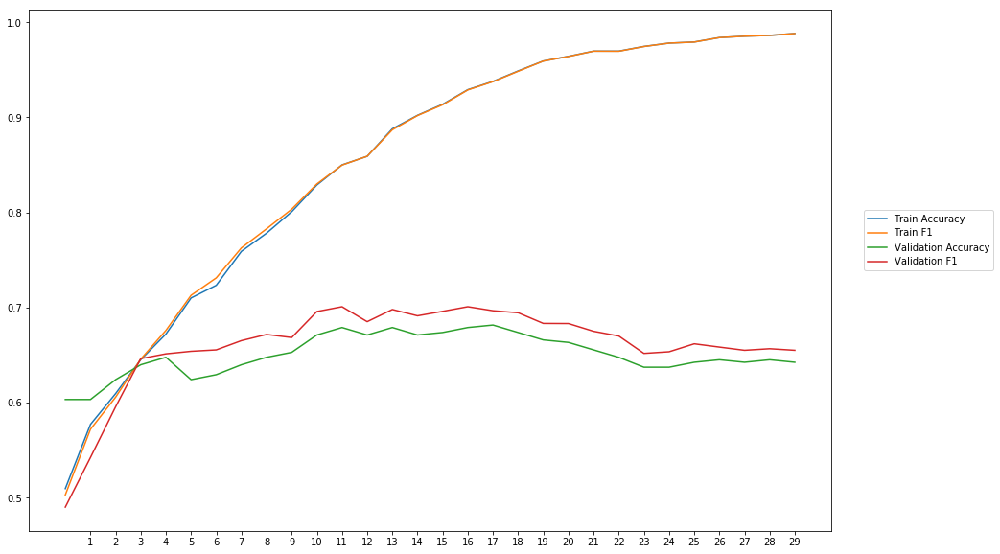

Average Accuracy: 65.04%
Average Precision: 63.94%
Average Recall: 68.85%
Average F1: 66.00%

-----Fold 5--------


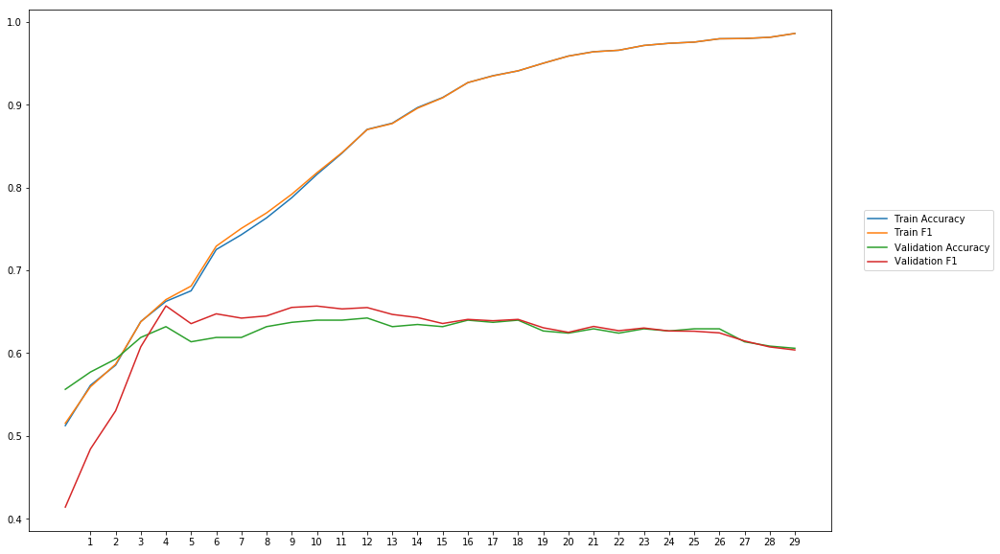

Average Accuracy: 62.26%
Average Precision: 62.10%
Average Recall: 62.43%
Average F1: 61.92%

-----Fold 6--------


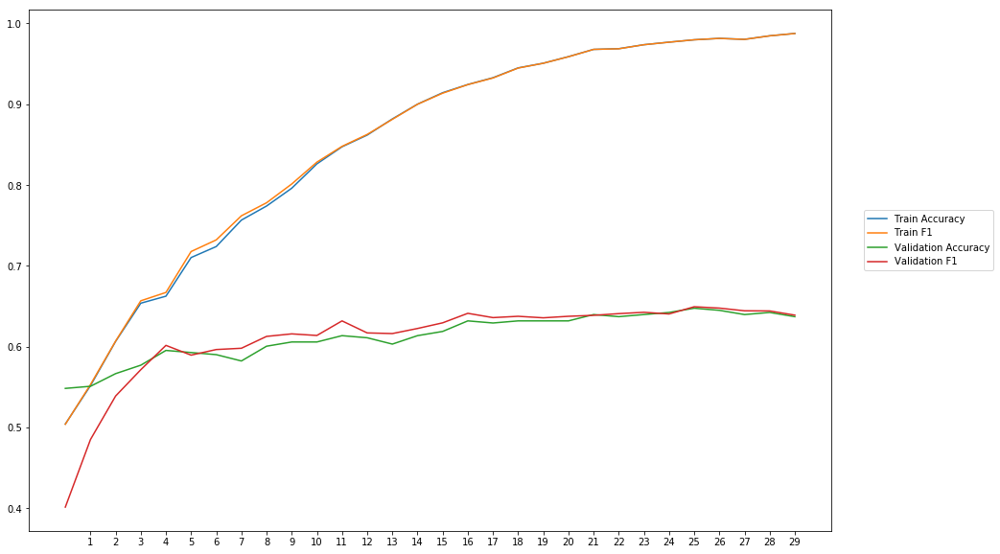

Average Accuracy: 61.34%
Average Precision: 61.12%
Average Recall: 61.43%
Average F1: 61.05%

-----Fold 7--------


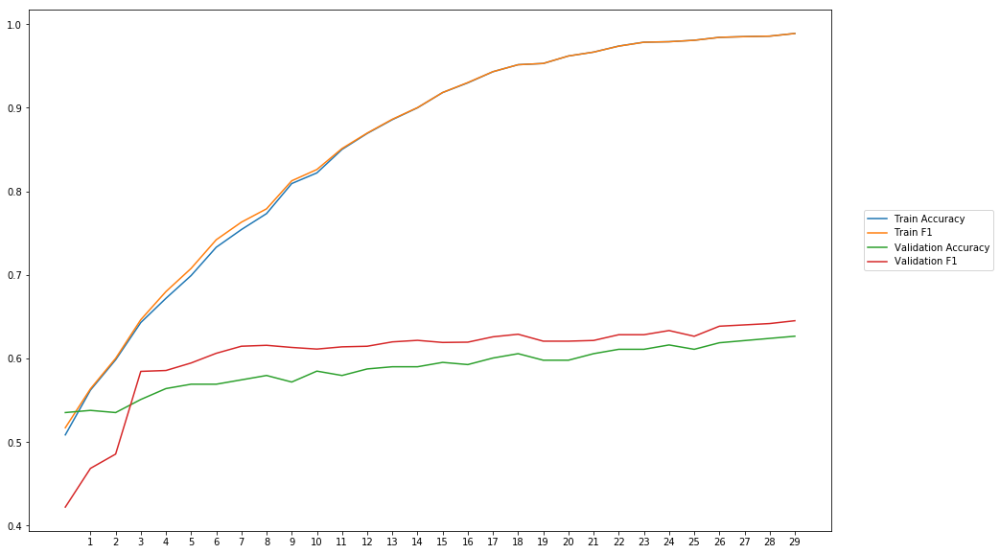

Average Accuracy: 58.85%
Average Precision: 57.90%
Average Recall: 63.61%
Average F1: 60.37%

-----Fold 8--------


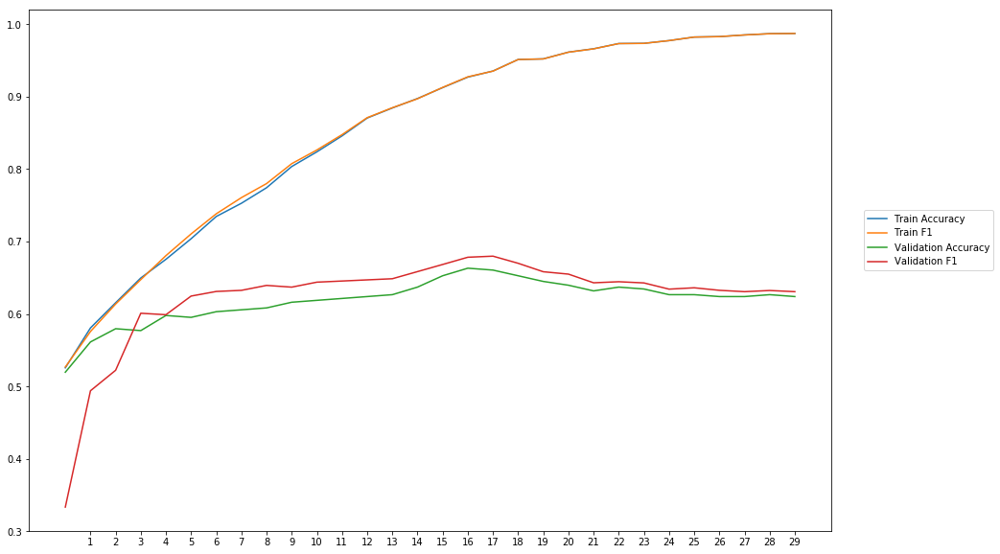

Average Accuracy: 61.87%
Average Precision: 61.02%
Average Recall: 64.43%
Average F1: 62.32%

-----Fold 9--------


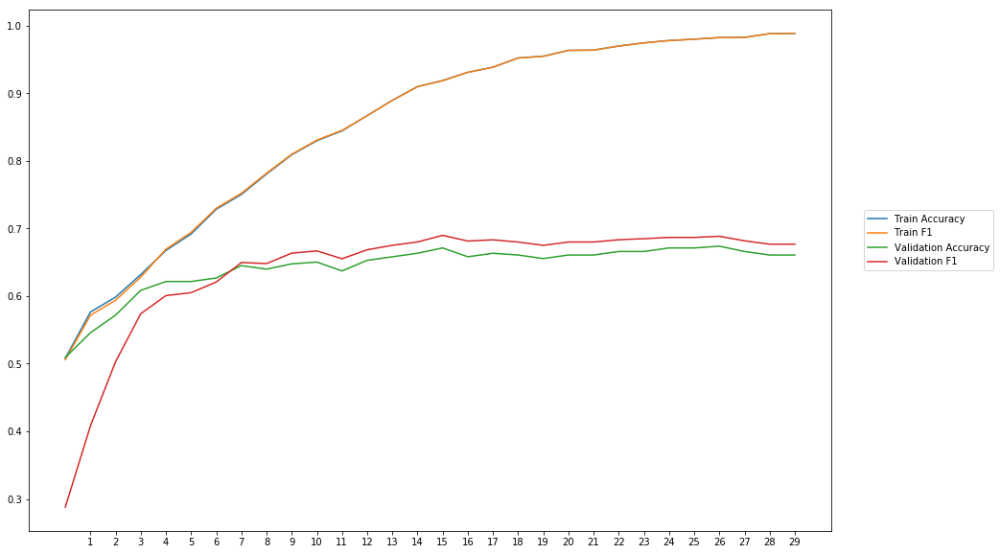

Average Accuracy: 64.20%
Average Precision: 63.34%
Average Recall: 65.41%
Average F1: 63.79%

-----Fold 10--------


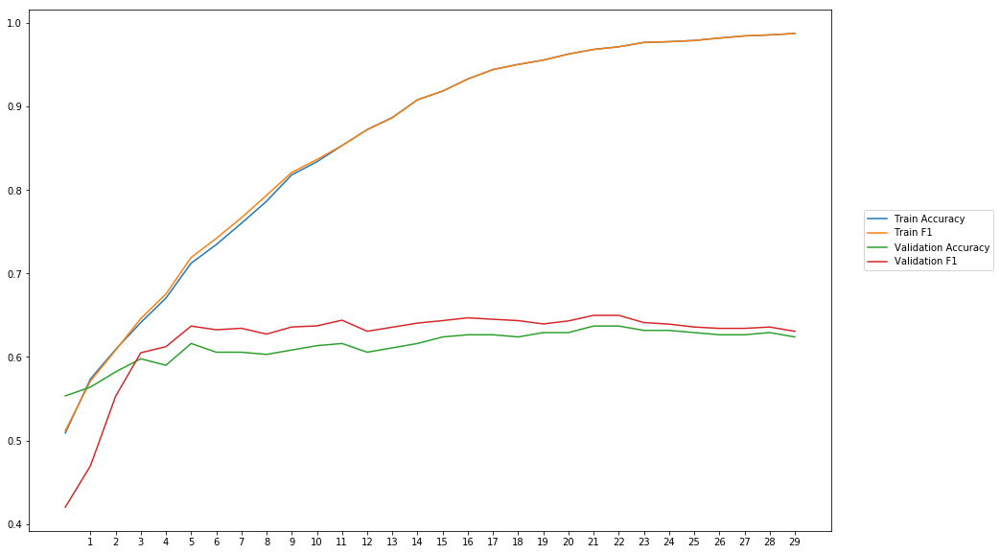

Average Accuracy: 61.41%
Average Precision: 60.67%
Average Recall: 64.26%
Average F1: 62.10%

-------Overallresults-------


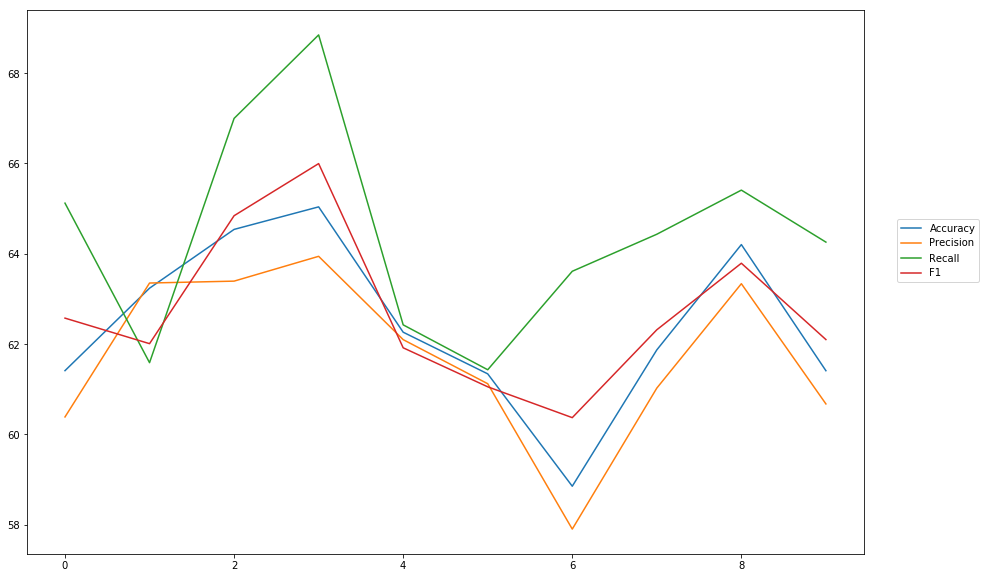

Accuracy: Mean = 62.42% (+/- 1.77%), Max = 65.04%, Min =  58.85%
Precision: Mean = 61.72% (+/- 1.77%), Max = 63.94%, Min =  57.90%
Recall: Mean = 64.41% (+/- 2.22%), Max = 68.85%, Min =  61.43%
F1: Mean = 62.70% (+/- 1.63%), Max = 66.00%, Min =  60.37%


In [21]:
cross_val_three_inputs(model_6, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropHidden0_3')

### dropout rate = 0.4

In [22]:
#Word Embeddings
wv_layer_7 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_7 = wv_layer_7(input_embedding_7)
x_embedding_7 = Dense(600, activation='relu')(embedded_sequences_7)
x_embedding_7 = Dropout(0.4)(x_embedding_7)
x_embedding_7 = Flatten()(x_embedding_7)

#Sentiment Features
input_sentiment_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_7 = Dense(600, activation='relu')(input_sentiment_7)
x_sentiment_7 = Dropout(0.4)(x_sentiment_7)

#POS Features
input_pos_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_7 = Dense(600, activation='relu')(input_pos_7)
x_pos_7 = Dropout(0.4)(x_pos_7)

#Concatination
concat_7 = concatenate([x_embedding_7, x_sentiment_7, x_pos_7])
preds_7 = Dense(2, activation='softmax')(concat_7)

model_7 = Model(inputs=[input_embedding_7, input_sentiment_7, input_pos_7], outputs=preds_7)


-----Fold 1--------


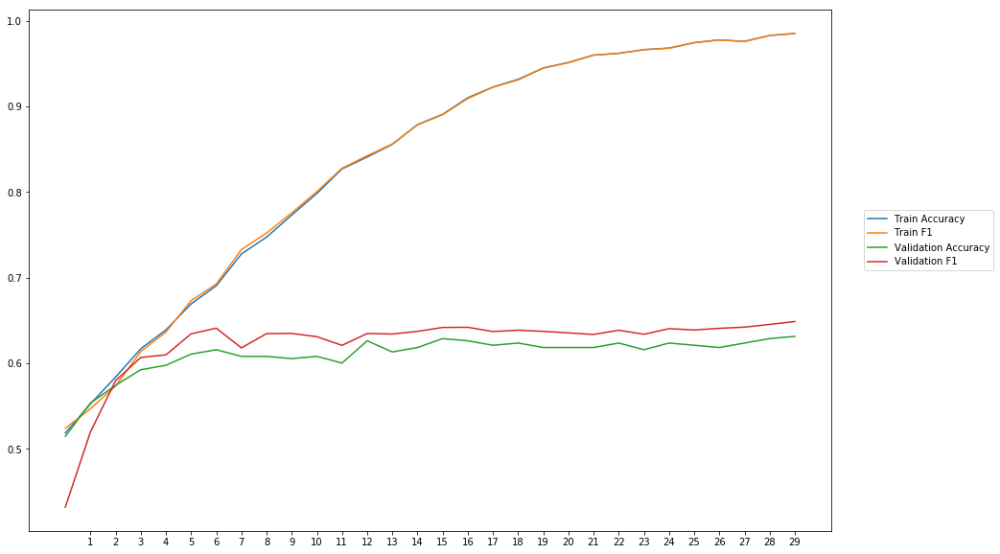

Average Accuracy: 60.94%
Average Precision: 59.90%
Average Recall: 64.88%
Average F1: 62.19%

-----Fold 2--------


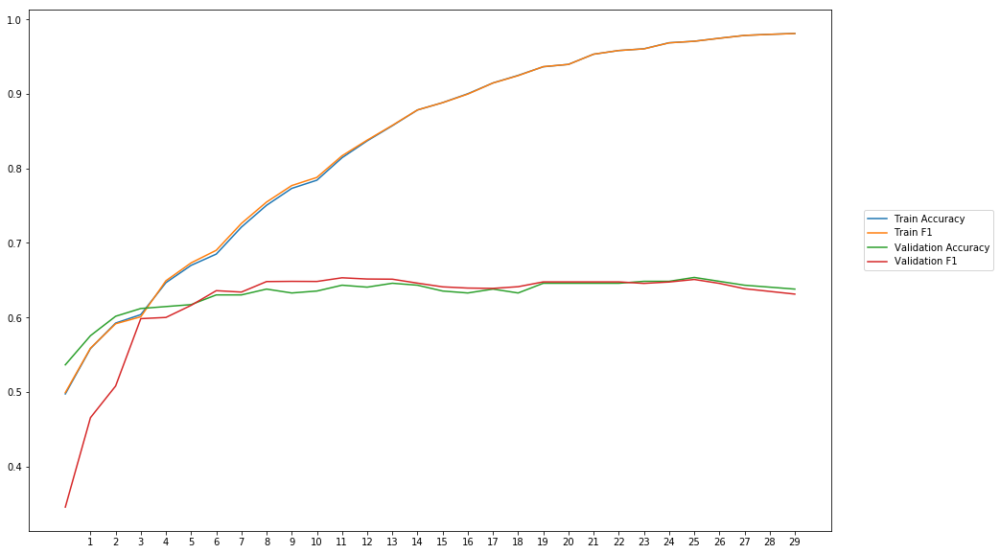

Average Accuracy: 63.13%
Average Precision: 63.20%
Average Recall: 61.68%
Average F1: 61.99%

-----Fold 3--------


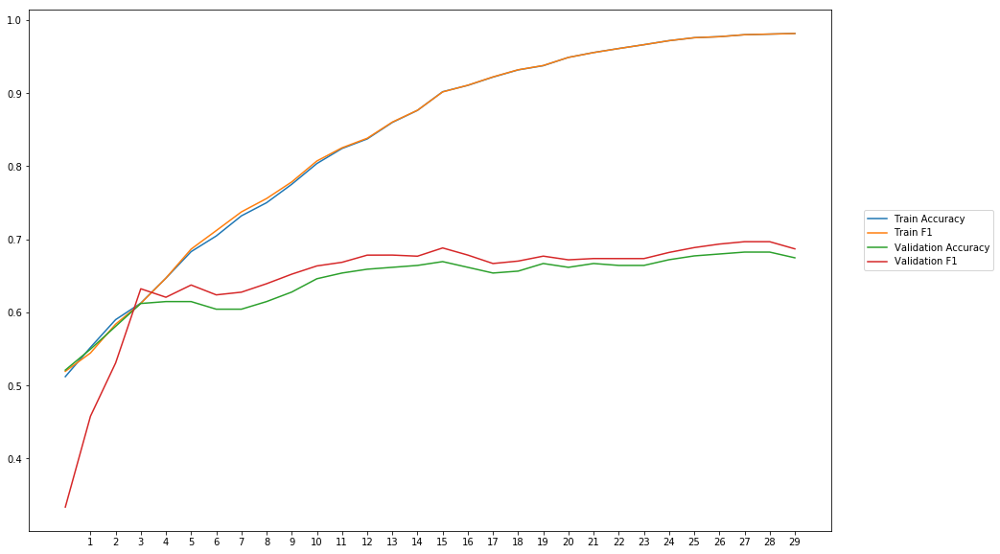

Average Accuracy: 64.19%
Average Precision: 63.02%
Average Recall: 66.72%
Average F1: 64.44%

-----Fold 4--------


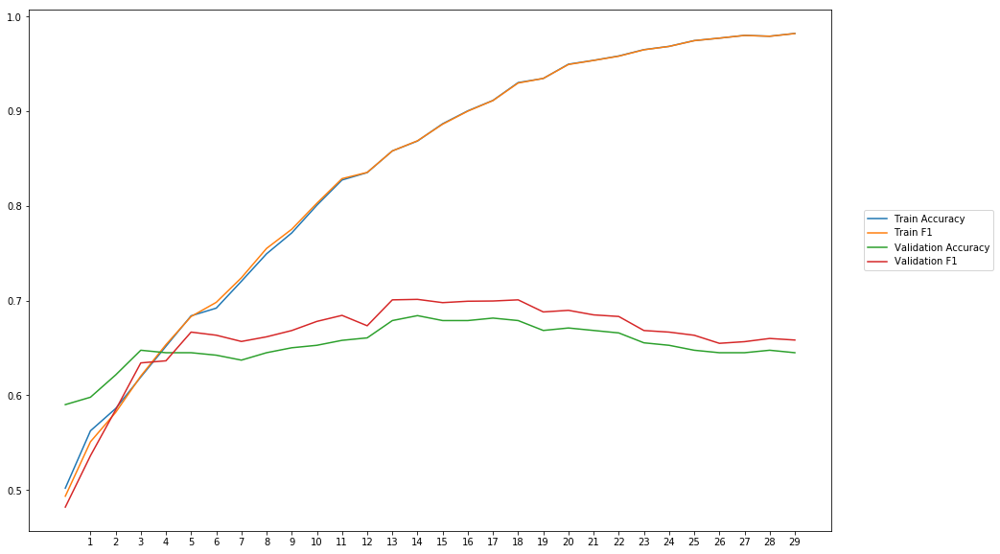

Average Accuracy: 65.28%
Average Precision: 64.28%
Average Recall: 68.43%
Average F1: 65.99%

-----Fold 5--------


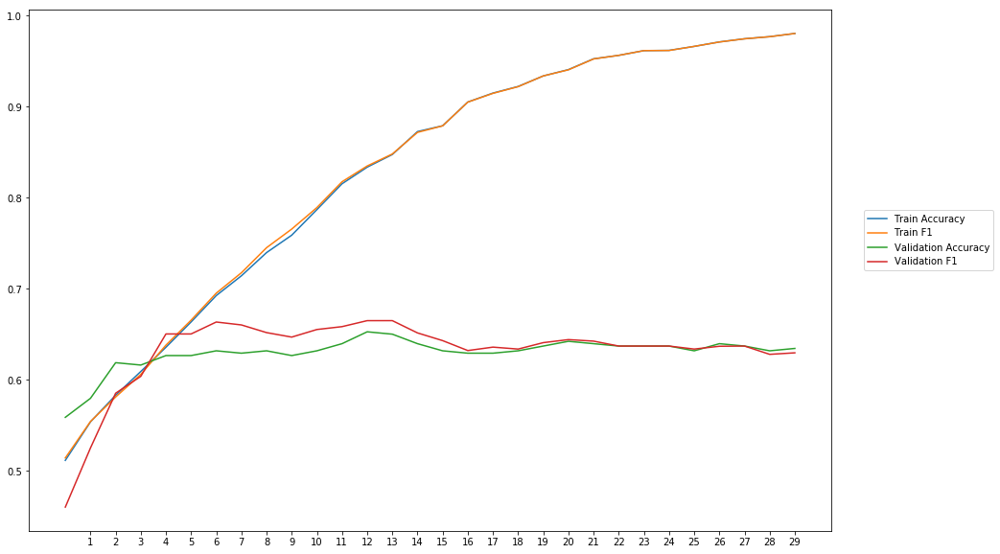

Average Accuracy: 62.96%
Average Precision: 62.51%
Average Recall: 64.21%
Average F1: 63.14%

-----Fold 6--------


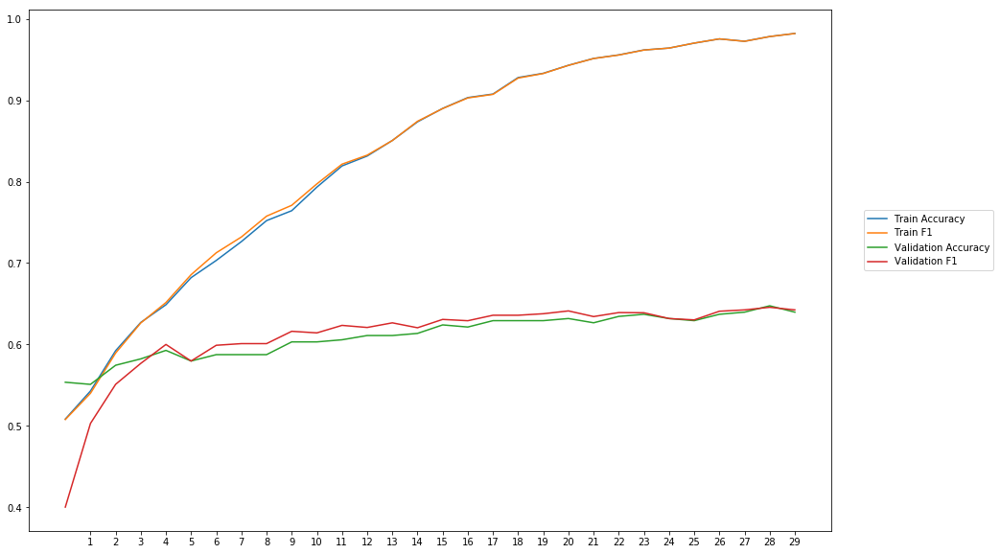

Average Accuracy: 61.11%
Average Precision: 60.86%
Average Recall: 61.54%
Average F1: 60.97%

-----Fold 7--------


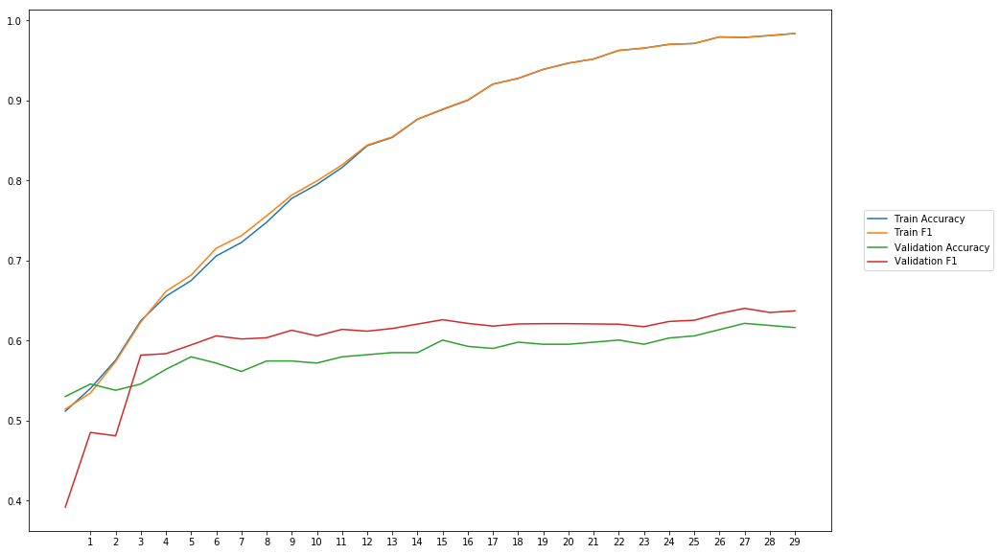

Average Accuracy: 58.44%
Average Precision: 57.53%
Average Recall: 63.26%
Average F1: 59.97%

-----Fold 8--------


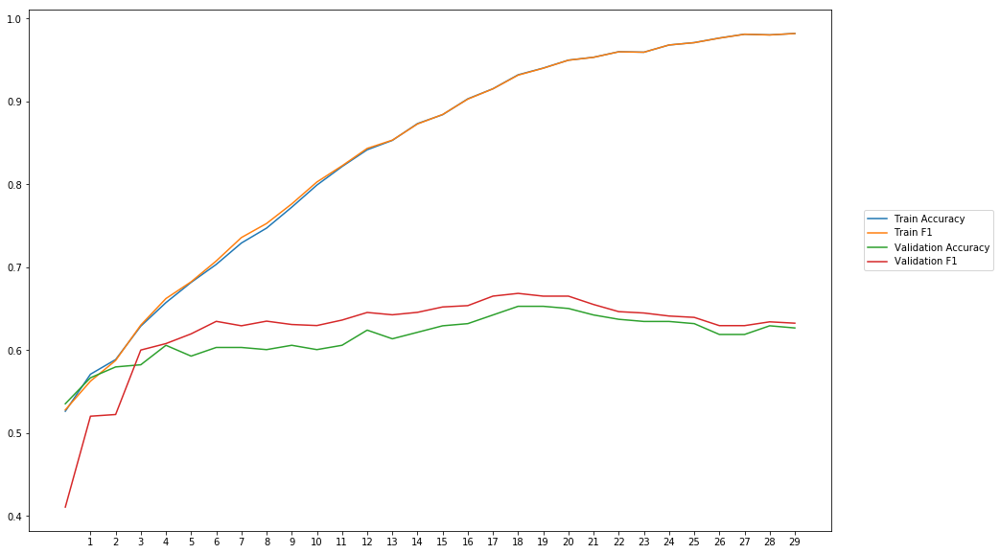

Average Accuracy: 61.58%
Average Precision: 60.70%
Average Recall: 64.82%
Average F1: 62.43%

-----Fold 9--------


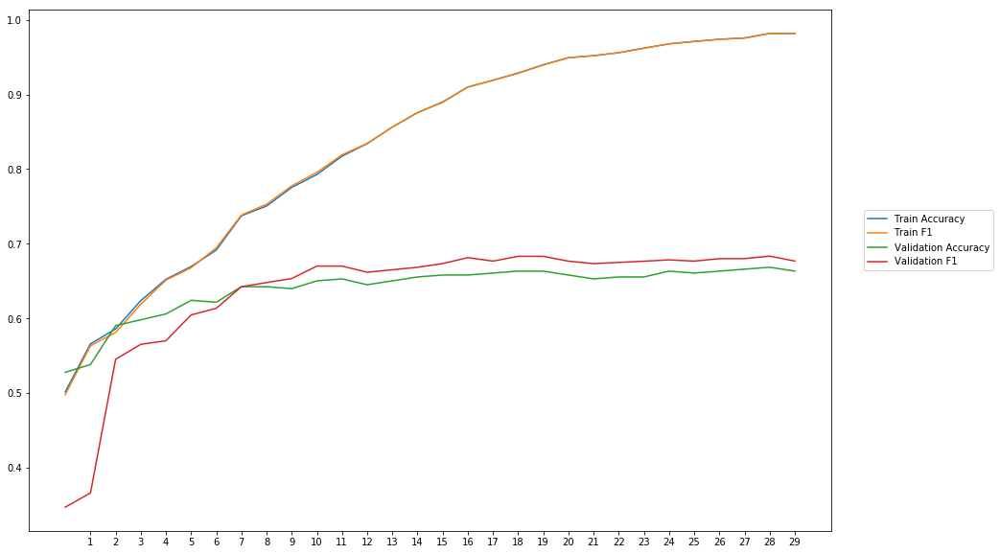

Average Accuracy: 63.97%
Average Precision: 63.27%
Average Recall: 64.96%
Average F1: 63.54%

-----Fold 10--------


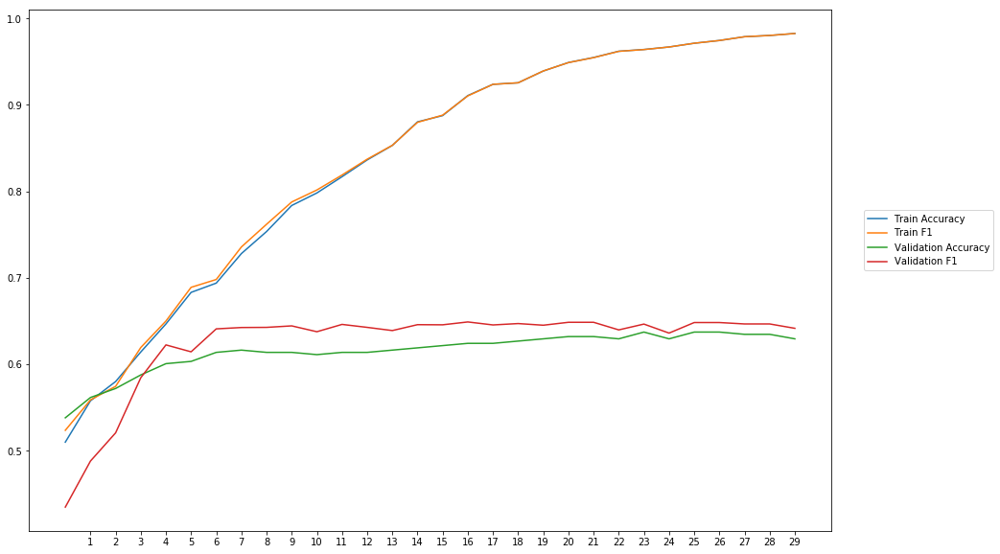

Average Accuracy: 61.50%
Average Precision: 60.56%
Average Recall: 64.92%
Average F1: 62.41%

-------Overallresults-------


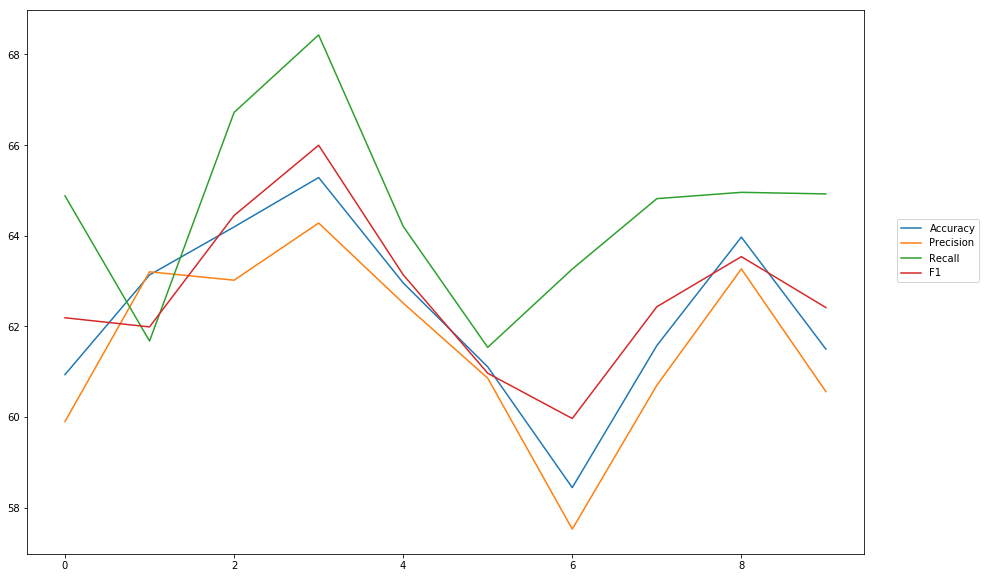

Accuracy: Mean = 62.31% (+/- 1.89%), Max = 65.28%, Min =  58.44%
Precision: Mean = 61.58% (+/- 1.93%), Max = 64.28%, Min =  57.53%
Recall: Mean = 64.54% (+/- 1.98%), Max = 68.43%, Min =  61.54%
F1: Mean = 62.71% (+/- 1.62%), Max = 65.99%, Min =  59.97%


In [23]:
cross_val_three_inputs(model_7, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropHidden0_4')

### dropout rate = 0.5

In [24]:
#Word Embeddings
wv_layer_8 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_8 = wv_layer_8(input_embedding_8)
x_embedding_8 = Dense(600, activation='relu')(embedded_sequences_8)
x_embedding_8 = Dropout(0.5)(x_embedding_8)
x_embedding_8 = Flatten()(x_embedding_8)

#Sentiment Features
input_sentiment_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_8 = Dense(600, activation='relu')(input_sentiment_8)
x_sentiment_8 = Dropout(0.5)(x_sentiment_8)

#POS Features
input_pos_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_8 = Dense(600, activation='relu')(input_pos_8)
x_pos_8 = Dropout(0.5)(x_pos_8)

#Concatination
concat_8 = concatenate([x_embedding_8, x_sentiment_8, x_pos_8])
preds_8 = Dense(2, activation='softmax')(concat_8)

model_8 = Model(inputs=[input_embedding_8, input_sentiment_8, input_pos_8], outputs=preds_8)


-----Fold 1--------


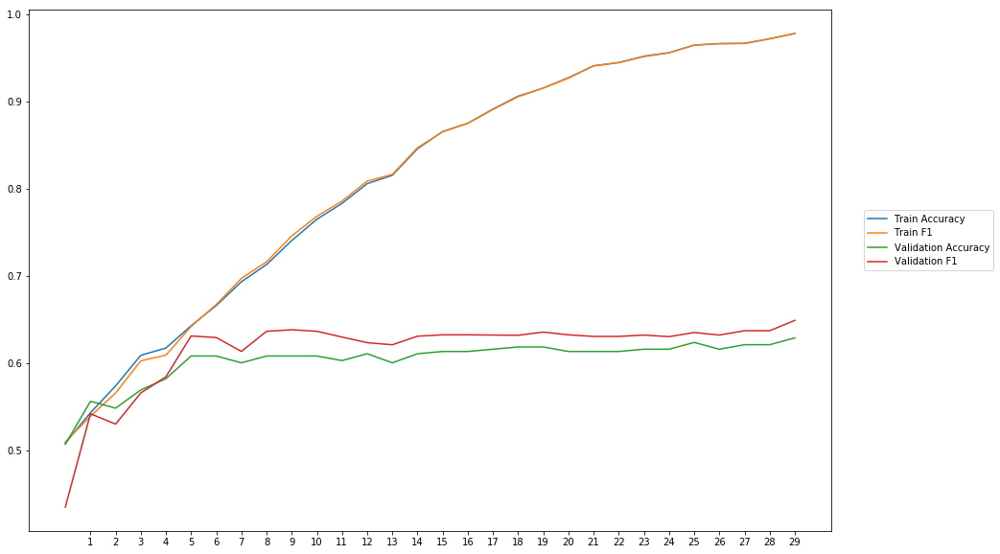

Average Accuracy: 60.27%
Average Precision: 59.29%
Average Recall: 64.06%
Average F1: 61.49%

-----Fold 2--------


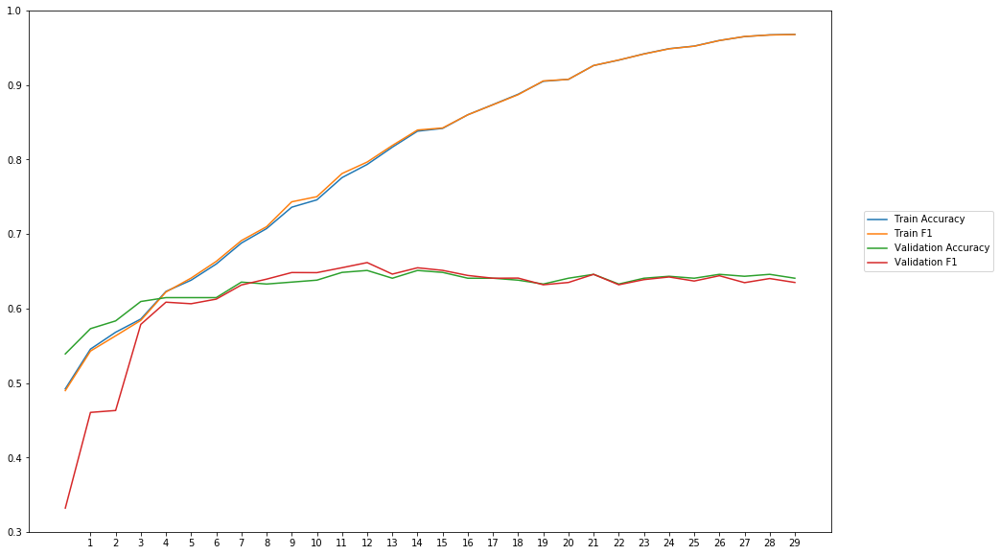

Average Accuracy: 63.00%
Average Precision: 63.28%
Average Recall: 60.72%
Average F1: 61.46%

-----Fold 3--------


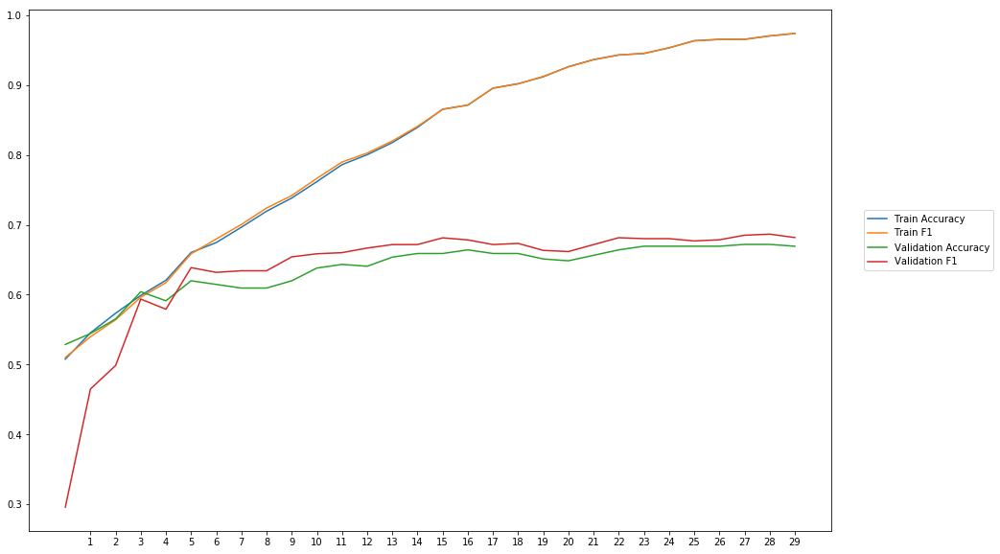

Average Accuracy: 63.64%
Average Precision: 62.58%
Average Recall: 65.88%
Average F1: 63.68%

-----Fold 4--------


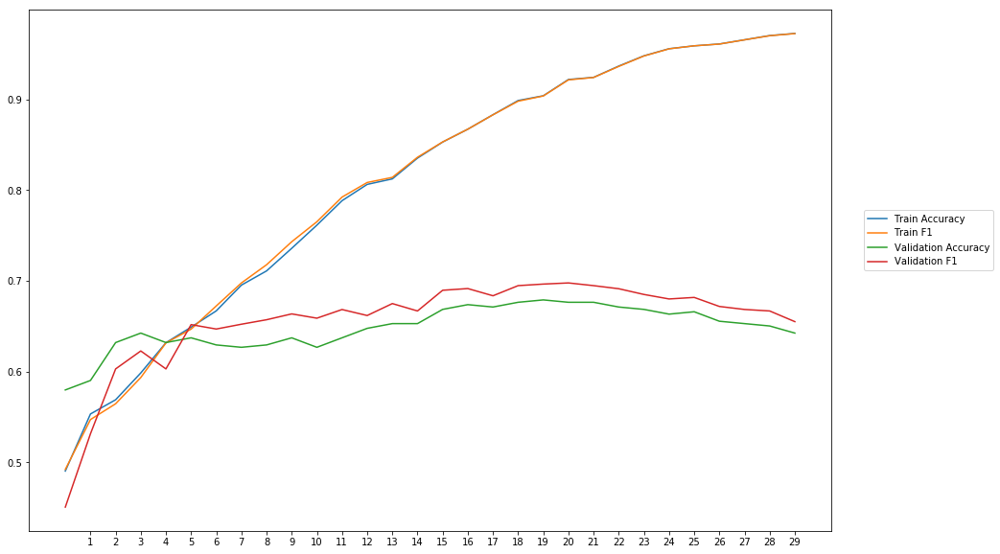

Average Accuracy: 64.80%
Average Precision: 63.84%
Average Recall: 68.05%
Average F1: 65.52%

-----Fold 5--------


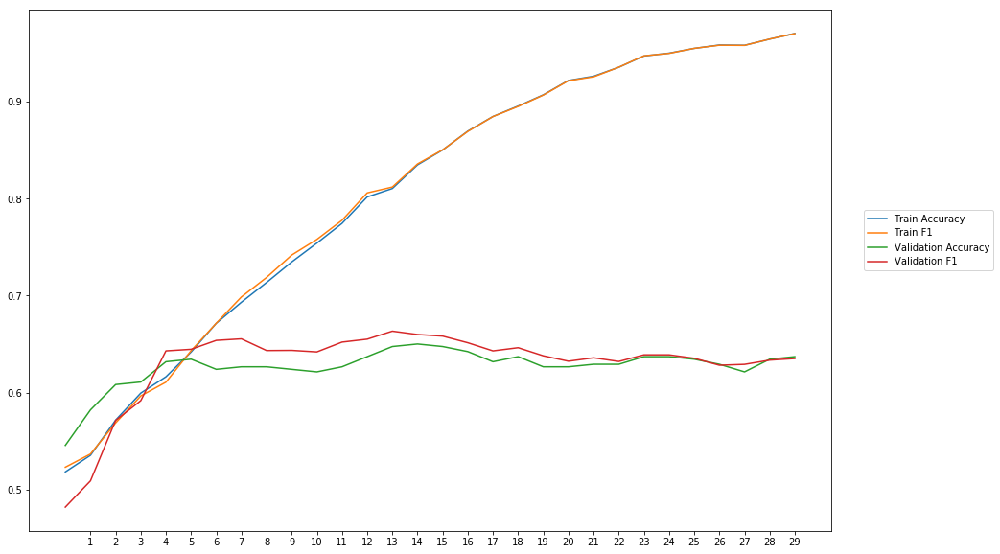

Average Accuracy: 62.66%
Average Precision: 62.15%
Average Recall: 64.15%
Average F1: 62.96%

-----Fold 6--------


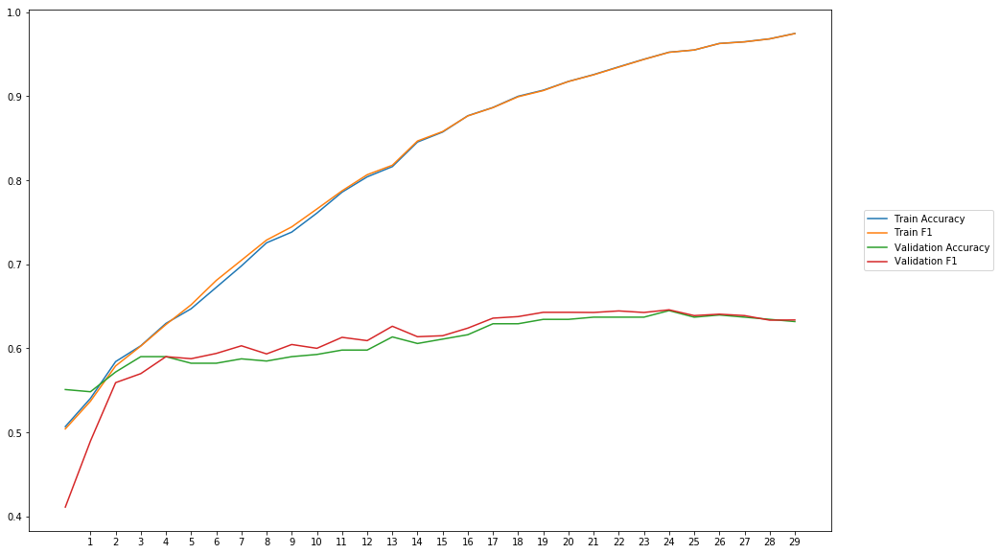

Average Accuracy: 60.92%
Average Precision: 60.68%
Average Recall: 61.22%
Average F1: 60.75%

-----Fold 7--------


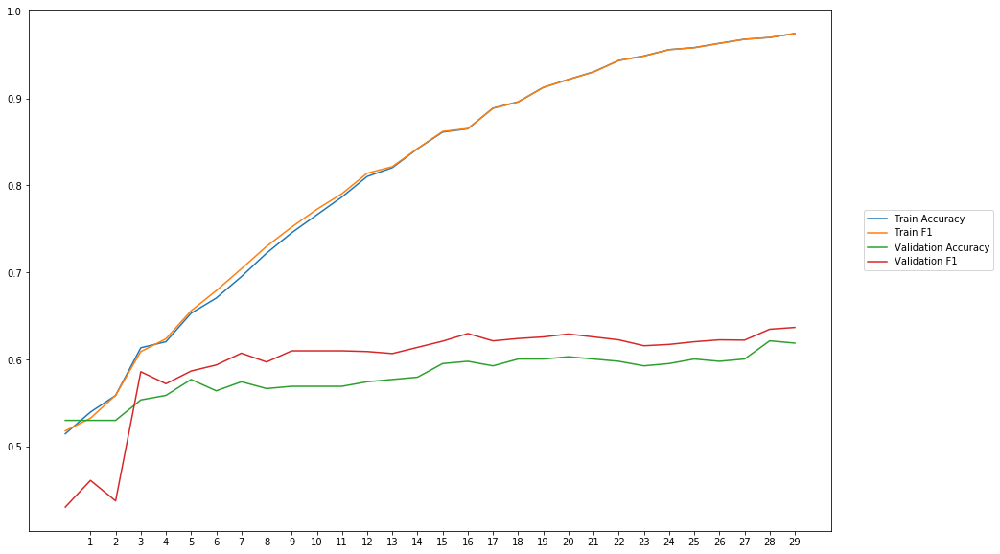

Average Accuracy: 58.13%
Average Precision: 57.20%
Average Recall: 62.98%
Average F1: 59.67%

-----Fold 8--------


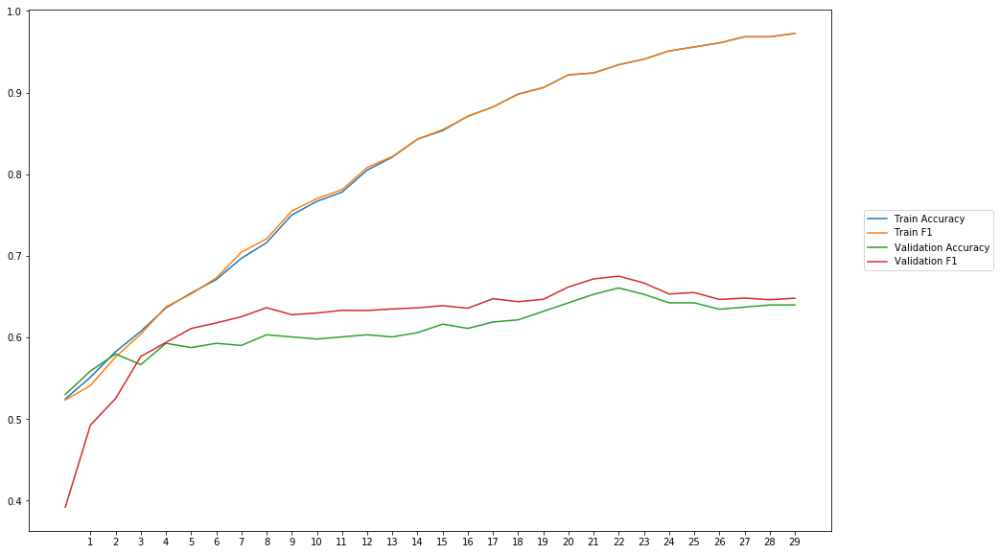

Average Accuracy: 61.17%
Average Precision: 60.23%
Average Recall: 64.89%
Average F1: 62.16%

-----Fold 9--------


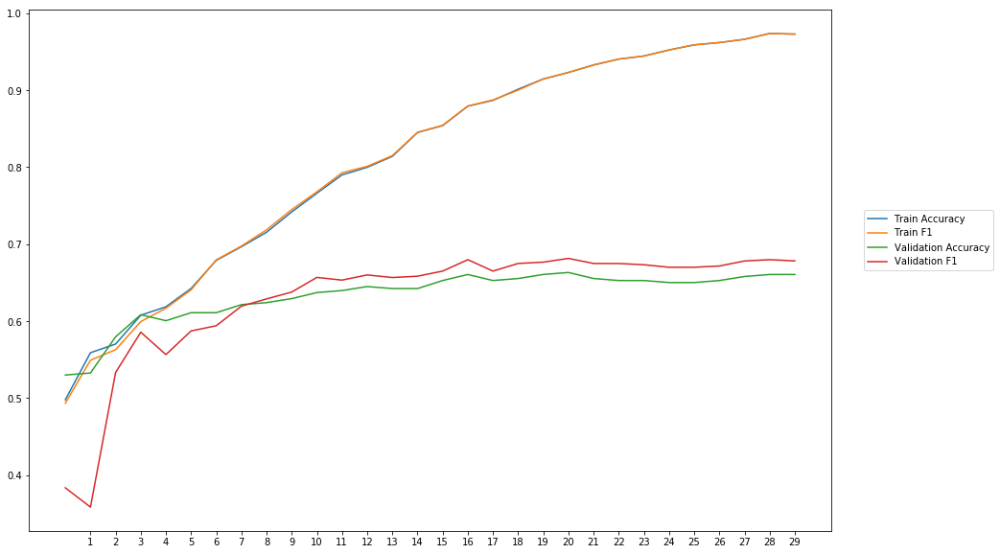

Average Accuracy: 63.31%
Average Precision: 62.62%
Average Recall: 64.29%
Average F1: 62.94%

-----Fold 10--------


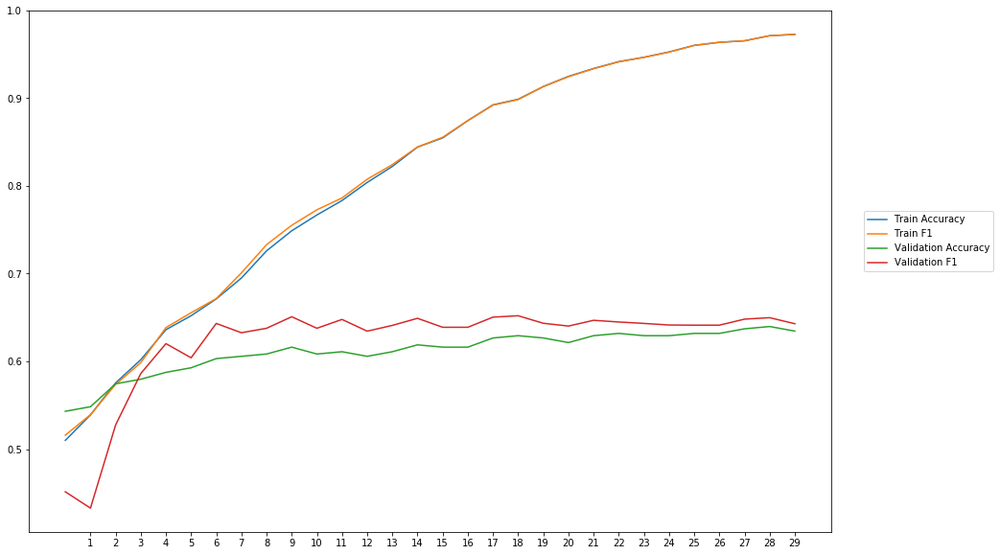

Average Accuracy: 61.15%
Average Precision: 60.18%
Average Recall: 65.03%
Average F1: 62.20%

-------Overallresults-------


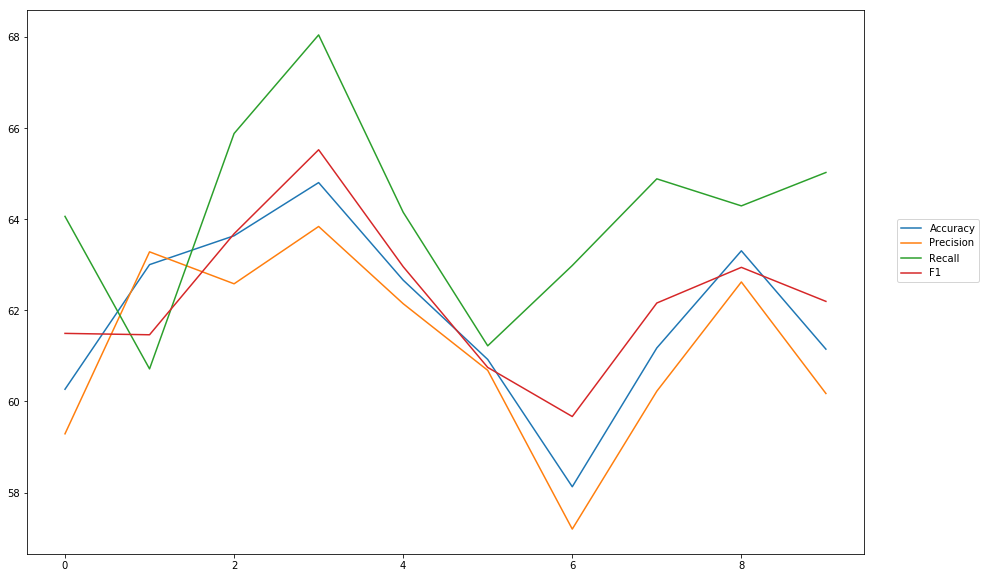

Accuracy: Mean = 61.91% (+/- 1.85%), Max = 64.80%, Min =  58.13%
Precision: Mean = 61.21% (+/- 1.95%), Max = 63.84%, Min =  57.20%
Recall: Mean = 64.13% (+/- 2.03%), Max = 68.05%, Min =  60.72%
F1: Mean = 62.28% (+/- 1.54%), Max = 65.52%, Min =  59.67%


In [25]:
cross_val_three_inputs(model_8, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropHidden0_5')

## Dropout on input and hidden layer

### dropout rate = 0.2

In [21]:
#Word Embeddings
wv_layer_9 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_9 = wv_layer_9(input_embedding_9)
drop_embedding_9 = Dropout(0.2)(embedded_sequences_9)
x_embedding_9 = Dense(600, activation='relu')(drop_embedding_9)
x_embedding_9 = Dropout(0.2)(x_embedding_9)
x_embedding_9 = Flatten()(x_embedding_9)

#Sentiment Features
input_sentiment_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_9 = Dropout(0.2)(input_sentiment_9)
x_sentiment_9 = Dense(600, activation='relu')(drop_sentiment_9)
x_sentiment_9 = Dropout(0.2)(x_sentiment_9)

#POS Features
input_pos_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_9 = Dropout(0.2)(input_pos_9)
x_pos_9 = Dense(600, activation='relu')(drop_pos_9)
x_pos_9 = Dropout(0.2)(x_pos_9)

#Concatination
concat_9 = concatenate([x_embedding_9, x_sentiment_9, x_pos_9])
preds_9 = Dense(2, activation='softmax')(concat_9)

model_9 = Model(inputs=[input_embedding_9, input_sentiment_9, input_pos_9], outputs=preds_9)


-----Fold 1--------


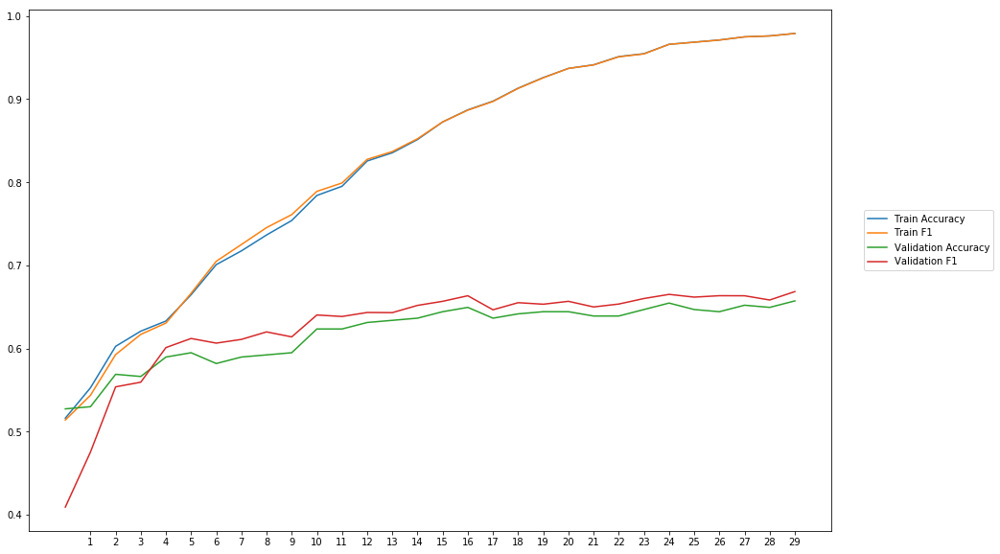

Average Accuracy: 61.90%
Average Precision: 61.05%
Average Recall: 64.39%
Average F1: 62.51%

-----Fold 2--------


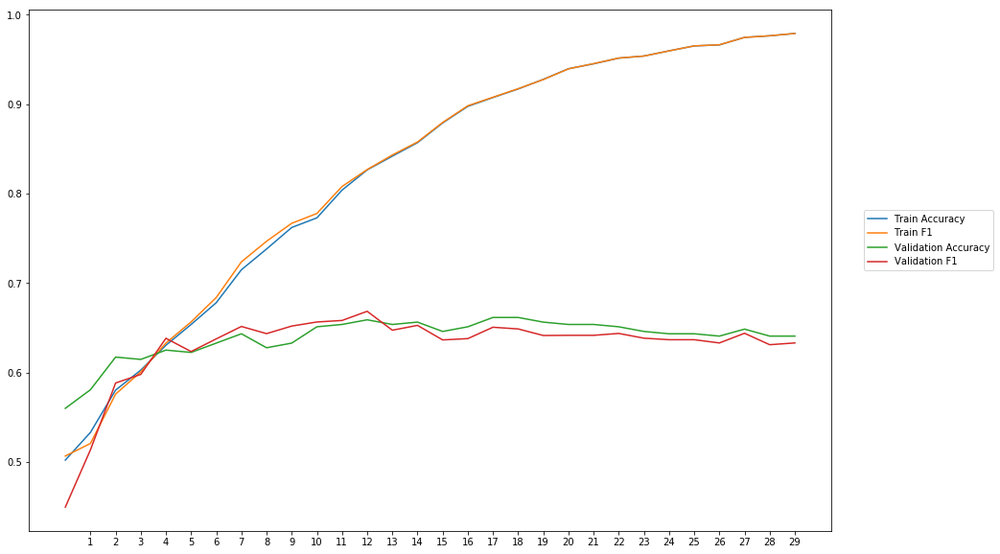

Average Accuracy: 63.89%
Average Precision: 64.13%
Average Recall: 62.06%
Average F1: 62.90%

-----Fold 3--------


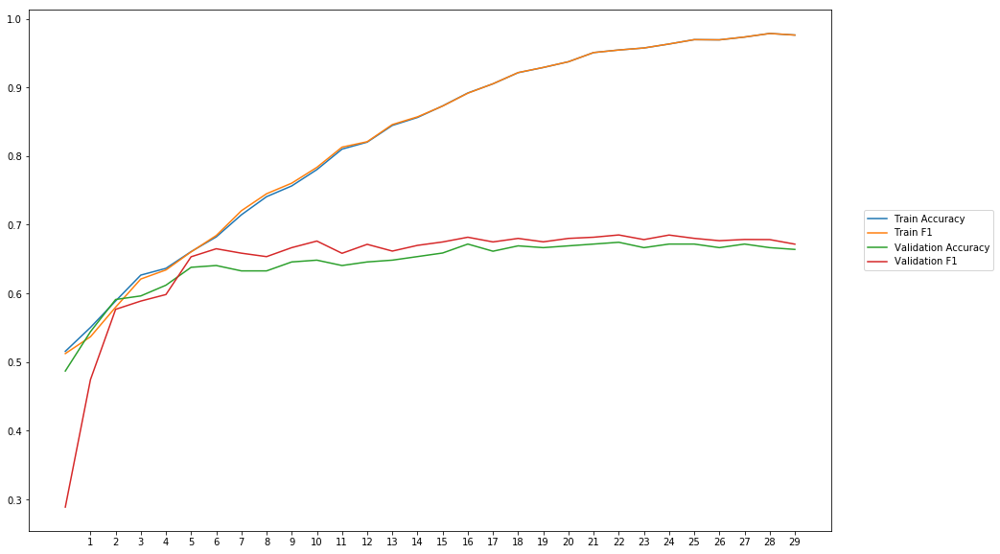

Average Accuracy: 64.27%
Average Precision: 62.97%
Average Recall: 66.68%
Average F1: 64.49%

-----Fold 4--------


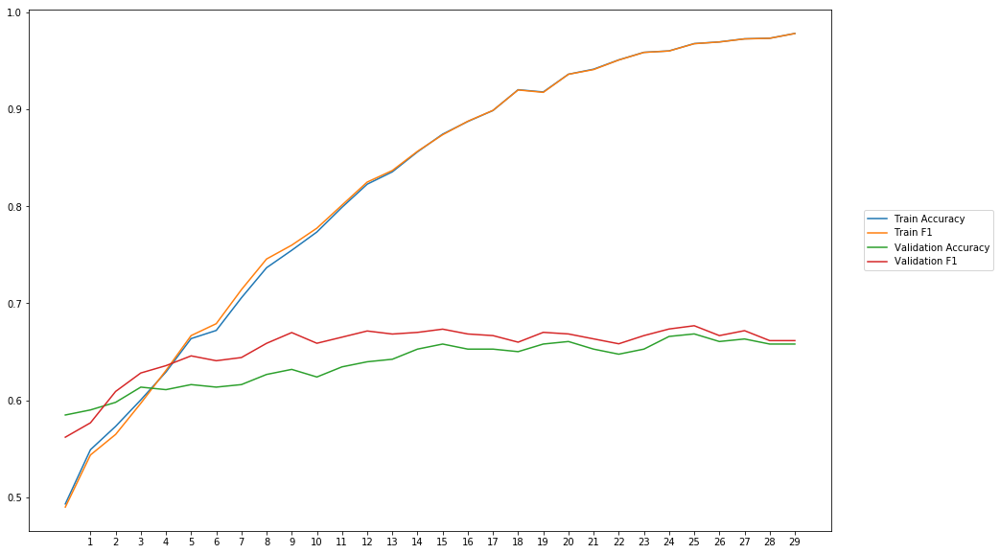

Average Accuracy: 63.85%
Average Precision: 62.59%
Average Recall: 68.57%
Average F1: 65.37%

-----Fold 5--------


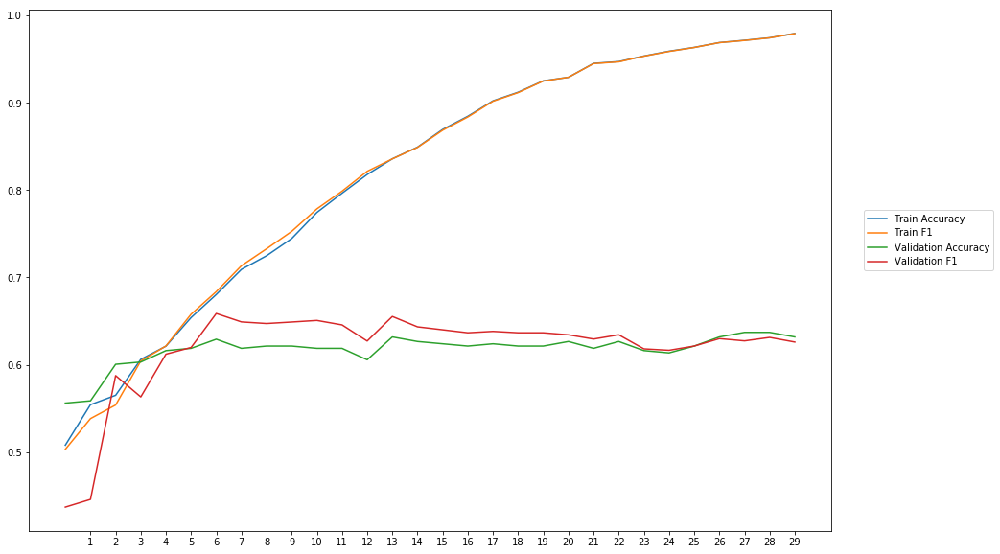

Average Accuracy: 61.73%
Average Precision: 61.32%
Average Recall: 63.05%
Average F1: 61.83%

-----Fold 6--------


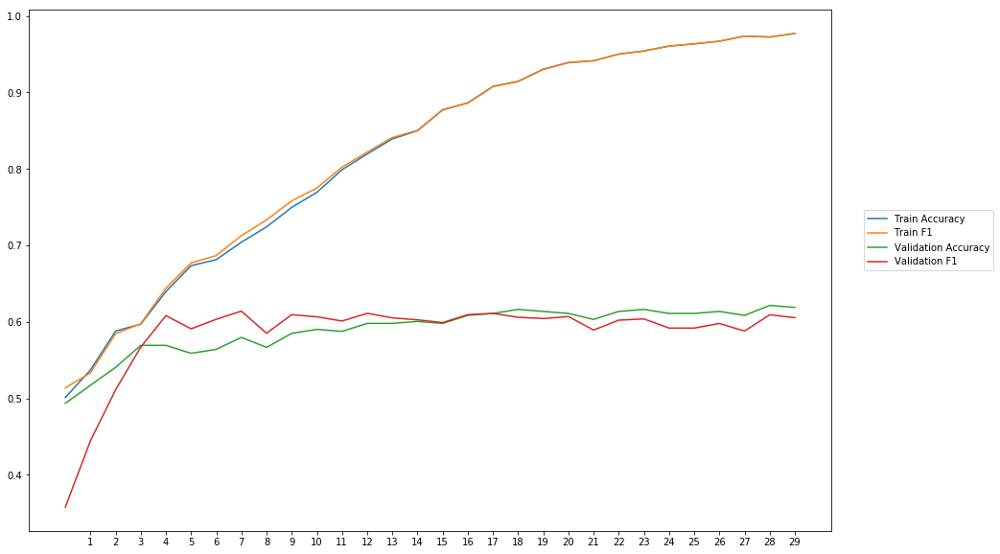

Average Accuracy: 58.97%
Average Precision: 58.90%
Average Recall: 58.46%
Average F1: 58.44%

-----Fold 7--------


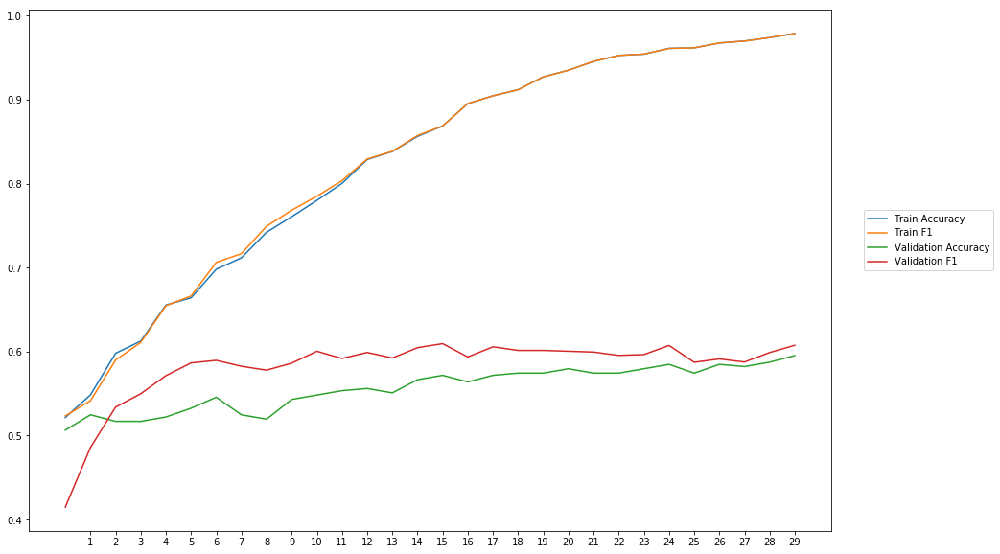

Average Accuracy: 55.67%
Average Precision: 54.93%
Average Recall: 62.23%
Average F1: 58.17%

-----Fold 8--------


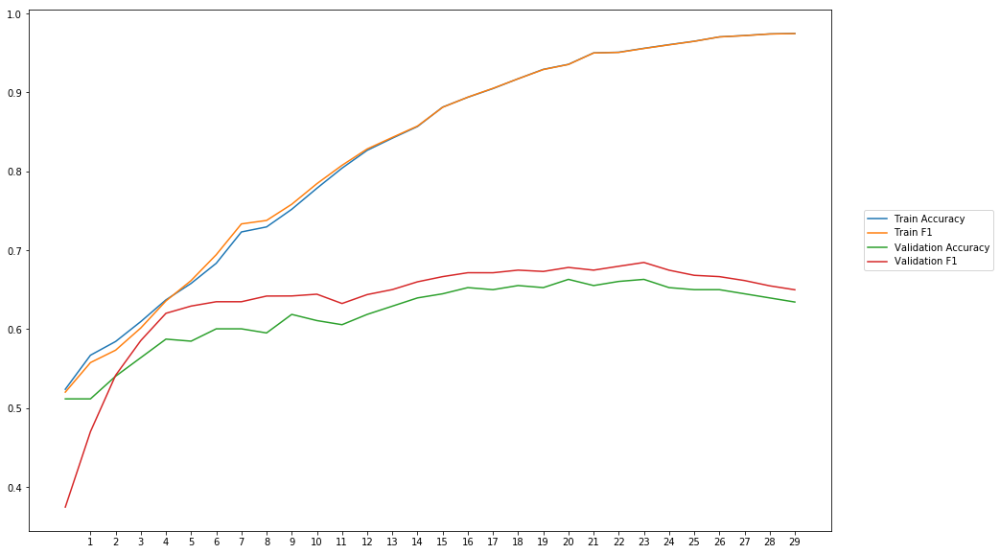

Average Accuracy: 61.97%
Average Precision: 60.50%
Average Recall: 67.35%
Average F1: 63.53%

-----Fold 9--------


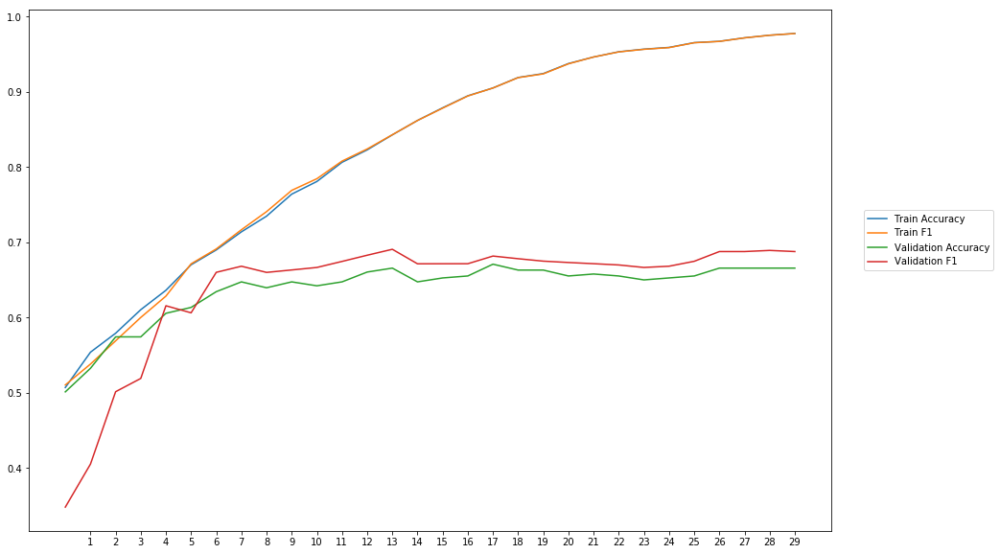

Average Accuracy: 63.77%
Average Precision: 62.55%
Average Recall: 66.39%
Average F1: 63.97%

-----Fold 10--------


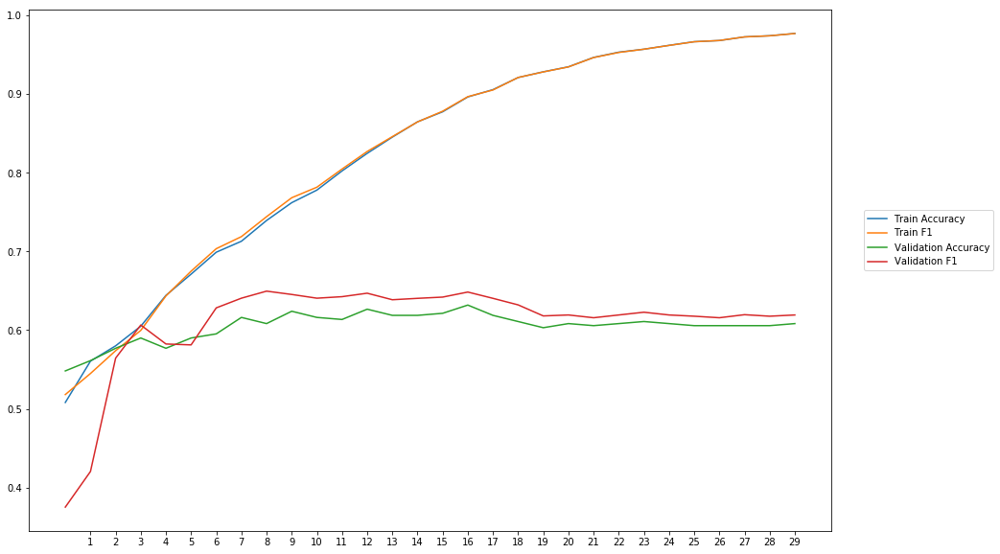

Average Accuracy: 60.47%
Average Precision: 59.89%
Average Recall: 62.97%
Average F1: 60.90%

-------Overallresults-------


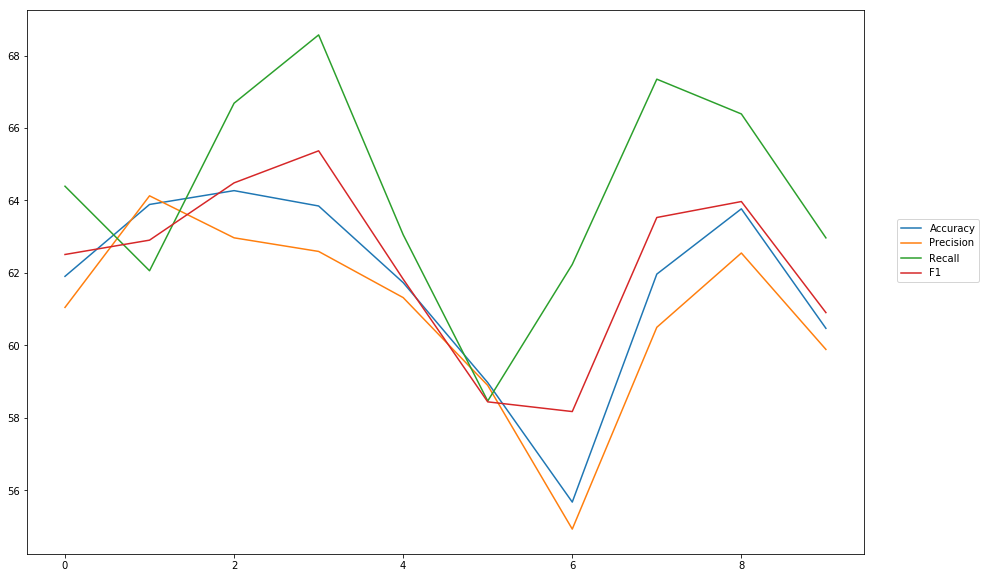

Accuracy: Mean = 61.65% (+/- 2.56%), Max = 64.27%, Min =  55.67%
Precision: Mean = 60.88% (+/- 2.48%), Max = 64.13%, Min =  54.93%
Recall: Mean = 64.22% (+/- 2.90%), Max = 68.57%, Min =  58.46%
F1: Mean = 62.21% (+/- 2.30%), Max = 65.37%, Min =  58.17%


In [27]:
cross_val_three_inputs(model_9, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInputHidden0_2')

### dropout rate = 0.3

In [28]:
#Word Embeddings
wv_layer_10 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_10 = wv_layer_10(input_embedding_10)
drop_embedding_10 = Dropout(0.3)(embedded_sequences_10)
x_embedding_10 = Dense(600, activation='relu')(drop_embedding_10)
x_embedding_10 = Dropout(0.3)(x_embedding_10)
x_embedding_10 = Flatten()(x_embedding_10)

#Sentiment Features
input_sentiment_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_10 = Dropout(0.3)(input_sentiment_10)
x_sentiment_10 = Dense(600, activation='relu')(drop_sentiment_10)
x_sentiment_10 = Dropout(0.3)(x_sentiment_10)

#POS Features
input_pos_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_10 = Dropout(0.3)(input_pos_10)
x_pos_10 = Dense(600, activation='relu')(drop_pos_10)
x_pos_10 = Dropout(0.3)(x_pos_10)

#Concatination
concat_10 = concatenate([x_embedding_10, x_sentiment_10, x_pos_10])
preds_10 = Dense(2, activation='softmax')(concat_10)

model_10 = Model(inputs=[input_embedding_10, input_sentiment_10, input_pos_10], outputs=preds_10)


-----Fold 1--------


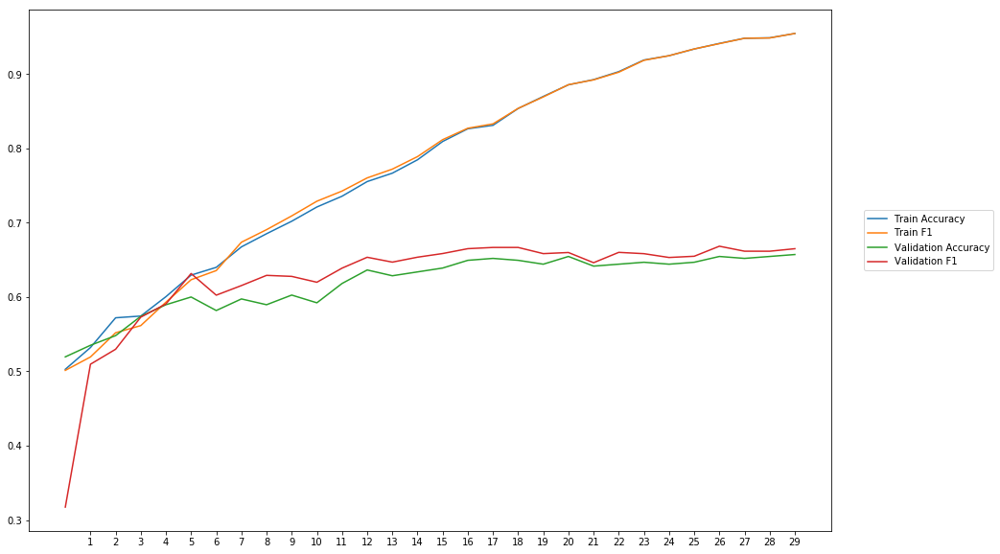

Average Accuracy: 61.92%
Average Precision: 61.02%
Average Recall: 64.67%
Average F1: 62.48%

-----Fold 2--------


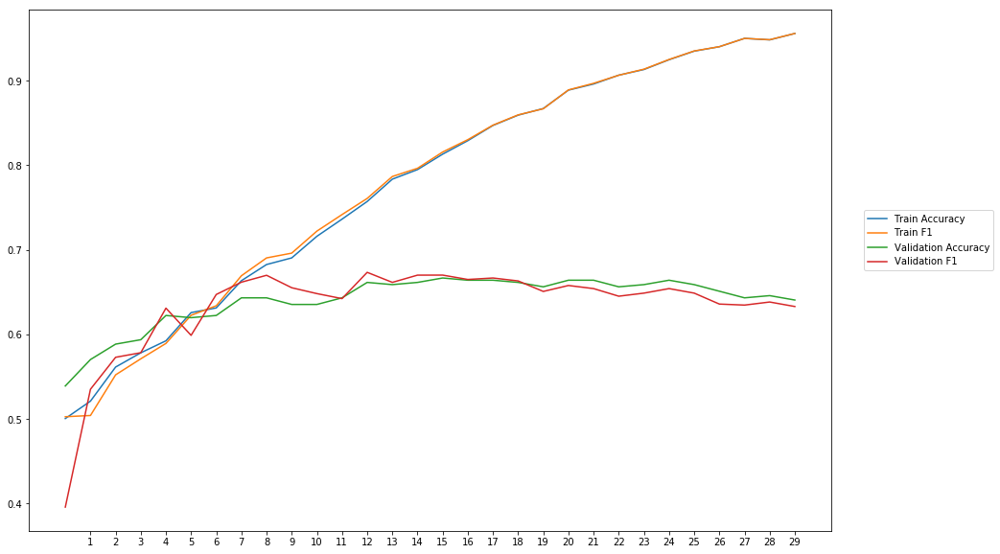

Average Accuracy: 63.99%
Average Precision: 63.86%
Average Recall: 63.30%
Average F1: 63.36%

-----Fold 3--------


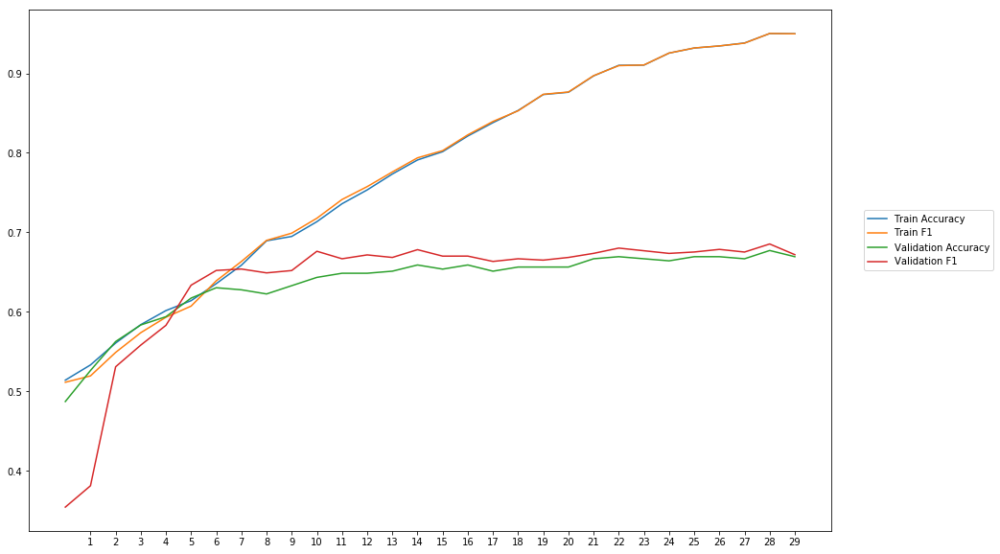

Average Accuracy: 63.61%
Average Precision: 62.45%
Average Recall: 65.60%
Average F1: 63.67%

-----Fold 4--------


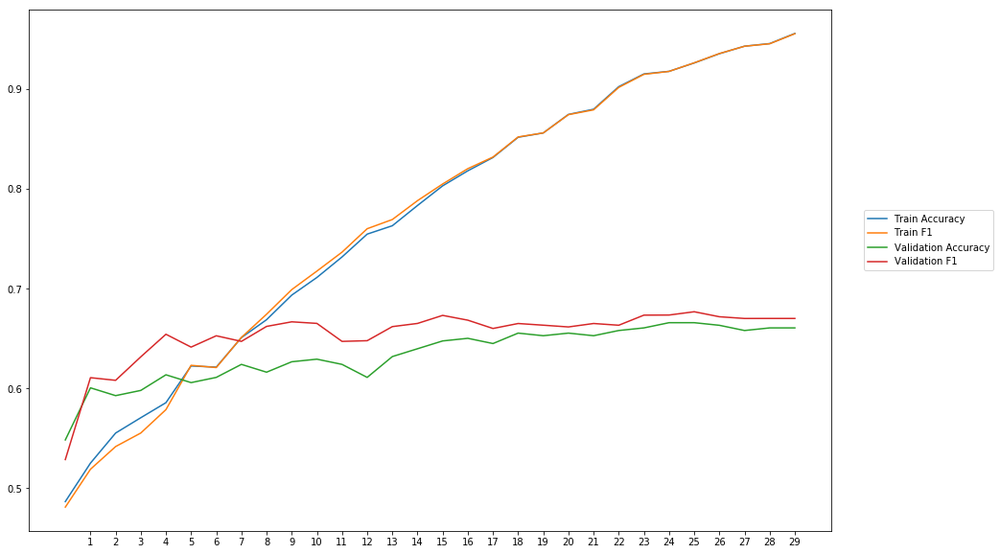

Average Accuracy: 63.41%
Average Precision: 61.96%
Average Recall: 69.39%
Average F1: 65.38%

-----Fold 5--------


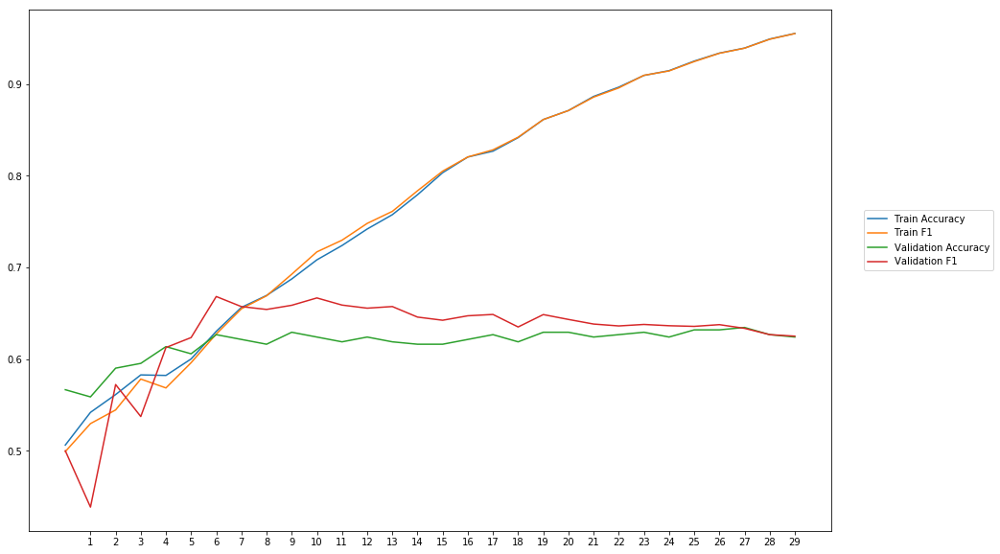

Average Accuracy: 61.73%
Average Precision: 60.90%
Average Recall: 65.18%
Average F1: 62.59%

-----Fold 6--------


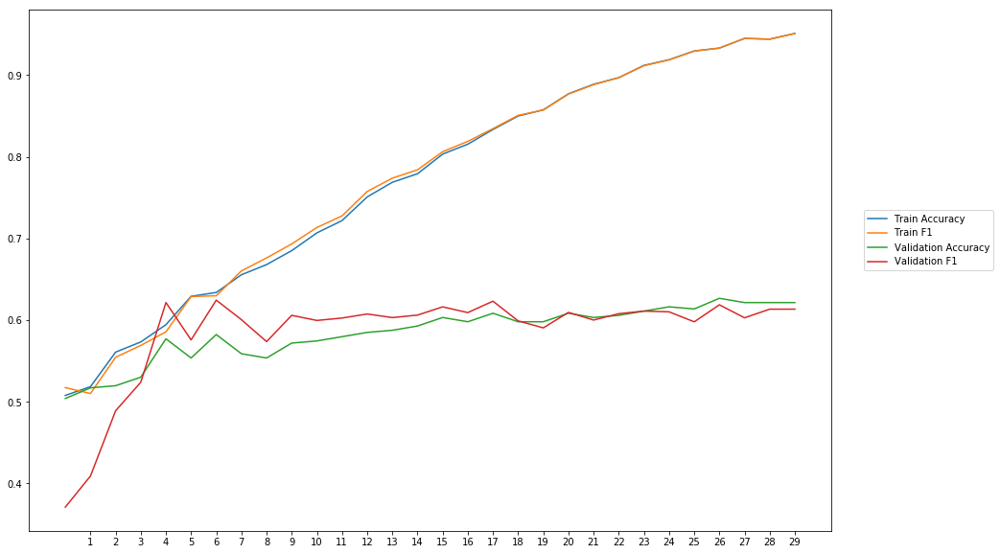

Average Accuracy: 58.47%
Average Precision: 58.13%
Average Recall: 59.37%
Average F1: 58.45%

-----Fold 7--------


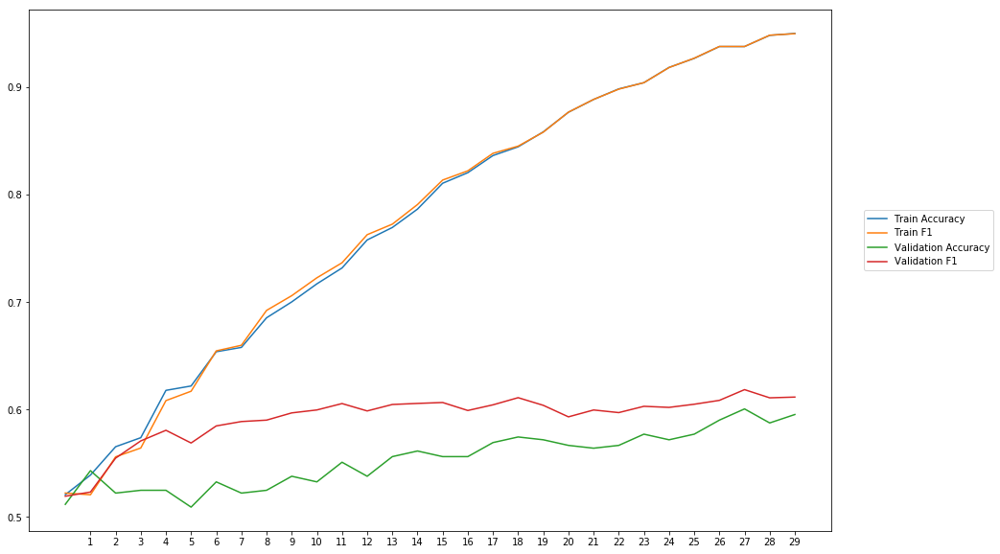

Average Accuracy: 55.39%
Average Precision: 54.51%
Average Recall: 65.04%
Average F1: 59.22%

-----Fold 8--------


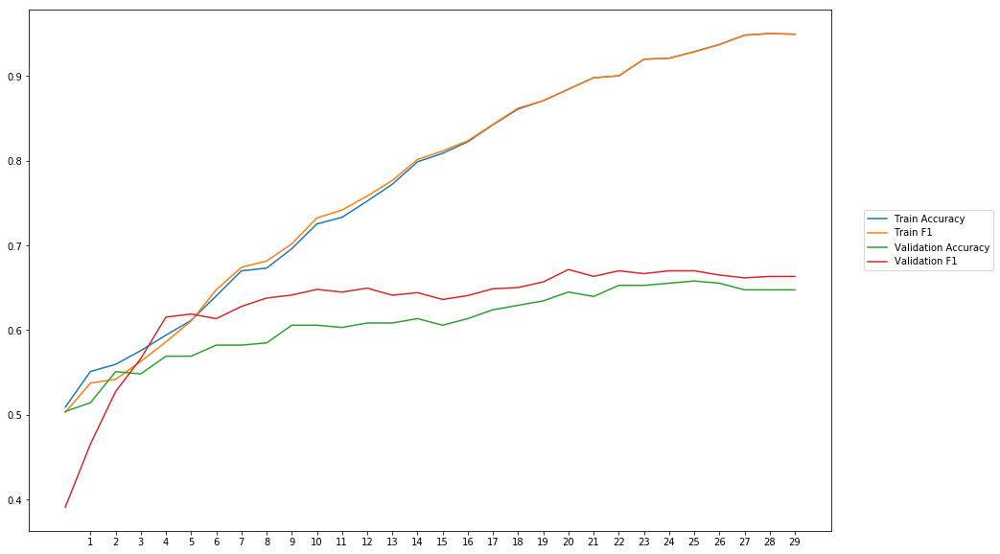

Average Accuracy: 60.86%
Average Precision: 59.43%
Average Recall: 67.02%
Average F1: 62.77%

-----Fold 9--------


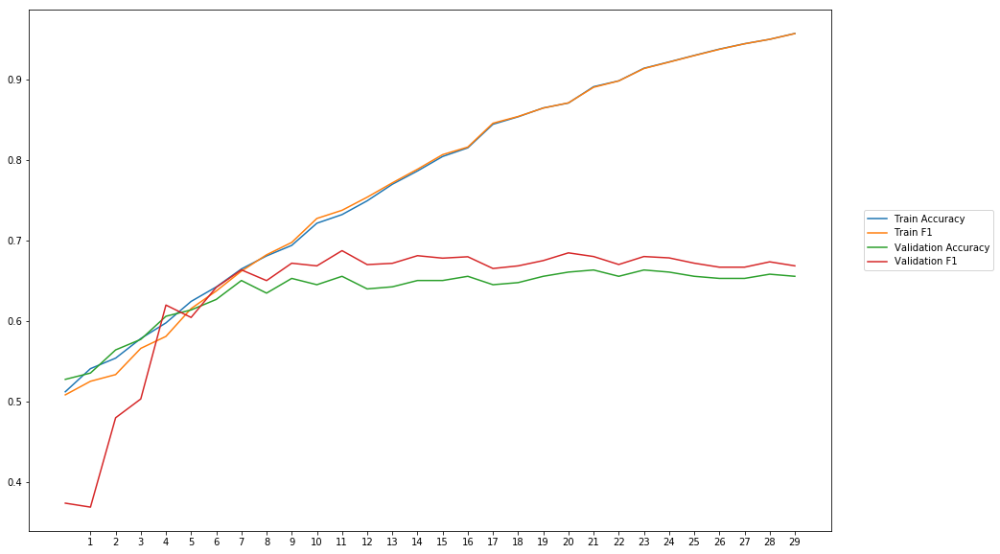

Average Accuracy: 63.50%
Average Precision: 62.45%
Average Recall: 65.90%
Average F1: 63.53%

-----Fold 10--------


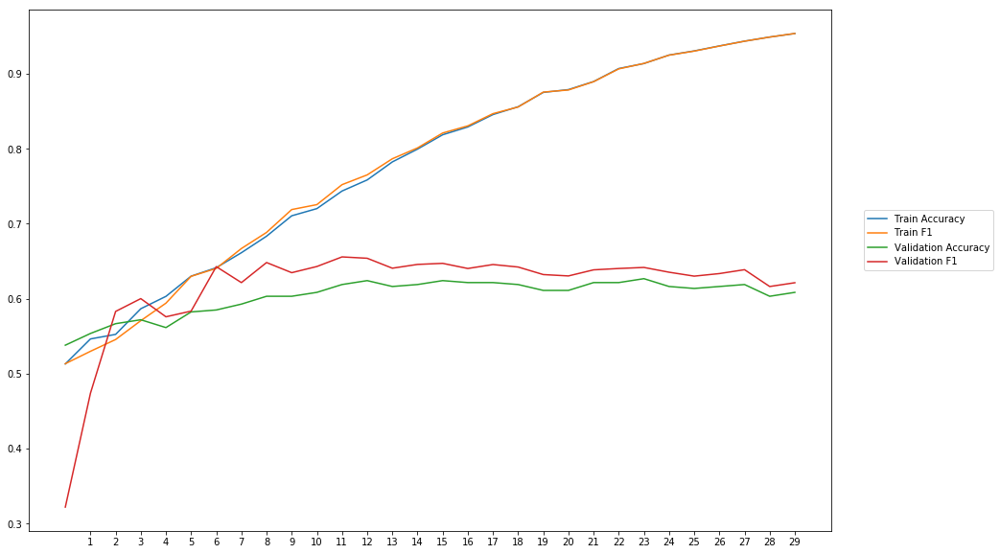

Average Accuracy: 60.32%
Average Precision: 59.35%
Average Recall: 64.92%
Average F1: 61.52%

-------Overallresults-------


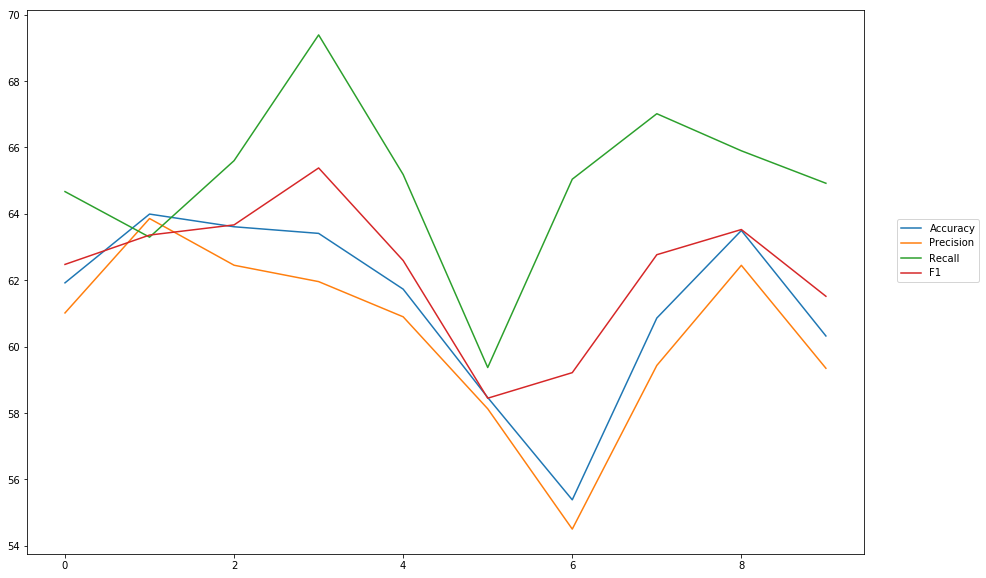

Accuracy: Mean = 61.32% (+/- 2.58%), Max = 63.99%, Min =  55.39%
Precision: Mean = 60.41% (+/- 2.56%), Max = 63.86%, Min =  54.51%
Recall: Mean = 65.04% (+/- 2.43%), Max = 69.39%, Min =  59.37%
F1: Mean = 62.30% (+/- 1.98%), Max = 65.38%, Min =  58.45%


In [29]:
cross_val_three_inputs(model_10, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInputHidden0_3')

### dropout rate = 0.4

In [30]:
#Word Embeddings
wv_layer_11 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_11 = wv_layer_11(input_embedding_11)
drop_embedding_11 = Dropout(0.4)(embedded_sequences_11)
x_embedding_11 = Dense(600, activation='relu')(drop_embedding_11)
x_embedding_11 = Dropout(0.4)(x_embedding_11)
x_embedding_11 = Flatten()(x_embedding_11)

#Sentiment Features
input_sentiment_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_11 = Dropout(0.4)(input_sentiment_11)
x_sentiment_11 = Dense(600, activation='relu')(drop_sentiment_11)
x_sentiment_11 = Dropout(0.4)(x_sentiment_11)

#POS Features
input_pos_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_11 = Dropout(0.4)(input_pos_11)
x_pos_11 = Dense(600, activation='relu')(drop_pos_11)
x_pos_11 = Dropout(0.4)(x_pos_11)

#Concatination
concat_11 = concatenate([x_embedding_11, x_sentiment_11, x_pos_11])
preds_11 = Dense(2, activation='softmax')(concat_11)

model_11 = Model(inputs=[input_embedding_11, input_sentiment_11, input_pos_11], outputs=preds_11)


-----Fold 1--------


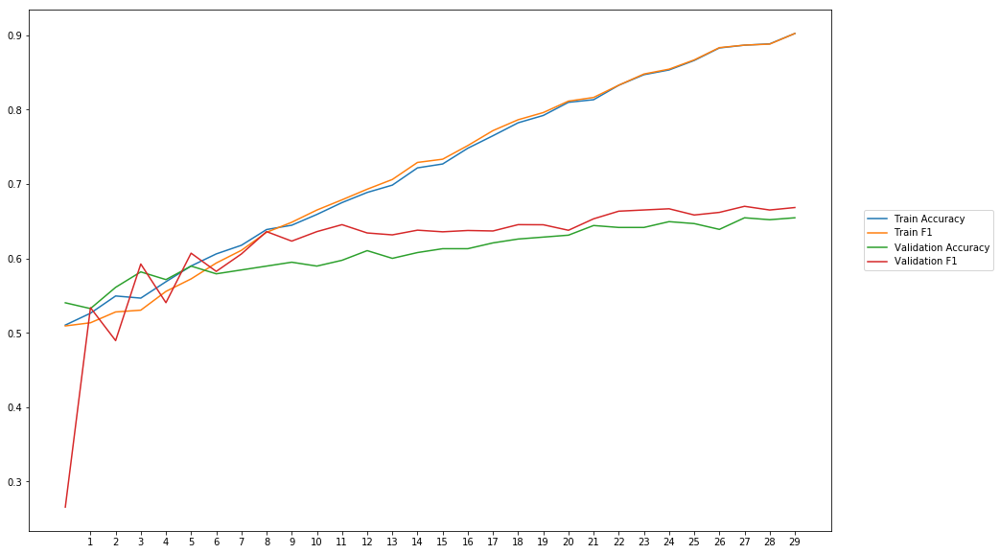

Average Accuracy: 60.95%
Average Precision: 60.26%
Average Recall: 64.41%
Average F1: 61.57%

-----Fold 2--------


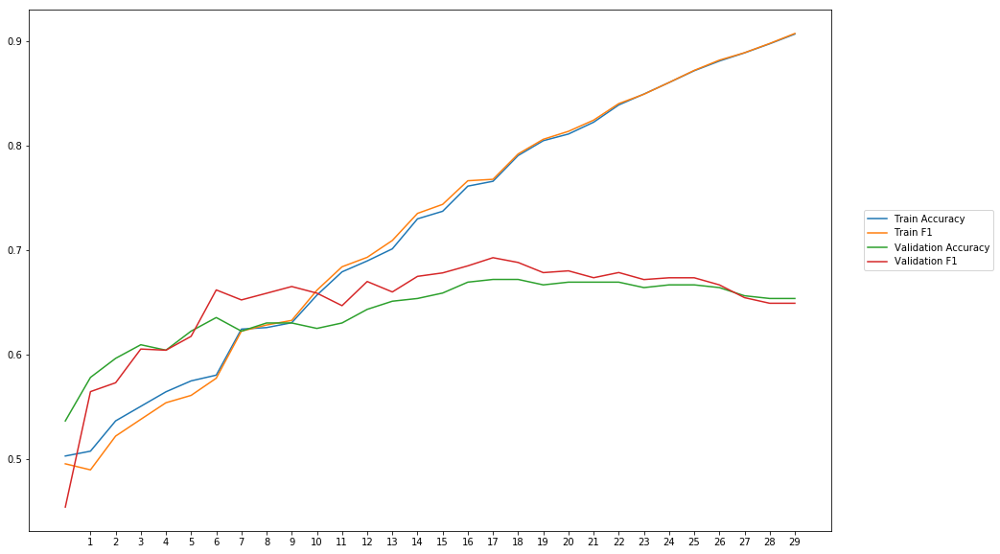

Average Accuracy: 64.13%
Average Precision: 63.04%
Average Recall: 67.12%
Average F1: 64.86%

-----Fold 3--------


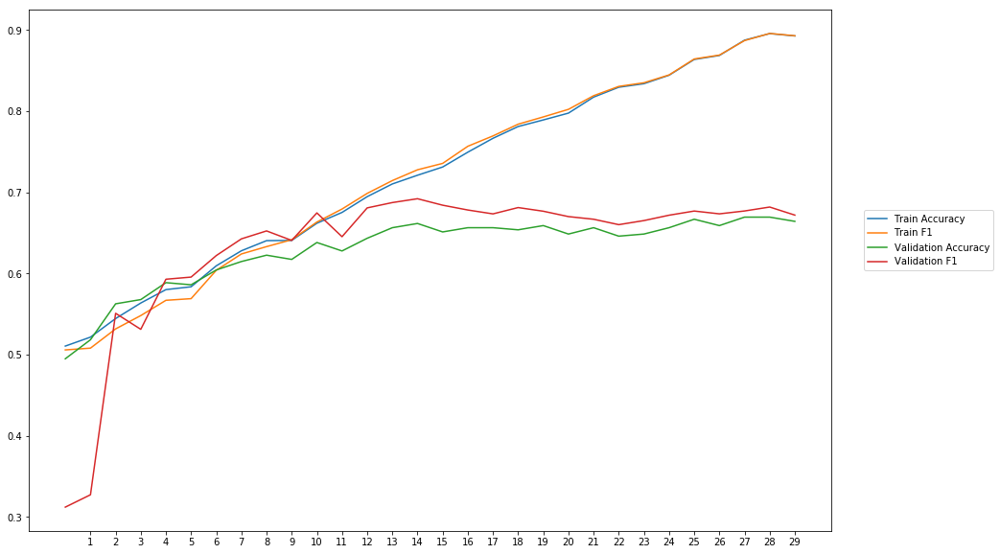

Average Accuracy: 62.87%
Average Precision: 61.37%
Average Recall: 66.20%
Average F1: 63.18%

-----Fold 4--------


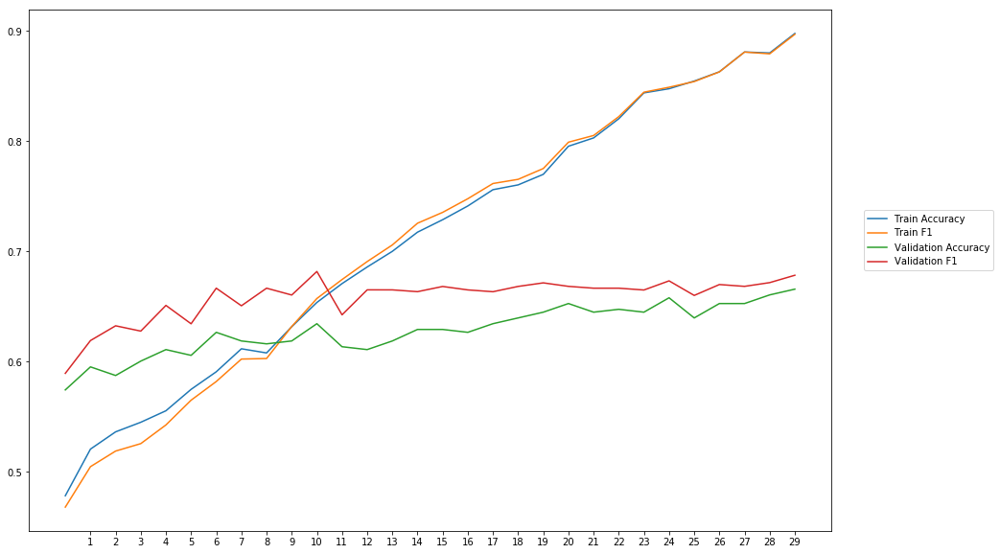

Average Accuracy: 62.85%
Average Precision: 60.91%
Average Recall: 71.71%
Average F1: 65.81%

-----Fold 5--------


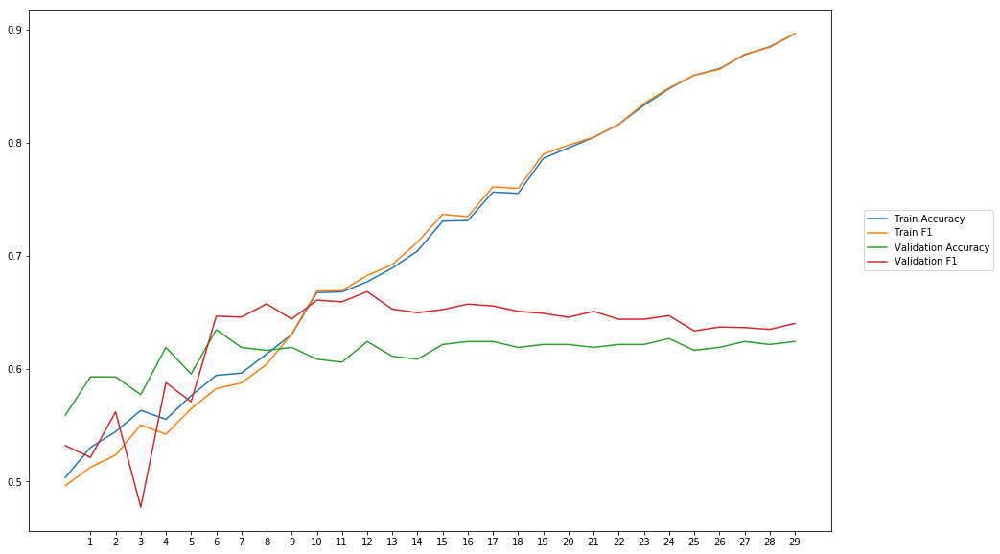

Average Accuracy: 61.35%
Average Precision: 60.37%
Average Recall: 66.13%
Average F1: 62.70%

-----Fold 6--------


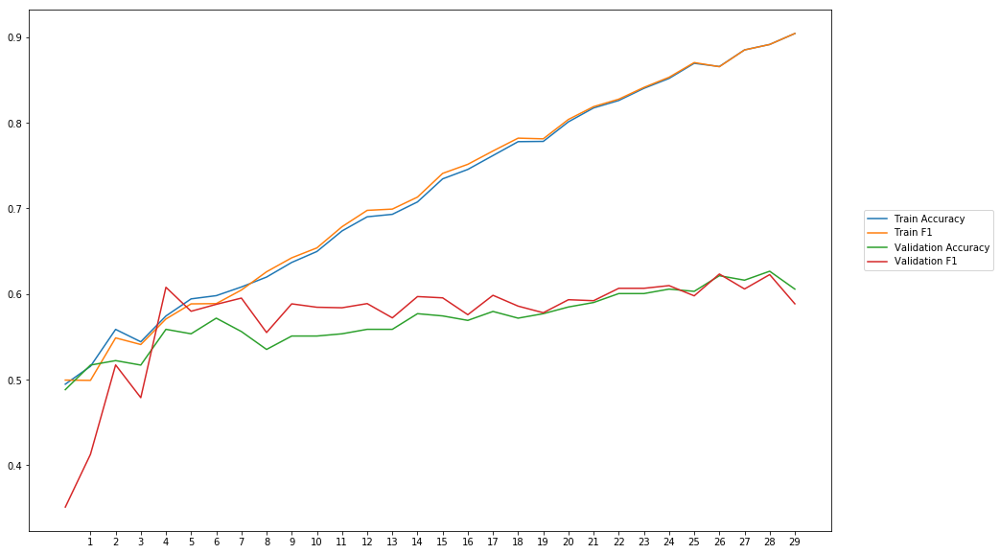

Average Accuracy: 56.99%
Average Precision: 56.56%
Average Recall: 58.57%
Average F1: 57.27%

-----Fold 7--------


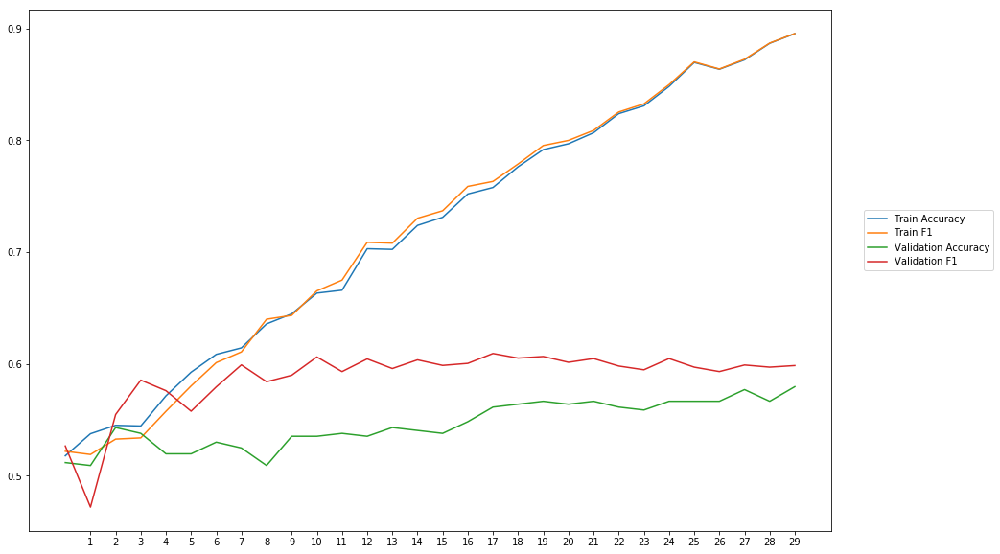

Average Accuracy: 54.61%
Average Precision: 53.74%
Average Recall: 65.17%
Average F1: 58.79%

-----Fold 8--------


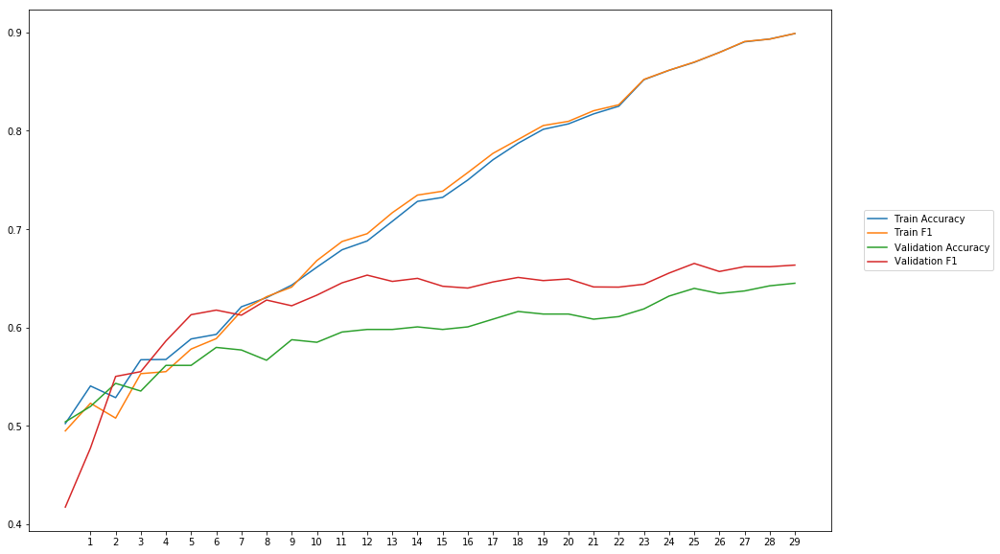

Average Accuracy: 59.43%
Average Precision: 57.85%
Average Recall: 67.80%
Average F1: 62.24%

-----Fold 9--------


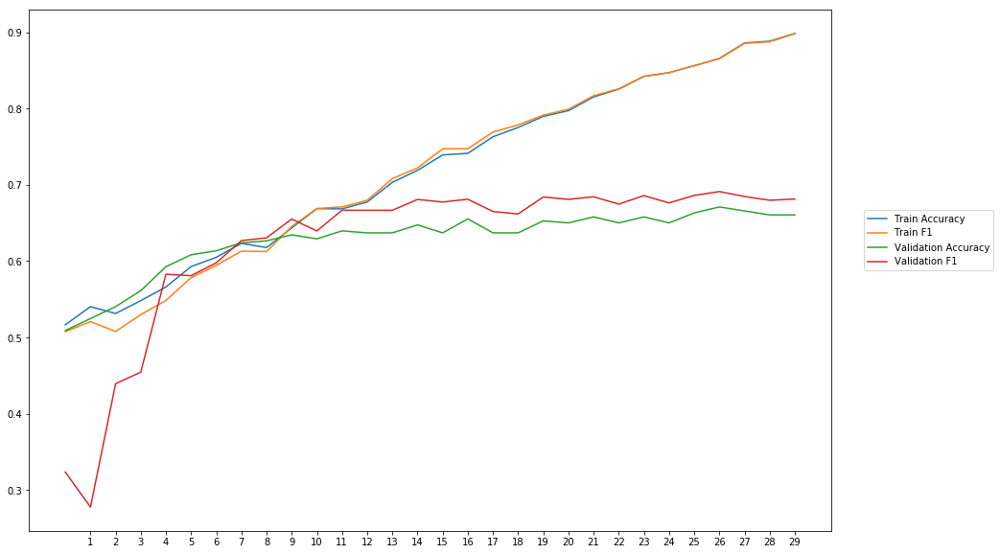

Average Accuracy: 62.78%
Average Precision: 61.70%
Average Recall: 64.82%
Average F1: 62.28%

-----Fold 10--------


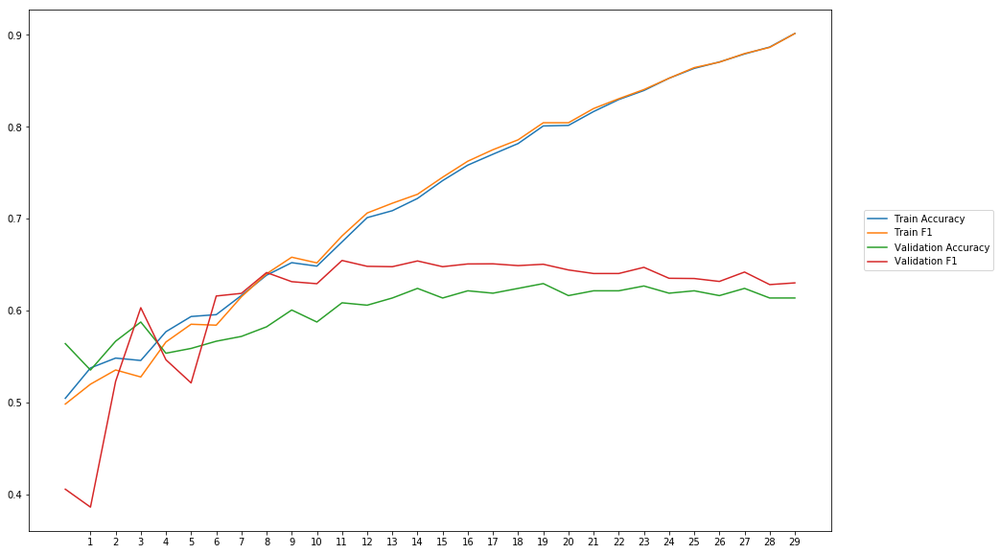

Average Accuracy: 60.09%
Average Precision: 59.20%
Average Recall: 64.55%
Average F1: 61.15%

-------Overallresults-------


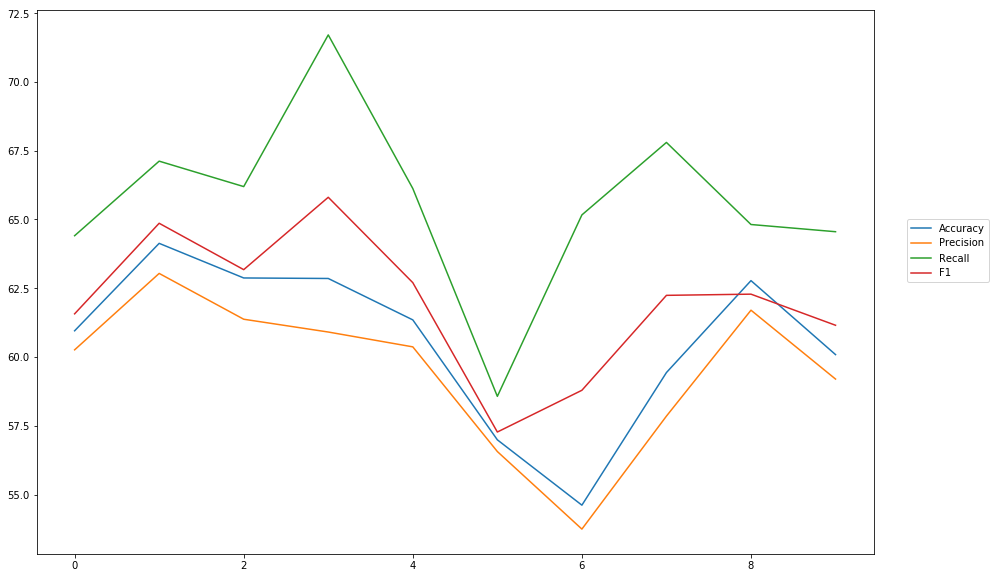

Accuracy: Mean = 60.61% (+/- 2.80%), Max = 64.13%, Min =  54.61%
Precision: Mean = 59.50% (+/- 2.62%), Max = 63.04%, Min =  53.74%
Recall: Mean = 65.65% (+/- 3.13%), Max = 71.71%, Min =  58.57%
F1: Mean = 61.99% (+/- 2.41%), Max = 65.81%, Min =  57.27%


In [31]:
cross_val_three_inputs(model_11, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInputHidden0_4')

### dropout rate = 0.5

In [32]:
#Word Embeddings
wv_layer_12 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_12 = wv_layer_12(input_embedding_12)
drop_embedding_12 = Dropout(0.5)(embedded_sequences_12)
x_embedding_12 = Dense(600, activation='relu')(drop_embedding_12)
x_embedding_12 = Dropout(0.5)(x_embedding_12)
x_embedding_12 = Flatten()(x_embedding_12)

#Sentiment Features
input_sentiment_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_12 = Dropout(0.5)(input_sentiment_12)
x_sentiment_12 = Dense(600, activation='relu')(drop_sentiment_12)
x_sentiment_12 = Dropout(0.5)(x_sentiment_12)

#POS Features
input_pos_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_12 = Dropout(0.5)(input_pos_12)
x_pos_12 = Dense(600, activation='relu')(drop_pos_12)
x_pos_12 = Dropout(0.5)(x_pos_12)

#Concatination
concat_12 = concatenate([x_embedding_12, x_sentiment_12, x_pos_12])
preds_12 = Dense(2, activation='softmax')(concat_12)

model_12 = Model(inputs=[input_embedding_12, input_sentiment_12, input_pos_12], outputs=preds_12)


-----Fold 1--------


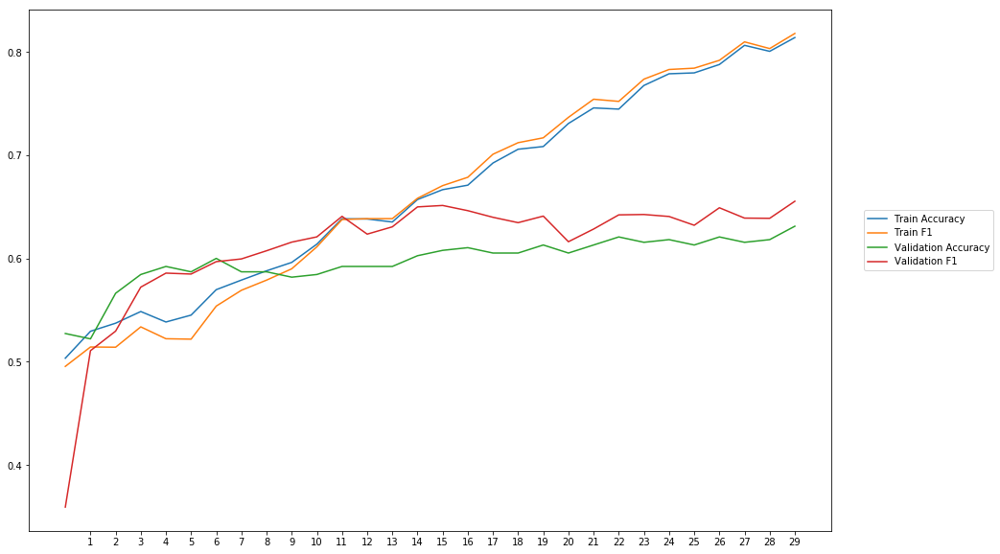

Average Accuracy: 59.71%
Average Precision: 58.67%
Average Recall: 64.46%
Average F1: 61.08%

-----Fold 2--------


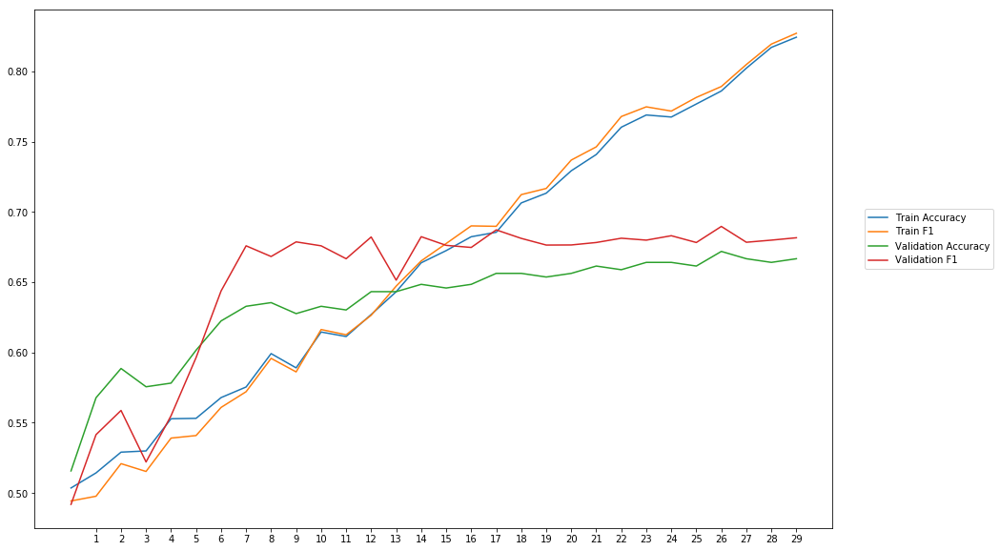

Average Accuracy: 63.46%
Average Precision: 61.78%
Average Recall: 69.01%
Average F1: 64.97%

-----Fold 3--------


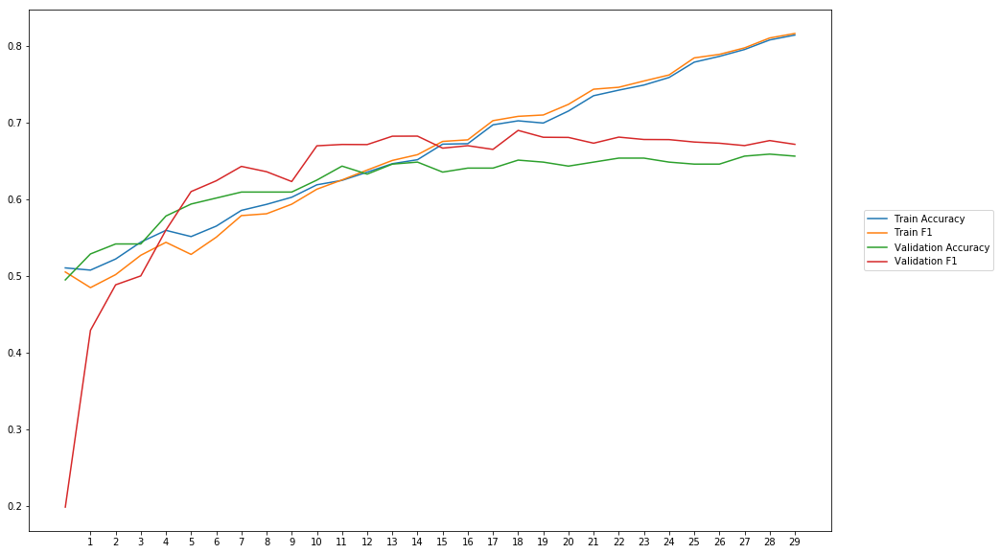

Average Accuracy: 62.10%
Average Precision: 60.23%
Average Recall: 66.89%
Average F1: 62.72%

-----Fold 4--------


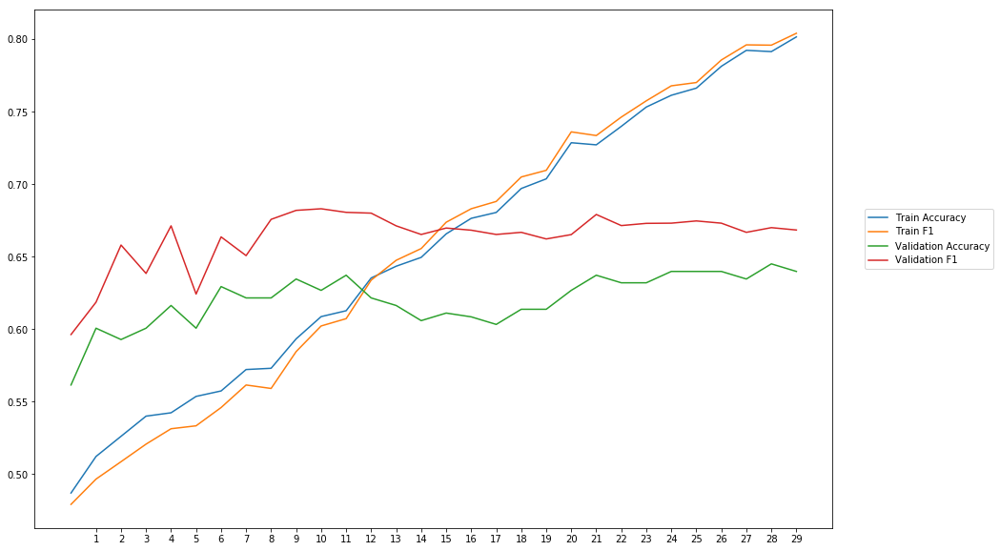

Average Accuracy: 62.00%
Average Precision: 59.45%
Average Recall: 75.22%
Average F1: 66.34%

-----Fold 5--------


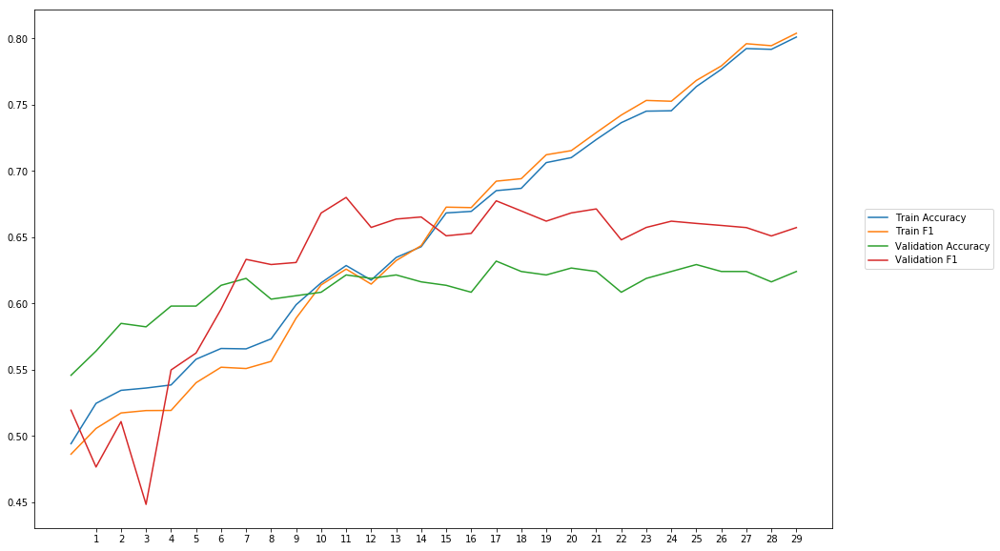

Average Accuracy: 61.06%
Average Precision: 59.92%
Average Recall: 67.24%
Average F1: 62.65%

-----Fold 6--------


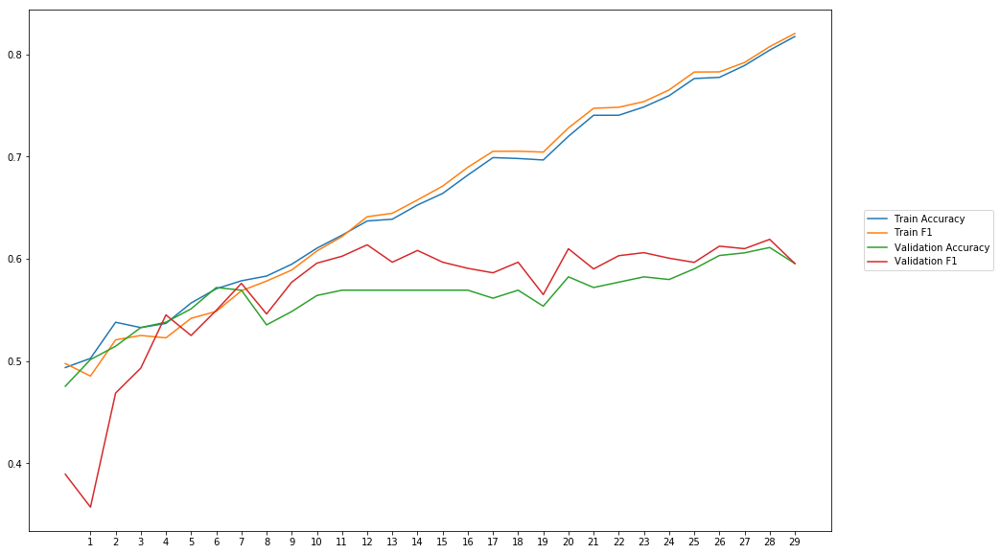

Average Accuracy: 56.33%
Average Precision: 55.73%
Average Recall: 58.38%
Average F1: 56.73%

-----Fold 7--------


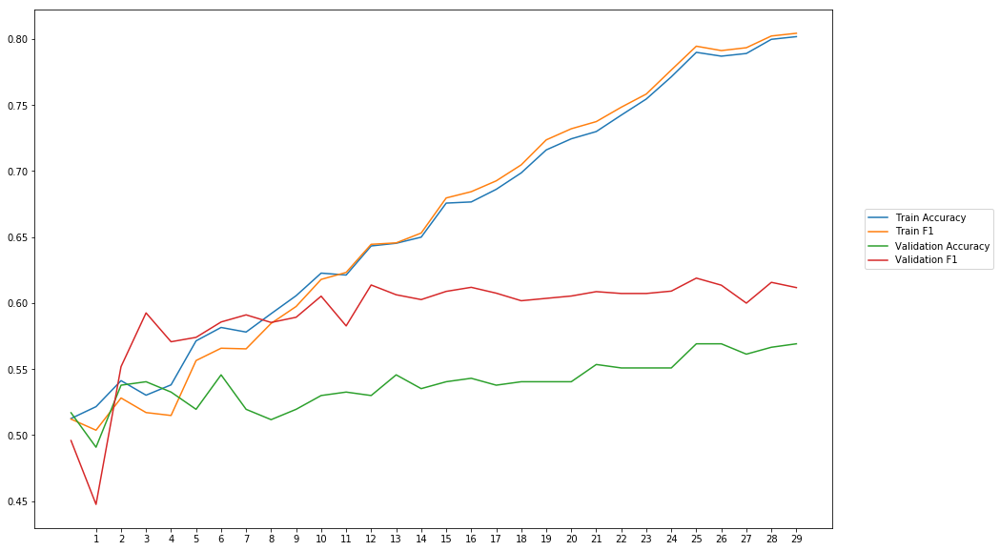

Average Accuracy: 53.98%
Average Precision: 53.02%
Average Recall: 67.12%
Average F1: 59.09%

-----Fold 8--------


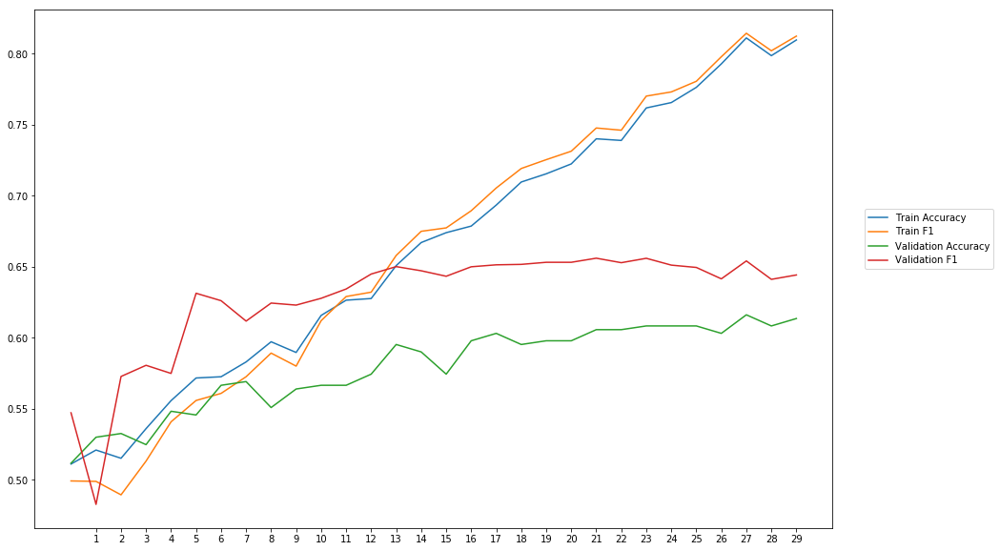

Average Accuracy: 57.94%
Average Precision: 56.14%
Average Recall: 71.50%
Average F1: 62.76%

-----Fold 9--------


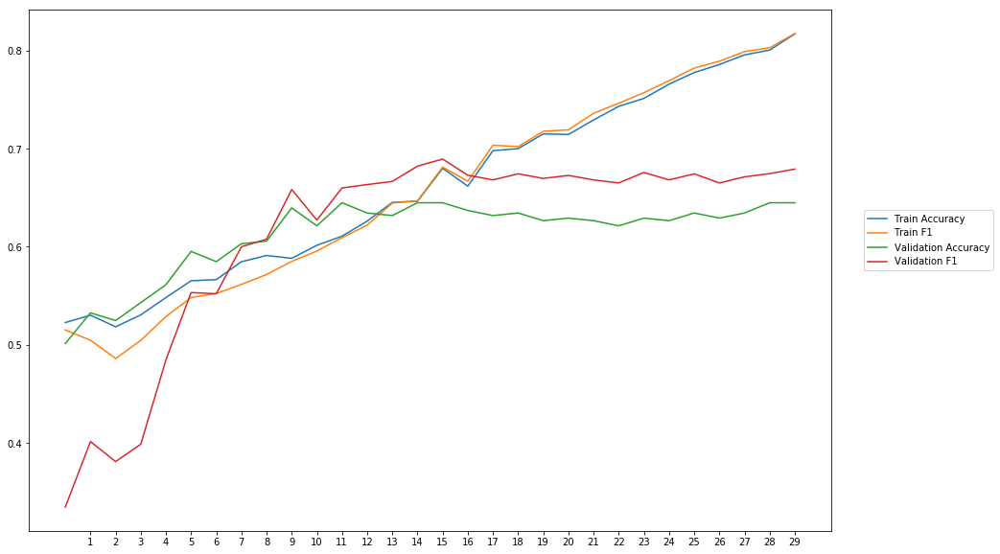

Average Accuracy: 61.22%
Average Precision: 59.94%
Average Recall: 64.64%
Average F1: 61.20%

-----Fold 10--------


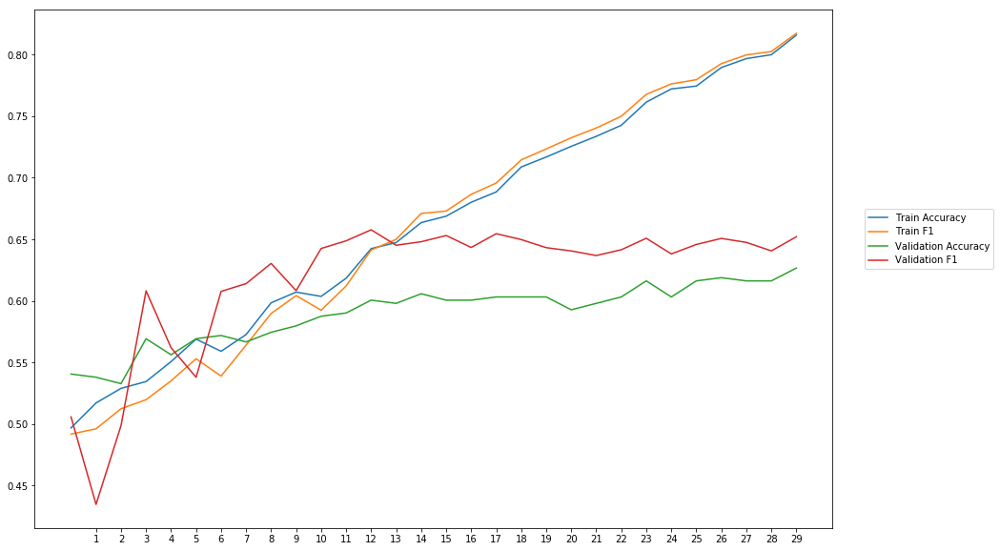

Average Accuracy: 58.99%
Average Precision: 57.49%
Average Recall: 67.56%
Average F1: 61.79%

-------Overallresults-------


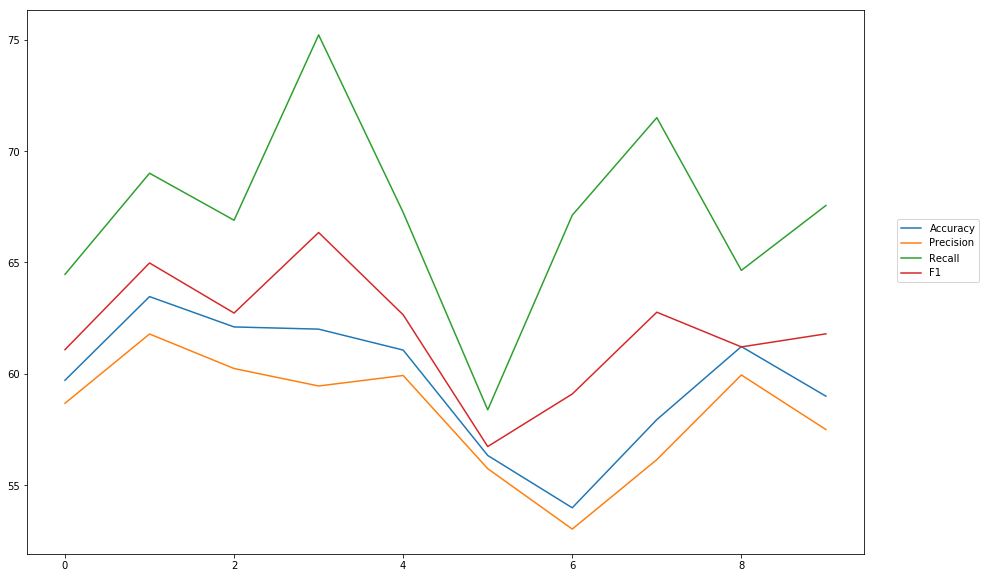

Accuracy: Mean = 59.68% (+/- 2.78%), Max = 63.46%, Min =  53.98%
Precision: Mean = 58.24% (+/- 2.50%), Max = 61.78%, Min =  53.02%
Recall: Mean = 67.20% (+/- 4.22%), Max = 75.22%, Min =  58.38%
F1: Mean = 61.93% (+/- 2.59%), Max = 66.34%, Min =  56.73%


In [33]:
cross_val_three_inputs(model_12, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInputHidden0_5')

# Addition

# Dropout on input layer

### dropout rate = 0.1

In [34]:
#Word Embeddings
wv_layer_13 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_13 = wv_layer_13(input_embedding_13)
drop_embedding_13 = Dropout(0.1)(embedded_sequences_13)
x_embedding_13 = Dense(600, activation='relu')(drop_embedding_13)
x_embedding_13 = Flatten()(x_embedding_13)

#Sentiment Features
input_sentiment_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_13 = Dropout(0.1)(input_sentiment_13)
x_sentiment_13 = Dense(600, activation='relu')(drop_sentiment_13)

#POS Features
input_pos_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_13 = Dropout(0.1)(input_pos_13)
x_pos_13 = Dense(600, activation='relu')(drop_pos_13)

#Concatination
concat_13 = concatenate([x_embedding_13, x_sentiment_13, x_pos_13])
preds_13 = Dense(2, activation='softmax')(concat_13)

model_13 = Model(inputs=[input_embedding_13, input_sentiment_13, input_pos_13], outputs=preds_13)


-----Fold 1--------


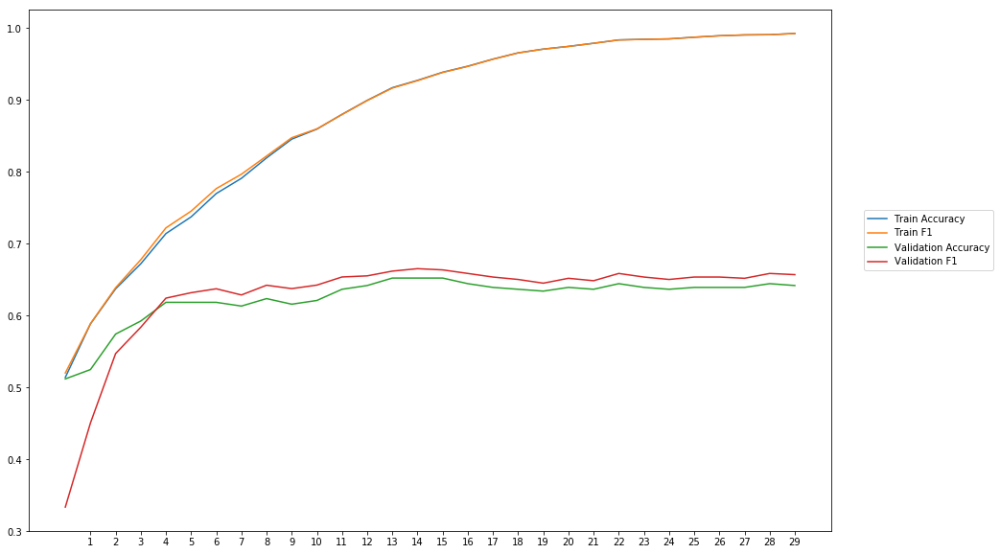

Average Accuracy: 62.38%
Average Precision: 61.47%
Average Recall: 64.46%
Average F1: 62.66%

-----Fold 2--------


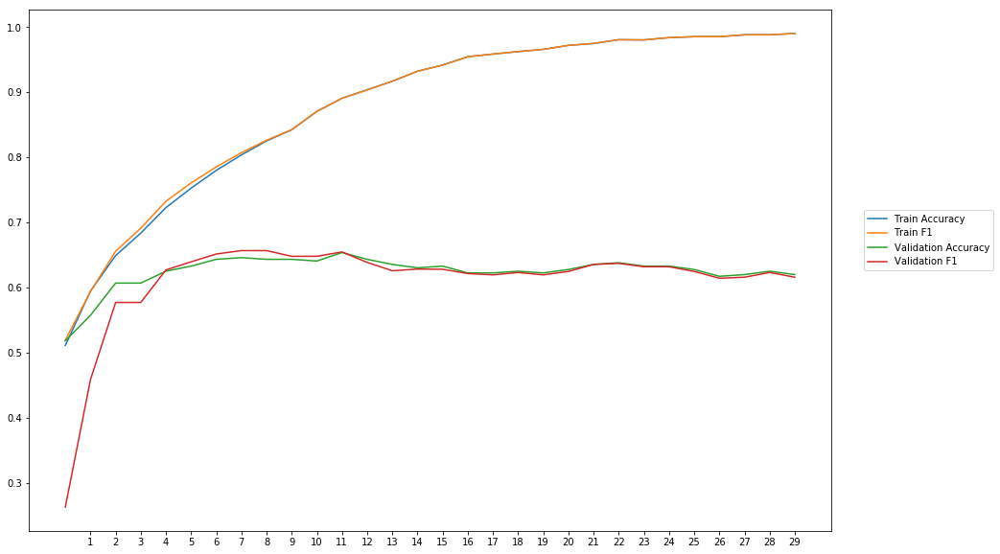

Average Accuracy: 62.42%
Average Precision: 62.41%
Average Recall: 60.56%
Average F1: 61.05%

-----Fold 3--------


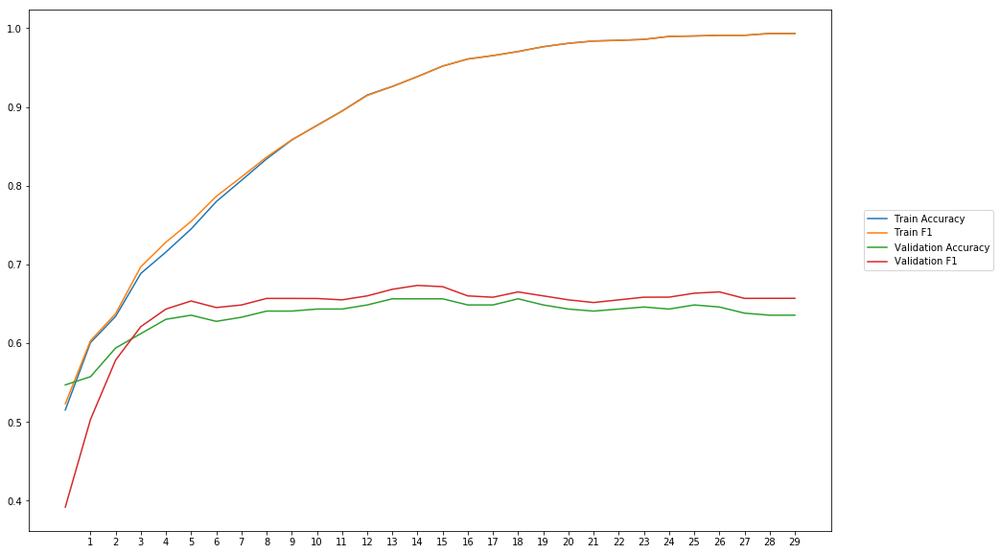

Average Accuracy: 63.47%
Average Precision: 62.42%
Average Recall: 66.23%
Average F1: 64.01%

-----Fold 4--------


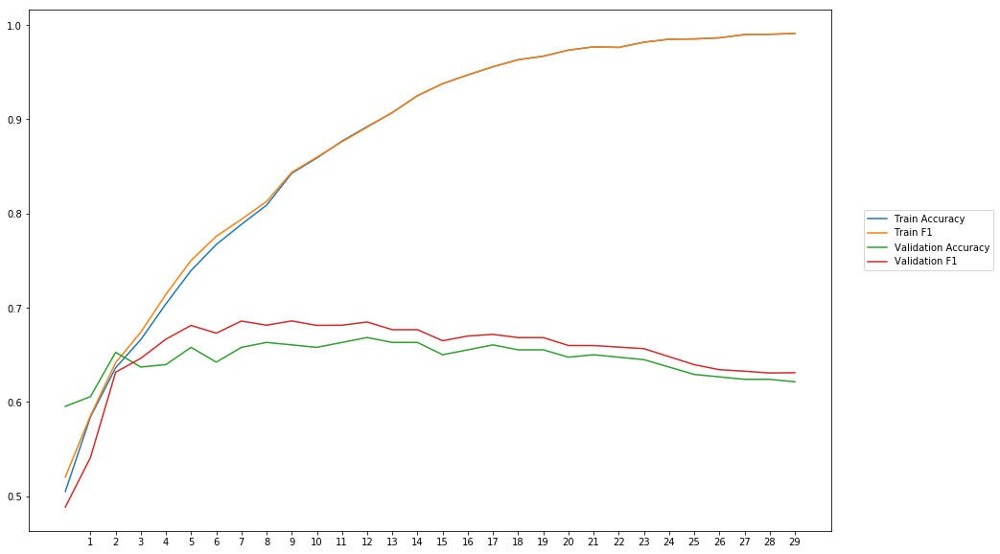

Average Accuracy: 64.53%
Average Precision: 63.66%
Average Recall: 67.50%
Average F1: 65.26%

-----Fold 5--------


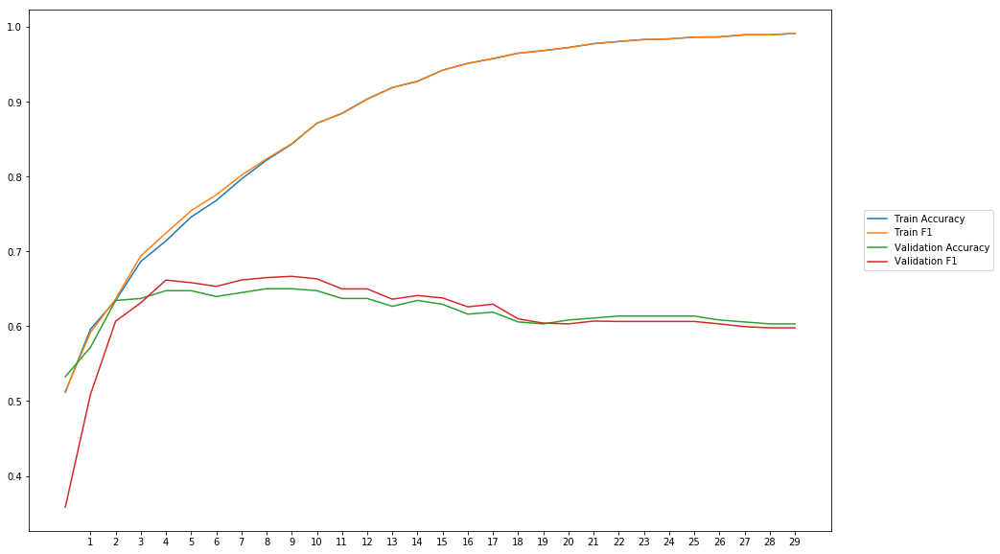

Average Accuracy: 62.02%
Average Precision: 61.83%
Average Recall: 61.76%
Average F1: 61.51%

-----Fold 6--------


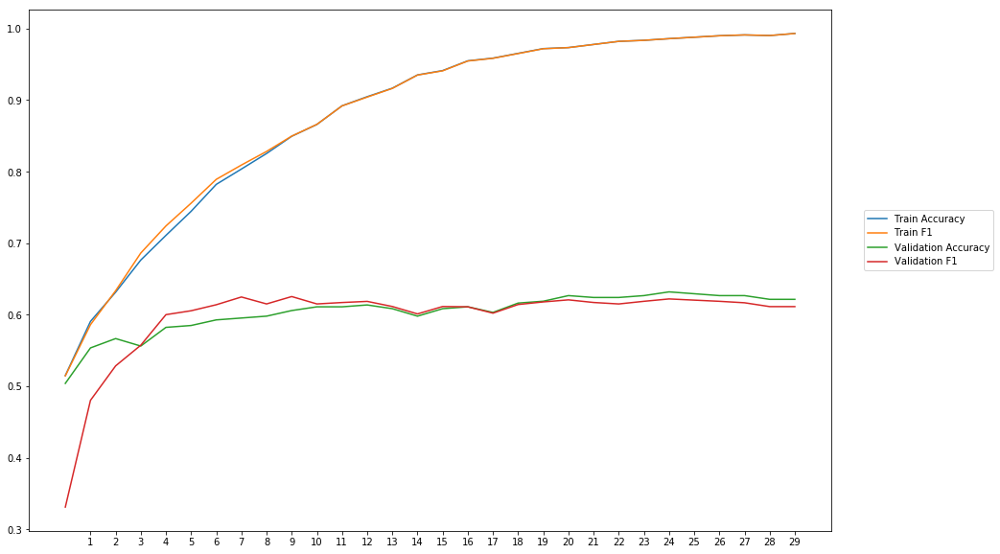

Average Accuracy: 60.32%
Average Precision: 60.26%
Average Recall: 59.39%
Average F1: 59.57%

-----Fold 7--------


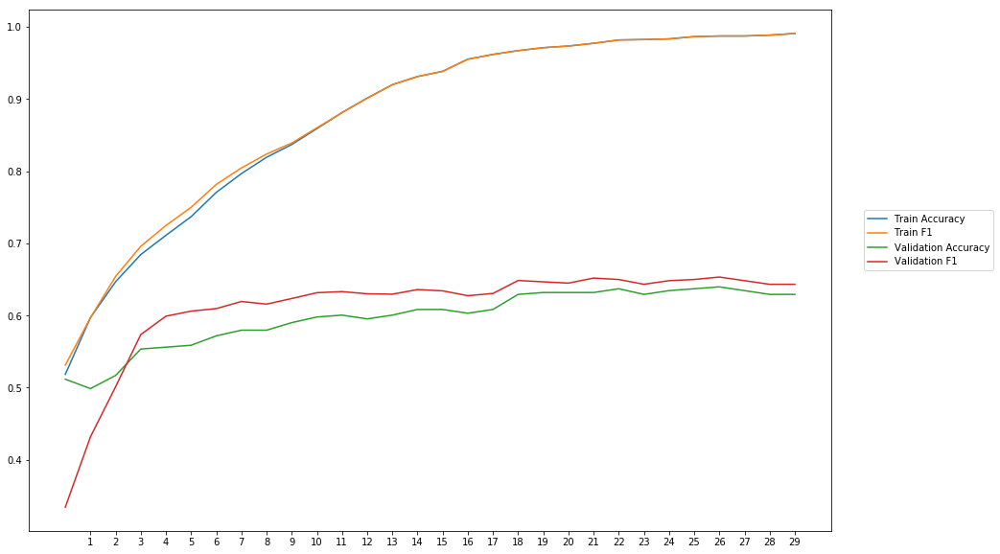

Average Accuracy: 59.78%
Average Precision: 58.65%
Average Recall: 64.50%
Average F1: 61.13%

-----Fold 8--------


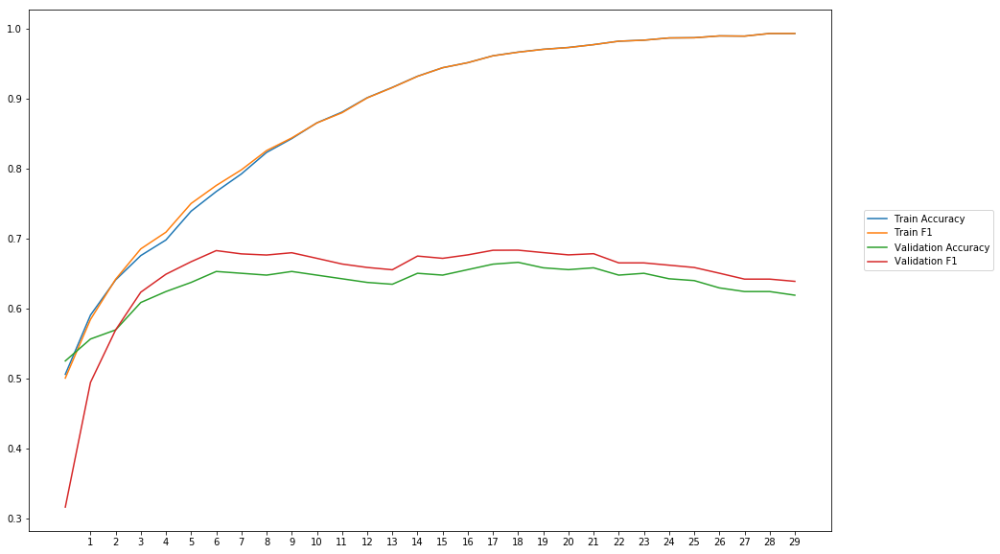

Average Accuracy: 63.38%
Average Precision: 61.92%
Average Recall: 67.99%
Average F1: 64.43%

-----Fold 9--------


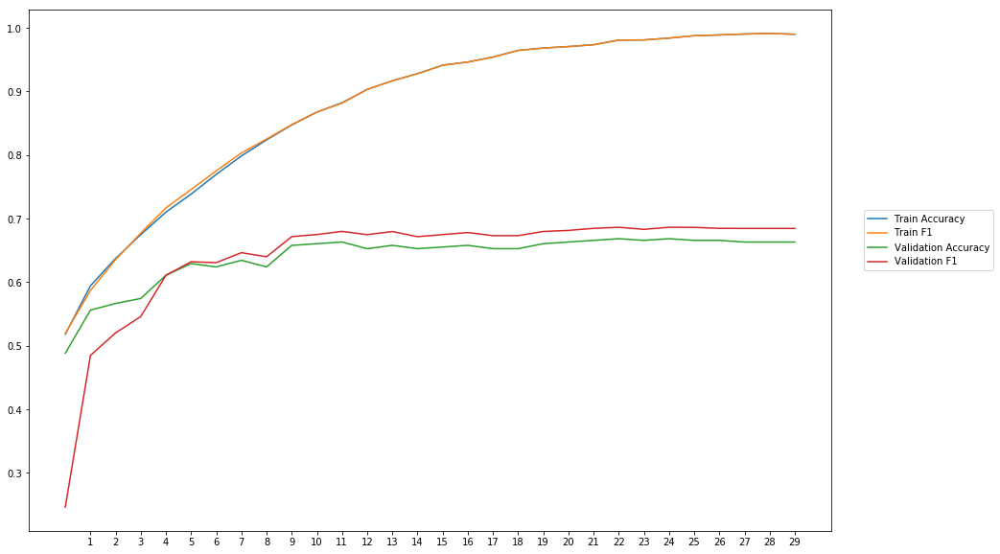

Average Accuracy: 63.95%
Average Precision: 62.60%
Average Recall: 66.60%
Average F1: 64.12%

-----Fold 10--------


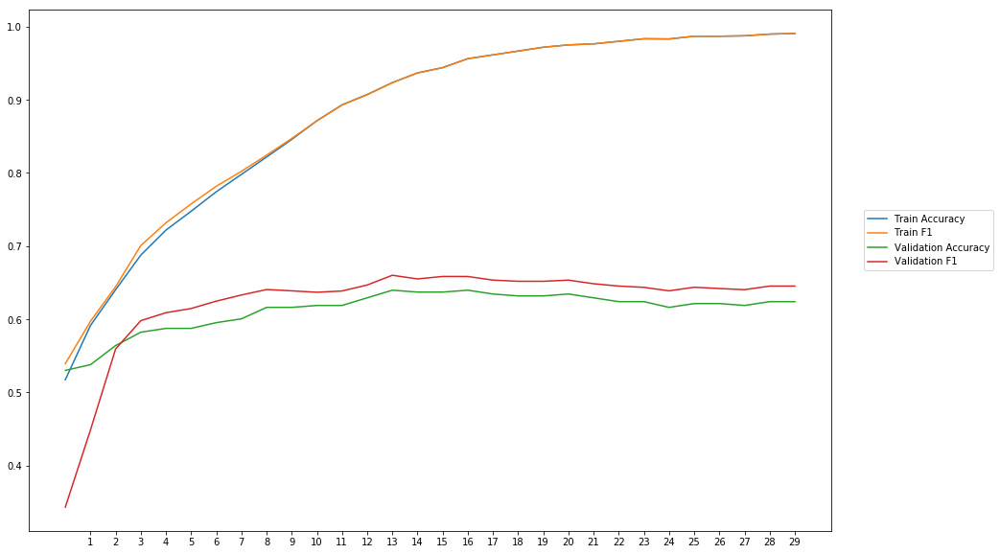

Average Accuracy: 61.24%
Average Precision: 60.15%
Average Recall: 65.24%
Average F1: 62.23%

-------Overallresults-------


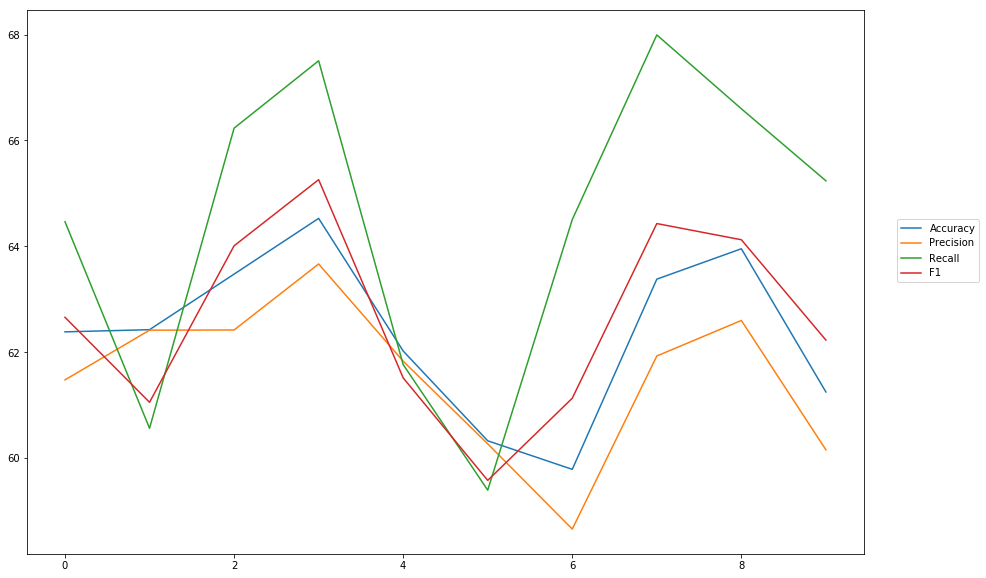

Accuracy: Mean = 62.35% (+/- 1.47%), Max = 64.53%, Min =  59.78%
Precision: Mean = 61.54% (+/- 1.39%), Max = 63.66%, Min =  58.65%
Recall: Mean = 64.42% (+/- 2.80%), Max = 67.99%, Min =  59.39%
F1: Mean = 62.60% (+/- 1.73%), Max = 65.26%, Min =  59.57%


In [35]:
cross_val_three_inputs(model_13, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInput0_1')

## Droput on hidden layer

### dropout rate = 0.1

In [10]:
#Word Embeddings
wv_layer_14 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_14 = wv_layer_14(input_embedding_14)
x_embedding_14 = Dense(600, activation='relu')(embedded_sequences_14)
x_embedding_14 = Dropout(0.1)(x_embedding_14)
x_embedding_14 = Flatten()(x_embedding_14)

#Sentiment Features
input_sentiment_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_14 = Dense(600, activation='relu')(input_sentiment_14)
x_sentiment_14 = Dropout(0.1)(x_sentiment_14)

#POS Features
input_pos_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_14 = Dense(600, activation='relu')(input_pos_14)
x_pos_14 = Dropout(0.1)(x_pos_14)

#Concatination
concat_14 = concatenate([x_embedding_14, x_sentiment_14, x_pos_14])
preds_14 = Dense(2, activation='softmax')(concat_14)

model_14 = Model(inputs=[input_embedding_14, input_sentiment_14, input_pos_14], outputs=preds_14)

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.



-----Fold 1--------


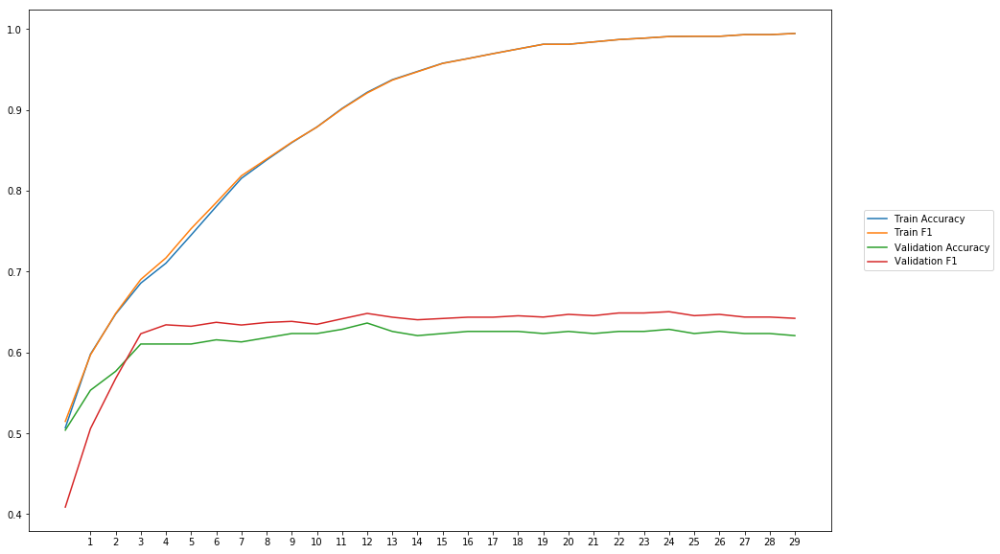

Average Accuracy: 61.47%
Average Precision: 60.32%
Average Recall: 65.54%
Average F1: 62.69%

-----Fold 2--------


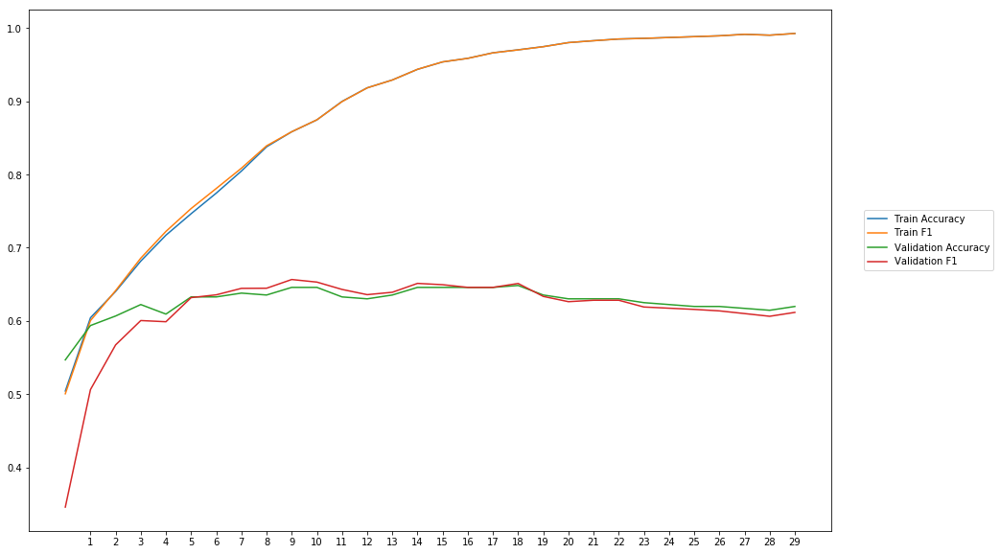

Average Accuracy: 62.68%
Average Precision: 62.85%
Average Recall: 60.98%
Average F1: 61.53%

-----Fold 3--------


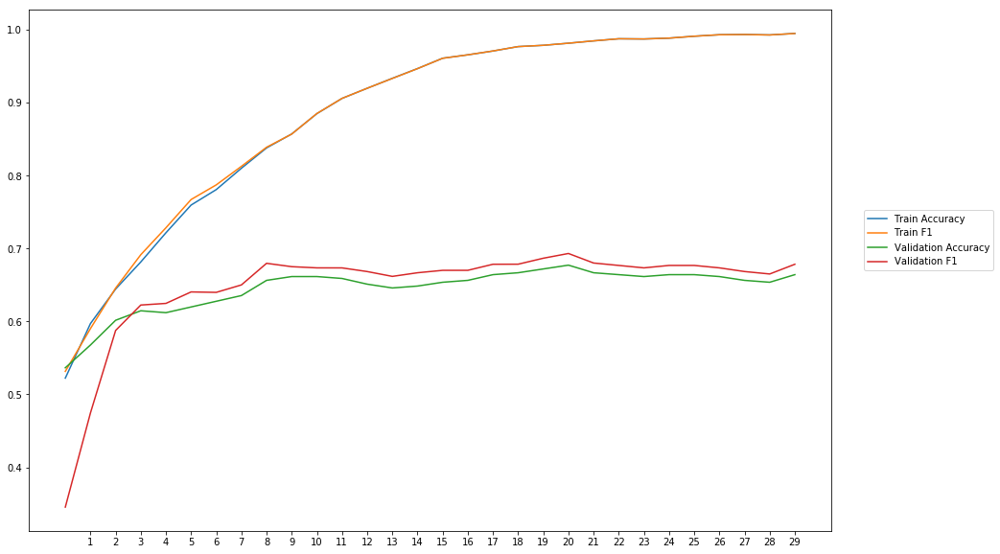

Average Accuracy: 64.48%
Average Precision: 63.38%
Average Recall: 67.00%
Average F1: 64.76%

-----Fold 4--------


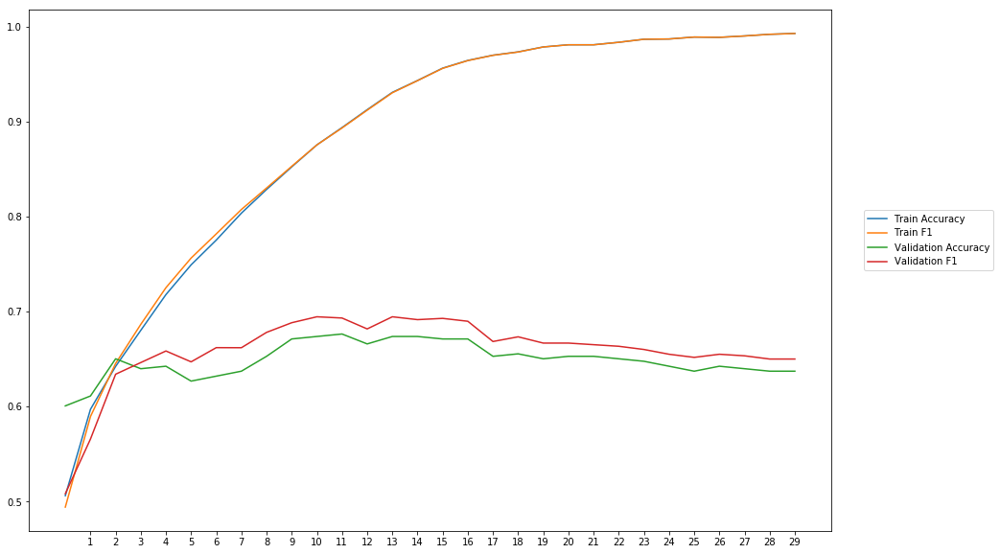

Average Accuracy: 64.88%
Average Precision: 63.80%
Average Recall: 68.53%
Average F1: 65.88%

-----Fold 5--------


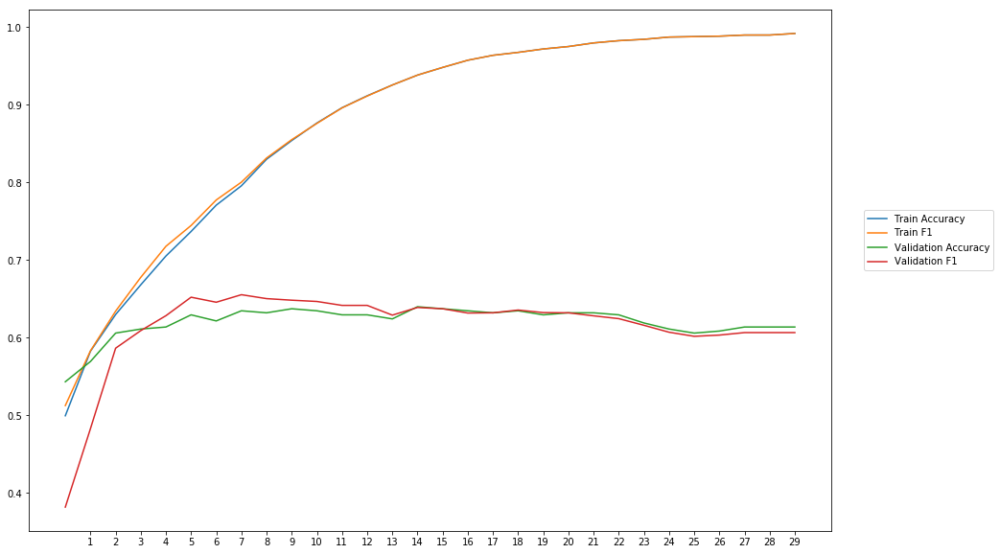

Average Accuracy: 61.99%
Average Precision: 61.90%
Average Recall: 61.59%
Average F1: 61.45%

-----Fold 6--------


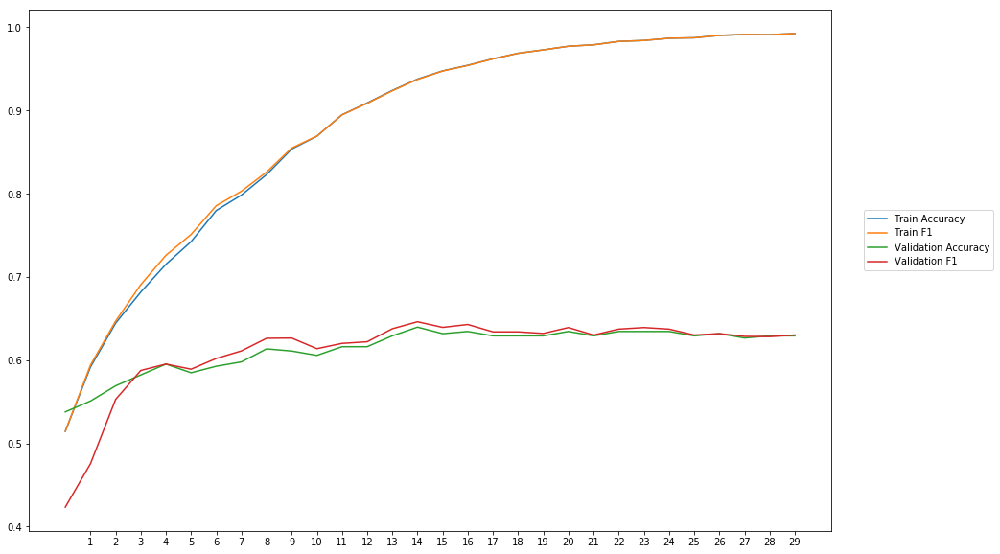

Average Accuracy: 61.37%
Average Precision: 61.09%
Average Recall: 61.52%
Average F1: 61.15%

-----Fold 7--------


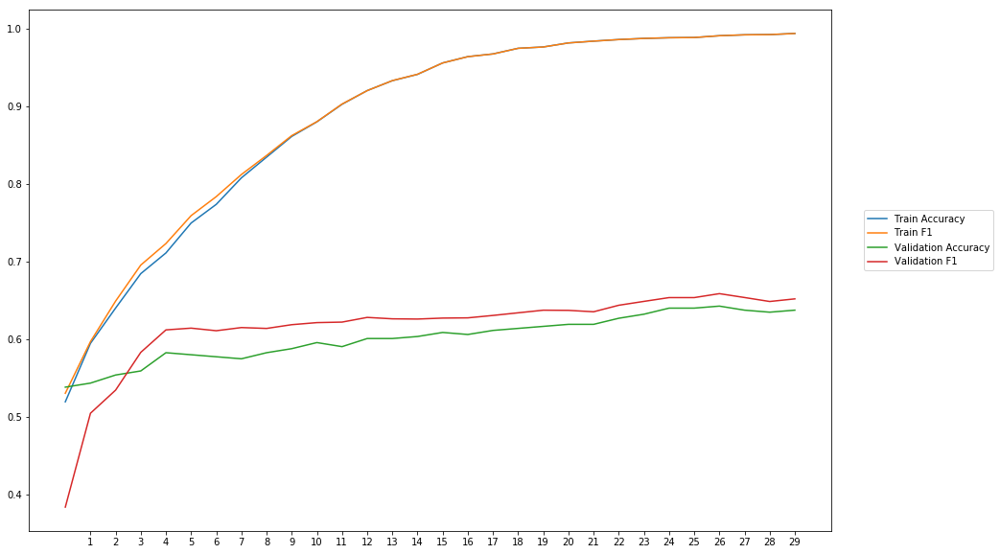

Average Accuracy: 60.16%
Average Precision: 59.19%
Average Recall: 64.55%
Average F1: 61.49%

-----Fold 8--------


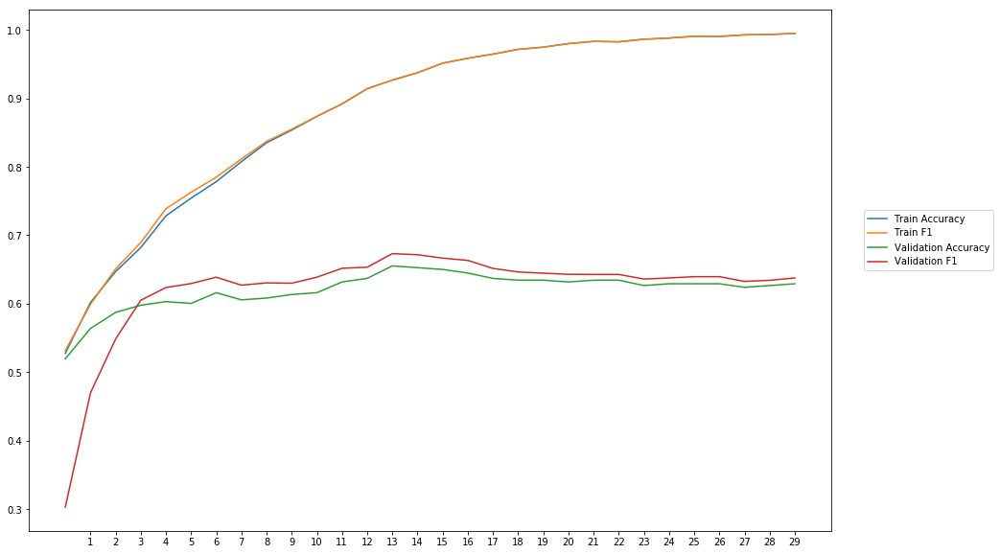

Average Accuracy: 62.02%
Average Precision: 61.28%
Average Recall: 64.00%
Average F1: 62.18%

-----Fold 9--------


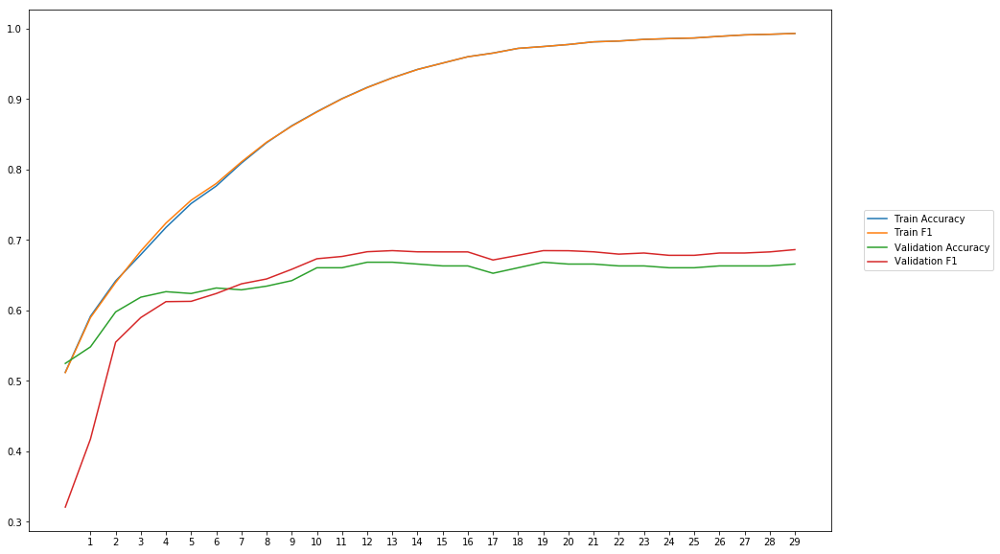

Average Accuracy: 64.48%
Average Precision: 63.62%
Average Recall: 66.09%
Average F1: 64.31%

-----Fold 10--------


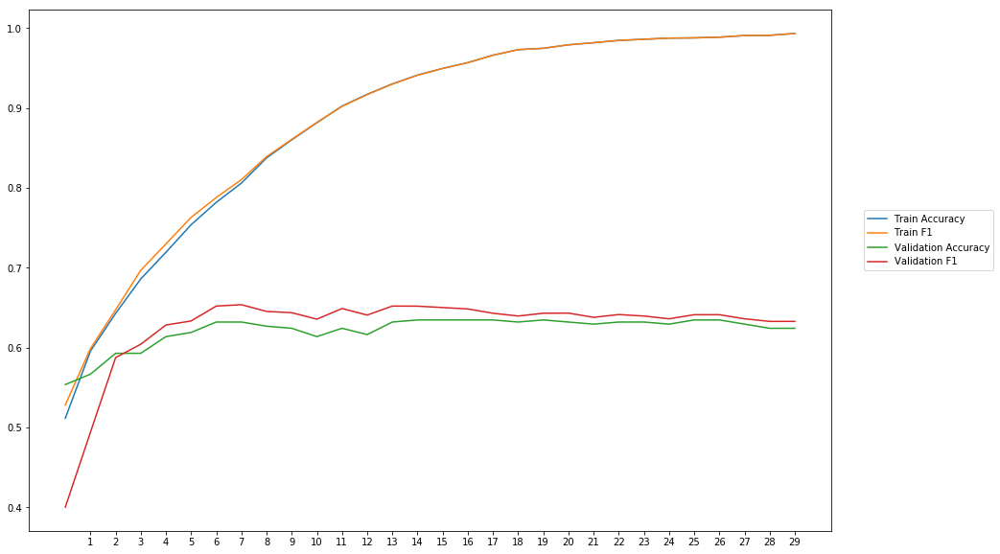

Average Accuracy: 62.14%
Average Precision: 61.48%
Average Recall: 64.31%
Average F1: 62.58%

-------Overallresults-------


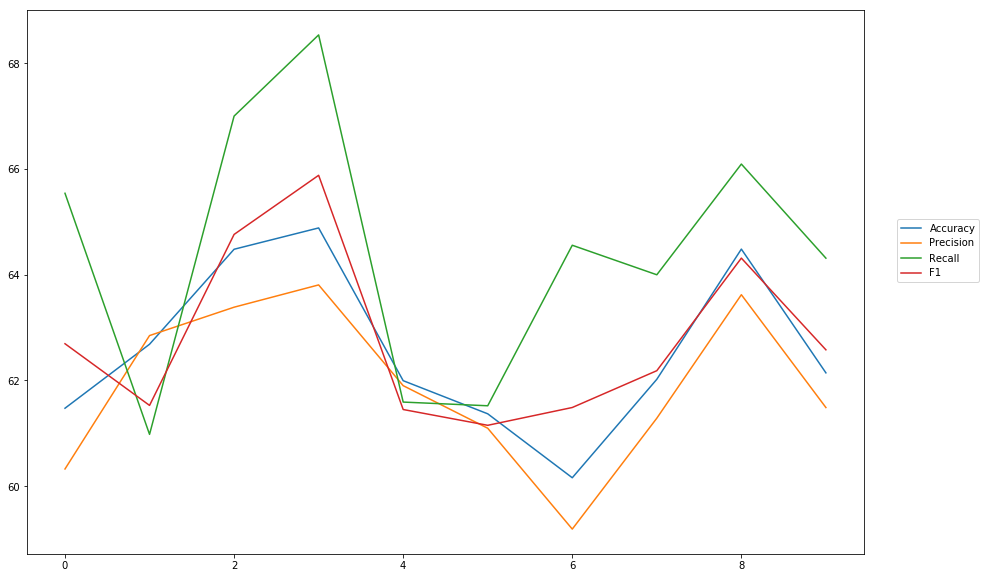

Accuracy: Mean = 62.57% (+/- 1.48%), Max = 64.88%, Min =  60.16%
Precision: Mean = 61.89% (+/- 1.44%), Max = 63.80%, Min =  59.19%
Recall: Mean = 64.41% (+/- 2.37%), Max = 68.53%, Min =  60.98%
F1: Mean = 62.80% (+/- 1.55%), Max = 65.88%, Min =  61.15%


In [37]:
cross_val_three_inputs(model_14, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropHidden0_1')

## Dropout on input and hidden layer

### dropout rate = 0.1

In [38]:
#Word Embeddings
wv_layer_15 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_15 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_15 = wv_layer_15(input_embedding_15)
drop_embedding_15 = Dropout(0.1)(embedded_sequences_15)
x_embedding_15 = Dense(600, activation='relu')(drop_embedding_15)
x_embedding_15 = Dropout(0.1)(x_embedding_15)
x_embedding_15 = Flatten()(x_embedding_15)

#Sentiment Features
input_sentiment_15 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_15 = Dropout(0.1)(input_sentiment_15)
x_sentiment_15 = Dense(600, activation='relu')(drop_sentiment_15)
x_sentiment_15 = Dropout(0.1)(x_sentiment_15)

#POS Features
input_pos_15 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_15 = Dropout(0.1)(input_pos_15)
x_pos_15 = Dense(600, activation='relu')(drop_pos_15)
x_pos_15 = Dropout(0.1)(x_pos_15)

#Concatination
concat_15 = concatenate([x_embedding_15, x_sentiment_15, x_pos_15])
preds_15 = Dense(2, activation='softmax')(concat_15)

model_15 = Model(inputs=[input_embedding_15, input_sentiment_15, input_pos_15], outputs=preds_15)


-----Fold 1--------


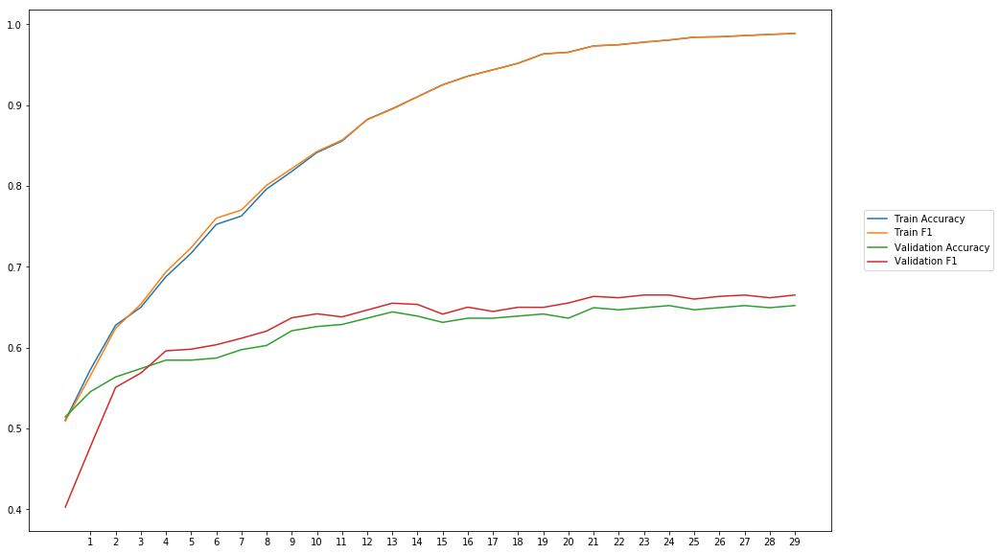

Average Accuracy: 62.05%
Average Precision: 61.21%
Average Recall: 64.25%
Average F1: 62.54%

-----Fold 2--------


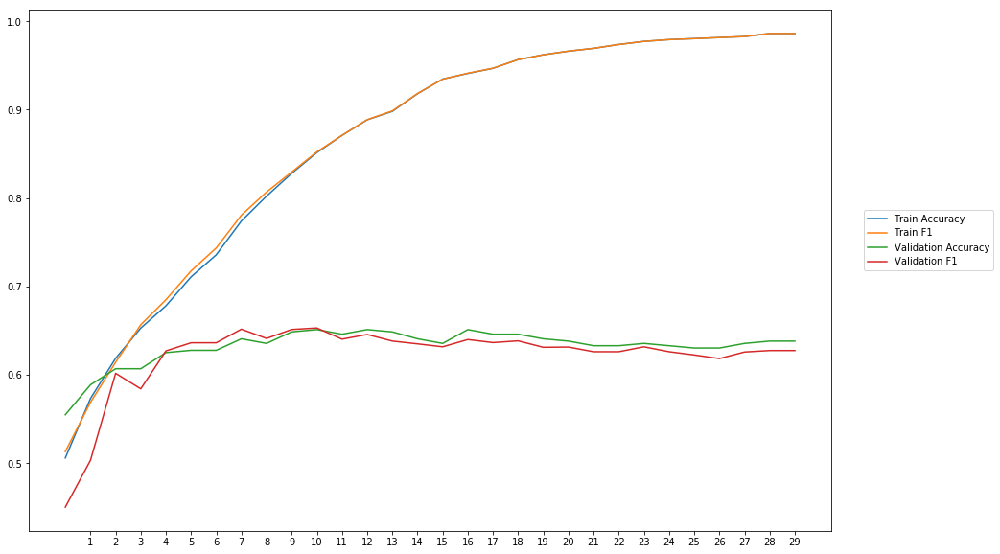

Average Accuracy: 63.20%
Average Precision: 63.47%
Average Recall: 61.10%
Average F1: 62.11%

-----Fold 3--------


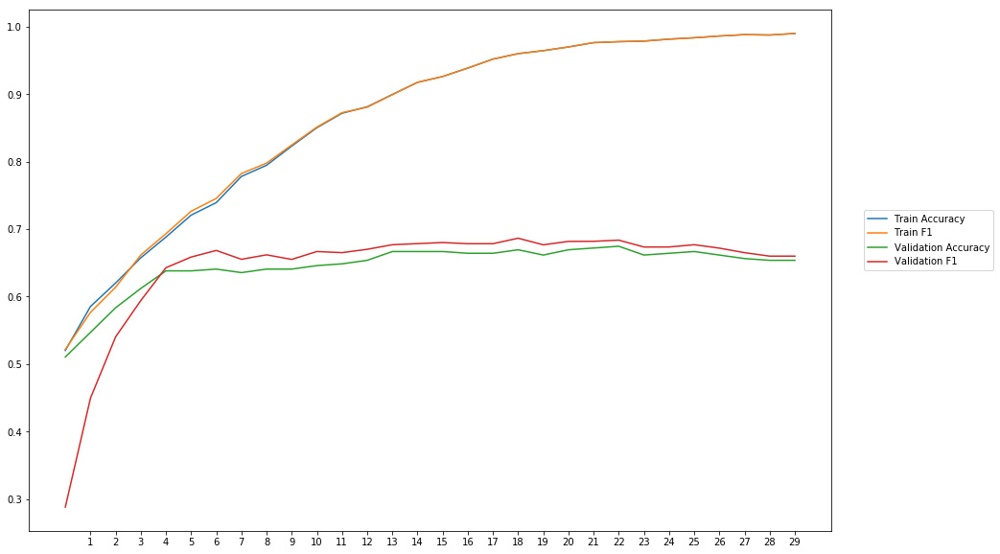

Average Accuracy: 64.42%
Average Precision: 63.32%
Average Recall: 66.23%
Average F1: 64.32%

-----Fold 4--------


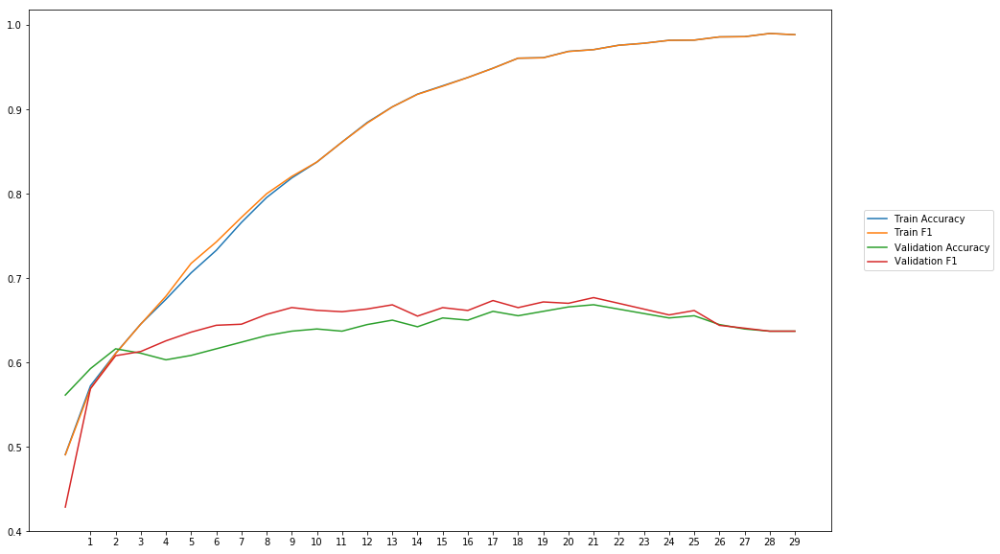

Average Accuracy: 63.72%
Average Precision: 62.98%
Average Recall: 66.18%
Average F1: 64.31%

-----Fold 5--------


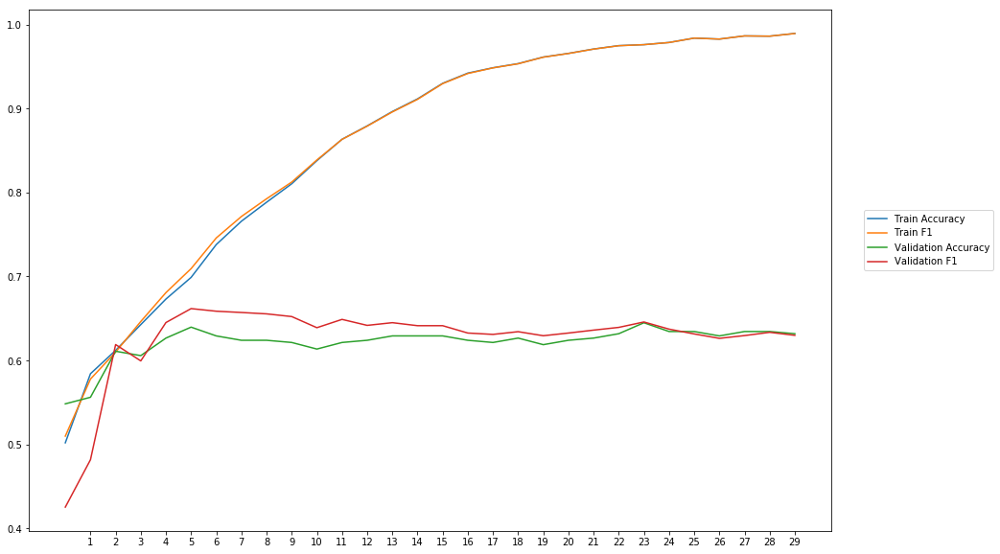

Average Accuracy: 62.17%
Average Precision: 61.51%
Average Recall: 64.28%
Average F1: 62.61%

-----Fold 6--------


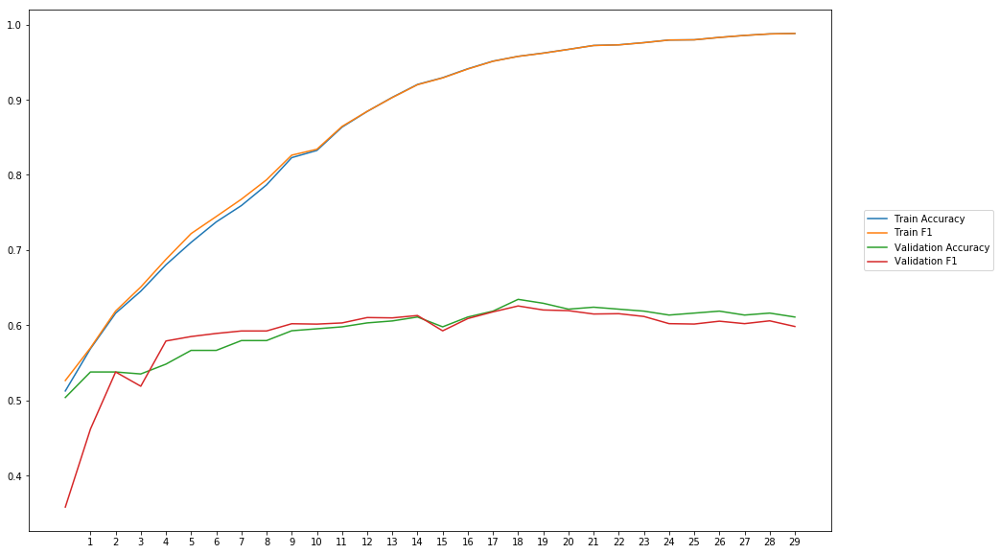

Average Accuracy: 59.43%
Average Precision: 59.45%
Average Recall: 58.25%
Average F1: 58.66%

-----Fold 7--------


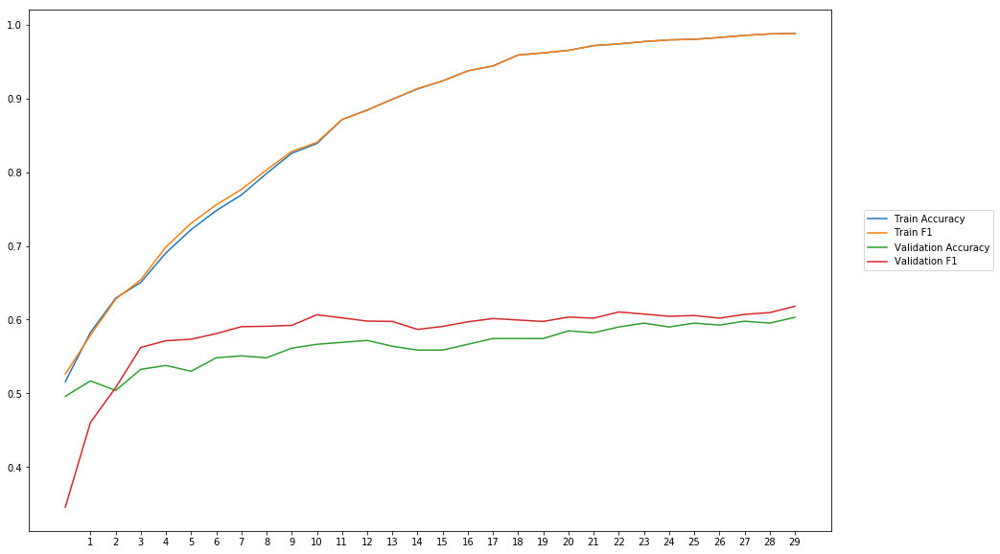

Average Accuracy: 56.44%
Average Precision: 55.66%
Average Recall: 61.22%
Average F1: 58.08%

-----Fold 8--------


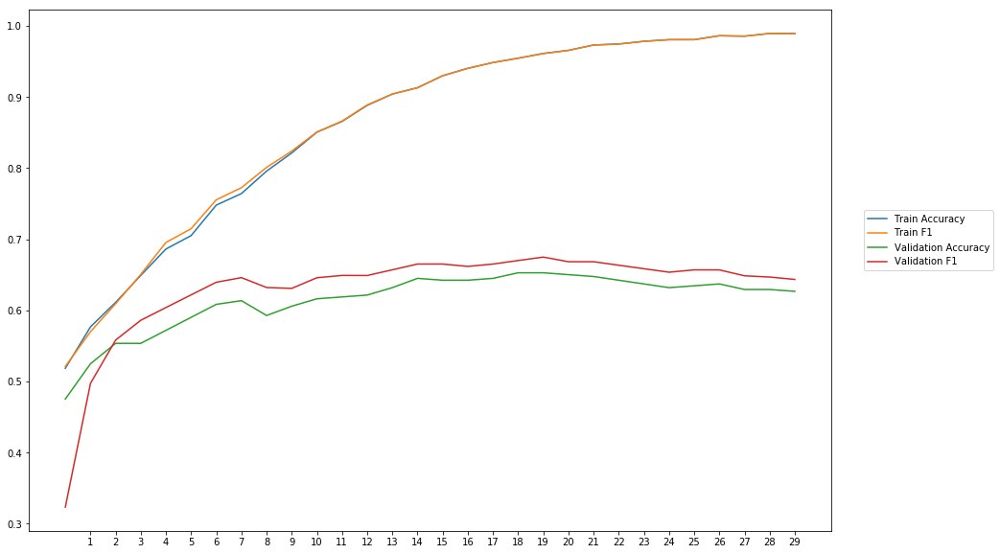

Average Accuracy: 61.41%
Average Precision: 59.88%
Average Recall: 66.89%
Average F1: 63.02%

-----Fold 9--------


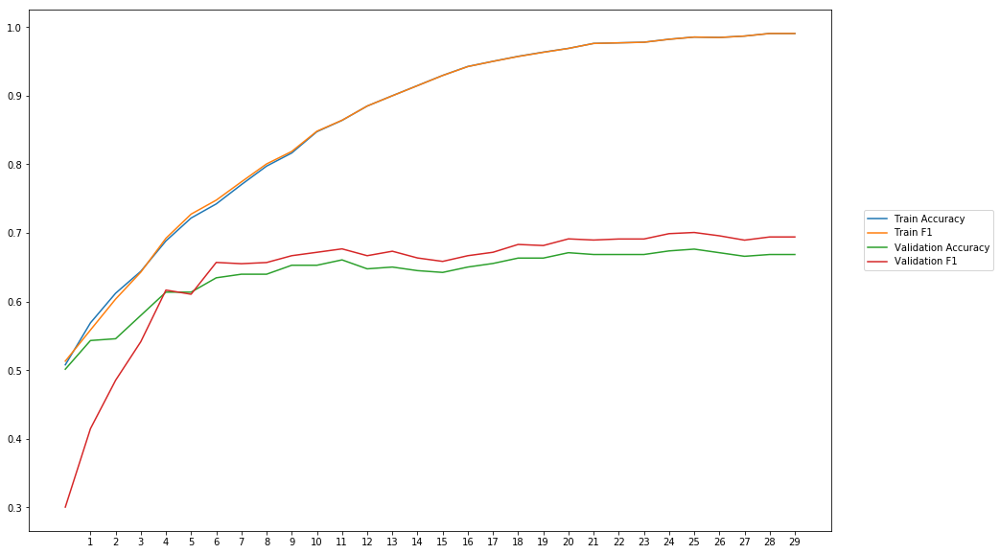

Average Accuracy: 63.98%
Average Precision: 62.60%
Average Recall: 66.88%
Average F1: 64.17%

-----Fold 10--------


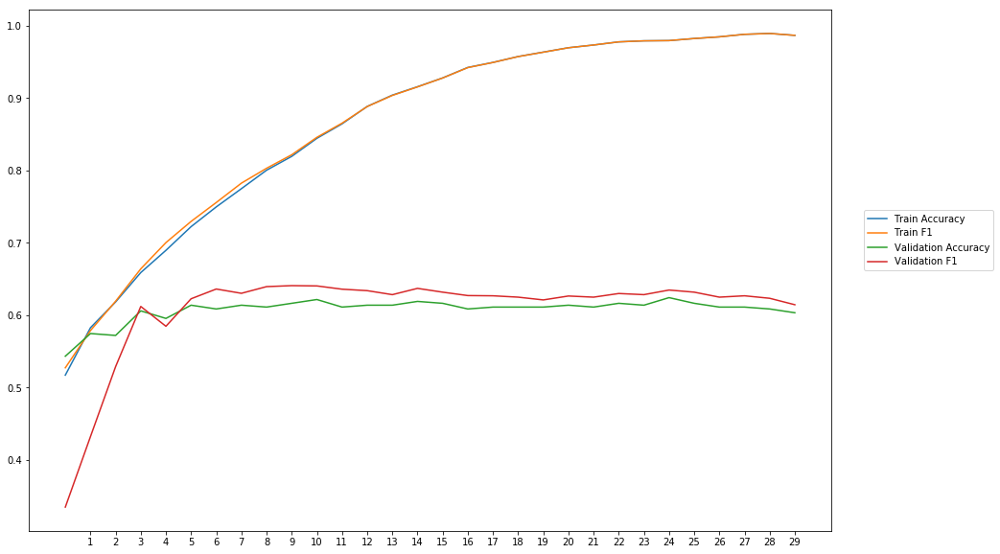

Average Accuracy: 60.72%
Average Precision: 60.35%
Average Recall: 62.37%
Average F1: 60.76%

-------Overallresults-------


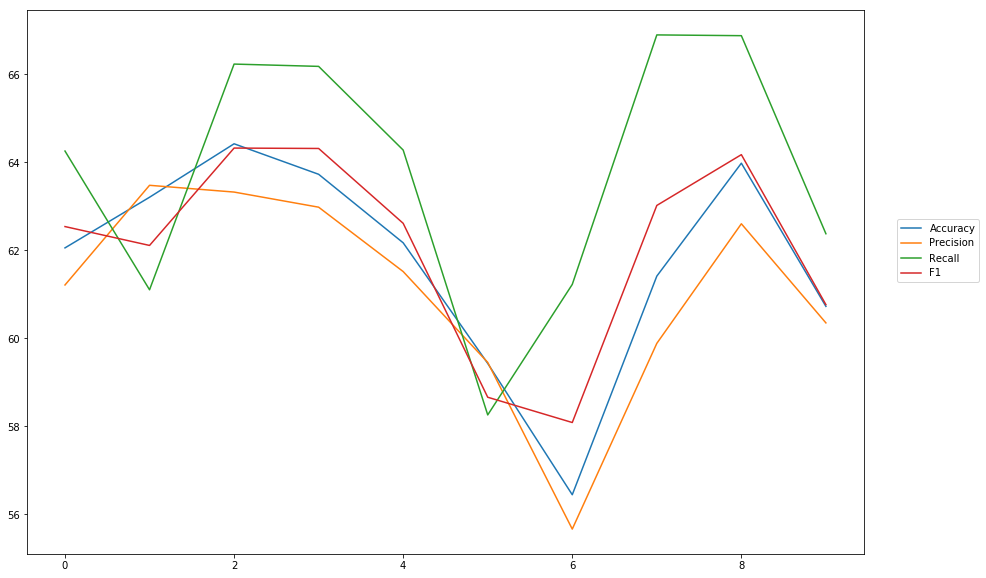

Accuracy: Mean = 61.75% (+/- 2.30%), Max = 64.42%, Min =  56.44%
Precision: Mean = 61.04% (+/- 2.26%), Max = 63.47%, Min =  55.66%
Recall: Mean = 63.77% (+/- 2.79%), Max = 66.89%, Min =  58.25%
F1: Mean = 62.06% (+/- 2.13%), Max = 64.32%, Min =  58.08%


In [39]:
cross_val_three_inputs(model_15, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInputHidden0_1')

## Dropout on input (p=0.2) and hidden (0.5) layer

### dropout rate = 0.1

In [26]:
#Word Embeddings
wv_layer_16 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_16 = wv_layer_16(input_embedding_16)
drop_embedding_16 = Dropout(0.2)(embedded_sequences_16)
x_embedding_16 = Dense(600, activation='relu')(drop_embedding_16)
x_embedding_16 = Dropout(0.5)(x_embedding_16)
x_embedding_16 = Flatten()(x_embedding_16)

#Sentiment Features
input_sentiment_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_sentiment_16 = Dropout(0.2)(input_sentiment_16)
x_sentiment_16 = Dense(600, activation='relu')(drop_sentiment_16)
x_sentiment_16 = Dropout(0.5)(x_sentiment_16)

#POS Features
input_pos_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
drop_pos_16 = Dropout(0.2)(input_pos_16)
x_pos_16 = Dense(600, activation='relu')(drop_pos_16)
x_pos_16 = Dropout(0.5)(x_pos_16)

#Concatination
concat_16 = concatenate([x_embedding_16, x_sentiment_16, x_pos_16])
preds_16 = Dense(2, activation='softmax')(concat_16)

model_16 = Model(inputs=[input_embedding_16, input_sentiment_16, input_pos_16], outputs=preds_16)


-----Fold 1--------


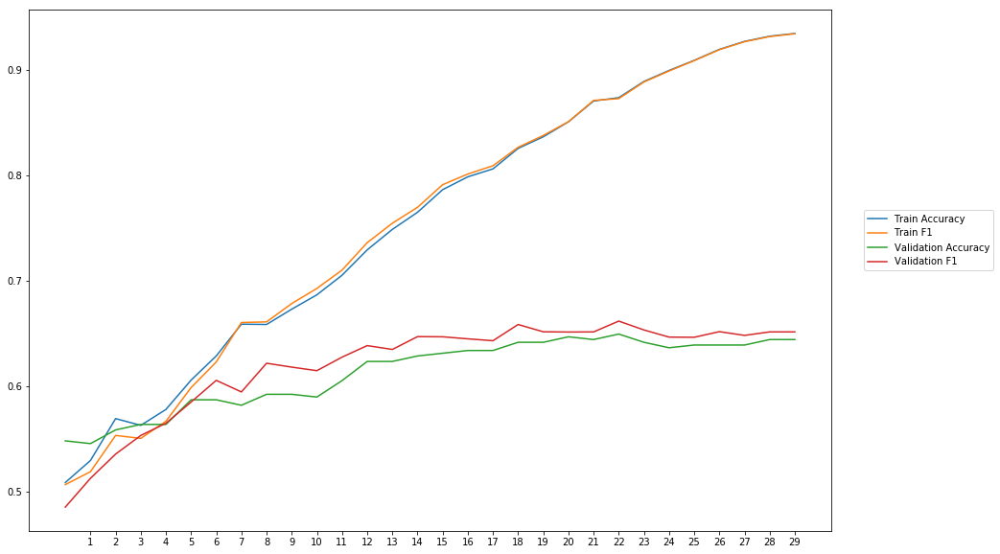

Average Accuracy: 61.32%
Average Precision: 60.60%
Average Recall: 63.63%
Average F1: 61.98%


In [ ]:
cross_val_three_inputs(model_16, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'DropInput0_2Hidden0_5')

# Test the best model with heldout testdata

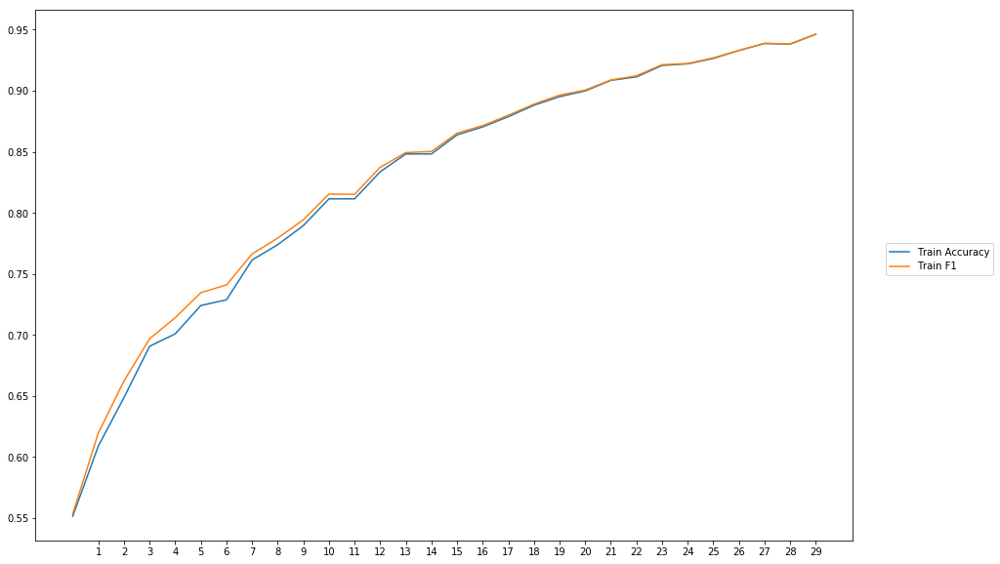


-----Test Scores----
Loss: 0.5898099760619961
Accuracy: 69.38775510204081
Precision: 59.12596399508331
Recall: 73.95498389904985
F1: 65.71428075759222


In [15]:
train_evaluate_three_inputs(model_5, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, test_data, test_senti_blob, test_pos, test_labels, softmax, outputpath, 'final_Dropout')